In [110]:
# use date and time data to perform clustering

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import sklearn.cluster
import numpy as np
import seaborn as sns

data = pd.read_csv('gis_mke_with_nei.csv', index_col=0)
data

,g_case_no,y_lat,x_lng,f_addr,gf_addr,c_case_type,c_violation,c_violation_date,j_finding,year,month,guilty,neighborhood
0,11000001,43.091474,-87.984090,"5700 W CAPITOL DR MILWAUKEE, WI","5700 W Capitol Dr, Milwaukee, WI 53216, USA",Municipal citation,"Ordinance 110-35-1, Retail Theft",2011-01-03 14:40:00.000000,Guilty,2011,1,1,Capitol Heights
1,11000002,43.068454,-87.918139,"2736 N 6TH ST MILWAUKEE, WI","2736 N 6th St, Milwaukee, WI 53212, USA",Municipal citation,"Ordinance 105-138-2, Resisting / Obstructing P...",2011-01-03 16:00:00.000000,Guilty,2011,1,1,Harambee
2,11000009,43.122443,-88.014475,"8223 W THURSTON AVE MILWAUKEE, WI","8223 W Thurston Ave, Milwaukee, WI 53218, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-05-07 00:00:00.000000,Guilty,2010,5,1,Silver Spring
3,11000014,43.056875,-87.941243,"2020 N 23 ST MILWAUKEE, WI","2020 N 23rd St, Milwaukee, WI 53205, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-06-08 00:00:00.000000,Guilty,2010,6,1,Midtown
4,11000024,43.054717,-87.936219,"1840 N 19 ST MILWAUKEE, WI","1840 N 19th St, Milwaukee, WI 53205, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-03-30 00:00:00.000000,Guilty,2010,3,1,Lindsay Heights
5,11000067,43.042648,-87.921272,"749 W STATE ST MILWAUKEE, WI","749 W State St, Milwaukee, WI 53233, USA",Municipal citation,"Ordinance 106-38-2, Possession of Marijuana",2010-11-27 21:50:00.000000,Guilty,2010,11,1,Westown
6,11000079,43.058142,-87.947781,"2113 N 27TH ST MILWAUKEE, WI","2113 N 27th St, Milwaukee, WI 53208, USA",Municipal citation,"Ordinance 50-25-5, Resist or Obstruct Issuance...",2010-11-29 01:15:00.000000,Guilty,2010,11,1,Midtown
7,11000084,43.010455,-87.960779,"3708 W BURNHAM ST MILWAUKEE, WI","3708 W Burnham St, Milwaukee, WI 53215, USA",Municipal citation,"Ordinance 95-14-2-a, Home Improvement Contract...",2010-10-18 12:00:00.000000,Guilty,2010,10,1,Burnham Park
8,11000086,43.038363,-87.914639,"275 W WISCONSIN AVE MILWAUKEE, WI","275 W Wisconsin Ave, Milwaukee, WI 53203, USA",Municipal citation,"Ordinance 110-32-1-a, Fraud on Hotel or Restau...",2010-11-27 23:45:00.000000,Guilty,2010,11,1,Westown
9,11000087,43.039199,-87.915426,"310 W WISCONSIN AVE MILWAUKEE, WI","500, 310 W Wisconsin Ave, Milwaukee, WI 53203,...",Municipal citation,"Ordinance 106-1-1, Disorderly Conduct",2010-12-01 09:19:00.000000,Guilty,2010,12,1,Westown


In [111]:
colors = np.array(['darkturquoise', 'coral', 'skyblue', 'gold', 'lightgreen', 'green', 'mediumaquamarine', 
                   'pink', 'deepskyblue',  'lightsteelblue', 'blue', 'navy', 'rebeccapurple',
                   'mediumorchid', 'hotpink', 'red','crimson', 'dimgrey'])

In [112]:
def getTime(s):
    return pd.to_numeric(s[11:13]) + (pd.to_numeric(s[14:16])/60)

def getDayOfWeek(y, m, d):
    monthCode = {
        1:0, 2:3, 3:3,
        4:6, 5:1, 6:4,
        7:6, 8:2, 9:5,
        10:0, 11:3, 12:5
    }
    yy = pd.to_numeric(str(y)[2:4])
    yearCode = (yy + (yy // 4)) % 7
    centuryCode = 6
    leapYear = 1 if (y % 4 == 0) else 0
    return (yearCode + monthCode[m] + centuryCode + d - leapYear) % 7
    #SOURCE: https://blog.artofmemory.com/how-to-calculate-the-day-of-the-week-4203.html
    #0=Sunday .. 6=Saturday
    
def getTimeOfWeek(day, time):
    return (day*24) + time

data['time_of_day'] = data.apply(lambda row: getTime(row['c_violation_date']), axis=1)
data['day'] = data.apply(lambda row: pd.to_numeric(row['c_violation_date'][8:10]), axis=1)
data['day_of_week'] = data.apply(lambda row: getDayOfWeek(row['year'], row['month'], row['day']), axis=1)
data['time_of_week'] = data.apply(lambda row: getTimeOfWeek(row['day_of_week'], row['time_of_day']), axis=1)
data

,g_case_no,y_lat,x_lng,f_addr,gf_addr,c_case_type,c_violation,c_violation_date,j_finding,year,month,guilty,neighborhood,time_of_day,day,day_of_week,time_of_week
0,11000001,43.091474,-87.984090,"5700 W CAPITOL DR MILWAUKEE, WI","5700 W Capitol Dr, Milwaukee, WI 53216, USA",Municipal citation,"Ordinance 110-35-1, Retail Theft",2011-01-03 14:40:00.000000,Guilty,2011,1,1,Capitol Heights,14.666667,3,1,38.666667
1,11000002,43.068454,-87.918139,"2736 N 6TH ST MILWAUKEE, WI","2736 N 6th St, Milwaukee, WI 53212, USA",Municipal citation,"Ordinance 105-138-2, Resisting / Obstructing P...",2011-01-03 16:00:00.000000,Guilty,2011,1,1,Harambee,16.000000,3,1,40.000000
2,11000009,43.122443,-88.014475,"8223 W THURSTON AVE MILWAUKEE, WI","8223 W Thurston Ave, Milwaukee, WI 53218, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-05-07 00:00:00.000000,Guilty,2010,5,1,Silver Spring,0.000000,7,5,120.000000
3,11000014,43.056875,-87.941243,"2020 N 23 ST MILWAUKEE, WI","2020 N 23rd St, Milwaukee, WI 53205, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-06-08 00:00:00.000000,Guilty,2010,6,1,Midtown,0.000000,8,2,48.000000
4,11000024,43.054717,-87.936219,"1840 N 19 ST MILWAUKEE, WI","1840 N 19th St, Milwaukee, WI 53205, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-03-30 00:00:00.000000,Guilty,2010,3,1,Lindsay Heights,0.000000,30,2,48.000000
5,11000067,43.042648,-87.921272,"749 W STATE ST MILWAUKEE, WI","749 W State St, Milwaukee, WI 53233, USA",Municipal citation,"Ordinance 106-38-2, Possession of Marijuana",2010-11-27 21:50:00.000000,Guilty,2010,11,1,Westown,21.833333,27,6,165.833333
6,11000079,43.058142,-87.947781,"2113 N 27TH ST MILWAUKEE, WI","2113 N 27th St, Milwaukee, WI 53208, USA",Municipal citation,"Ordinance 50-25-5, Resist or Obstruct Issuance...",2010-11-29 01:15:00.000000,Guilty,2010,11,1,Midtown,1.250000,29,1,25.250000
7,11000084,43.010455,-87.960779,"3708 W BURNHAM ST MILWAUKEE, WI","3708 W Burnham St, Milwaukee, WI 53215, USA",Municipal citation,"Ordinance 95-14-2-a, Home Improvement Contract...",2010-10-18 12:00:00.000000,Guilty,2010,10,1,Burnham Park,12.000000,18,1,36.000000
8,11000086,43.038363,-87.914639,"275 W WISCONSIN AVE MILWAUKEE, WI","275 W Wisconsin Ave, Milwaukee, WI 53203, USA",Municipal citation,"Ordinance 110-32-1-a, Fraud on Hotel or Restau...",2010-11-27 23:45:00.000000,Guilty,2010,11,1,Westown,23.750000,27,6,167.750000
9,11000087,43.039199,-87.915426,"310 W WISCONSIN AVE MILWAUKEE, WI","500, 310 W Wisconsin Ave, Milwaukee, WI 53203,...",Municipal citation,"Ordinance 106-1-1, Disorderly Conduct",2010-12-01 09:19:00.000000,Guilty,2010,12,1,Westown,9.316667,1,3,81.316667


In [113]:
data[(data['time_of_day'] == 0.0)].c_violation.value_counts()

Ordinance 200 through 295, Building Code Violations                 10155
Ordinance 106-1-1, Disorderly Conduct                                  12
Ordinance 105-138-2, Resisting / Obstructing Police Officer             7
Ordinance 105-2, Assault and Battery                                    4
Ordinance 106-36-3-a, Possession of Drug Paraphernalia                  3
Ordinance 106-31-1, Loitering or Prowling                               3
Ordinance 303-11-1, Financial Disclosure Required                       3
Ordinance 110-15, Vandalism                                             3
Ordinance 90-18-2, Possession of Alcohol by Underage Person             3
Ordinance 90-19-1, Presence of Minor at Licensed Premises               2
Ordinance 200-51.7-4-a, Registration Stmt Reqd - Vacant Building        2
Ordinance 200-51.7-7, Fail to Provide Access for Inspection             2
Ordinance 78-19-1, Permitting Animal at Large                           2
Ordinance 105-34-1-a, Carrying Conceal

For the vast majority of cases (with the exception of building code violations) it appears that officers typically enter the time of day.

<Figure size 432x288 with 0 Axes>

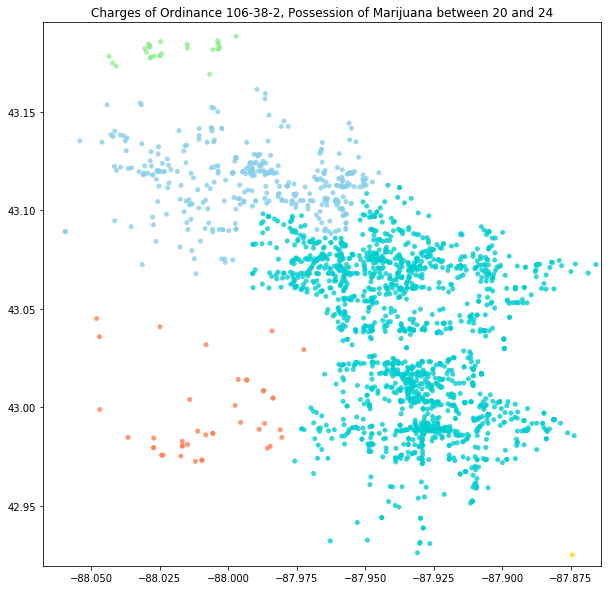

<Figure size 432x288 with 0 Axes>

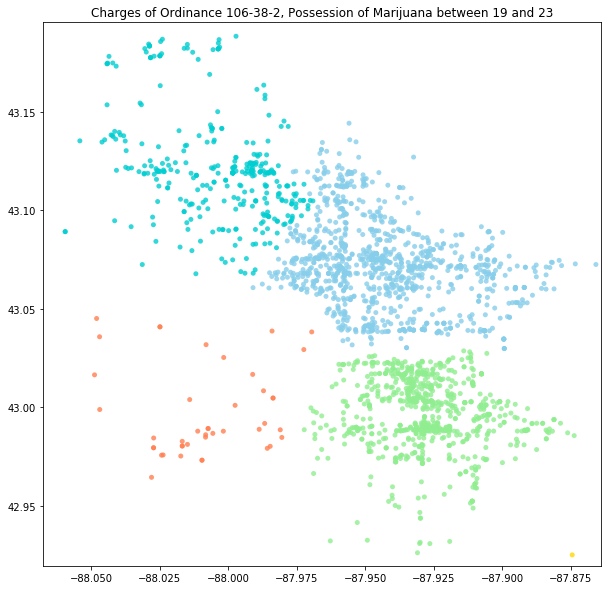

<Figure size 432x288 with 0 Axes>

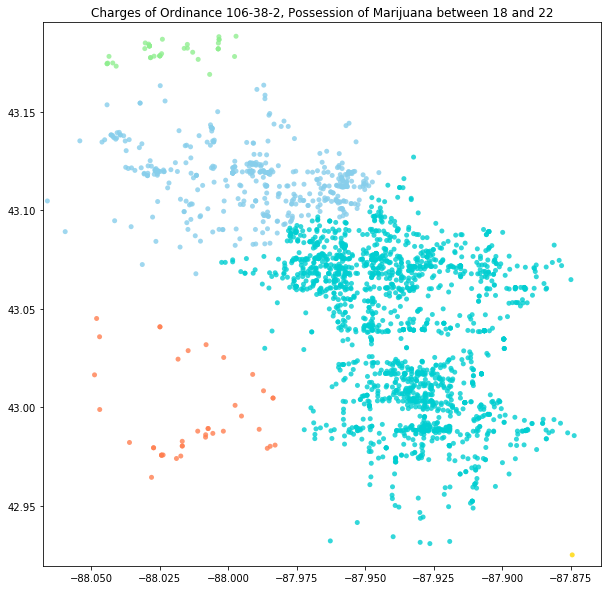

<Figure size 432x288 with 0 Axes>

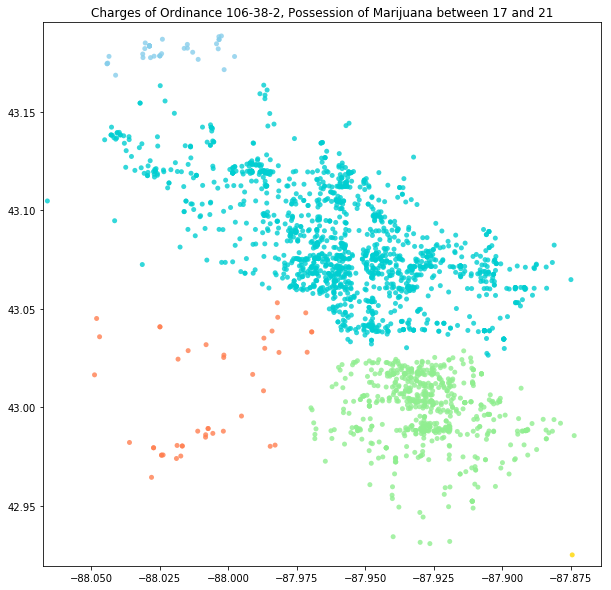

<Figure size 432x288 with 0 Axes>

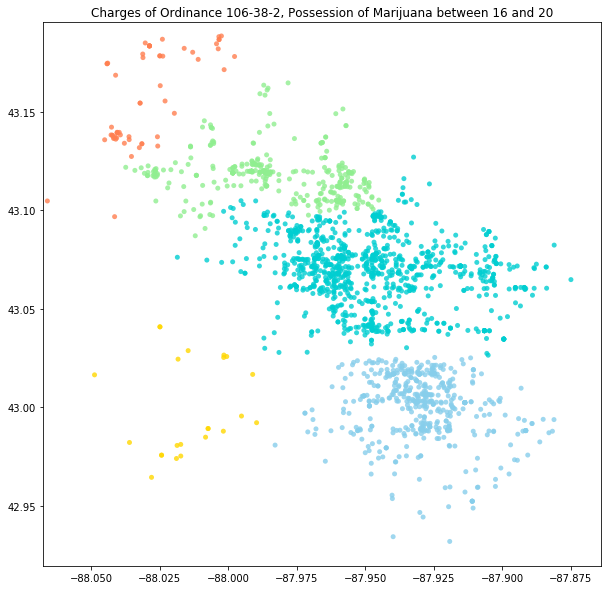

<Figure size 432x288 with 0 Axes>

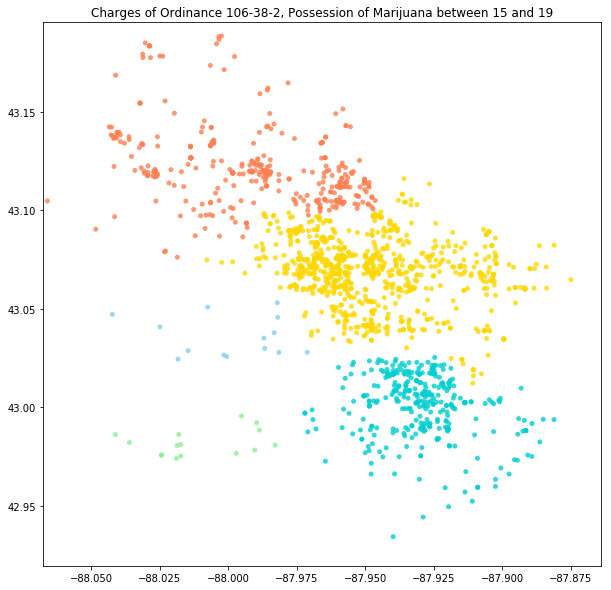

<Figure size 432x288 with 0 Axes>

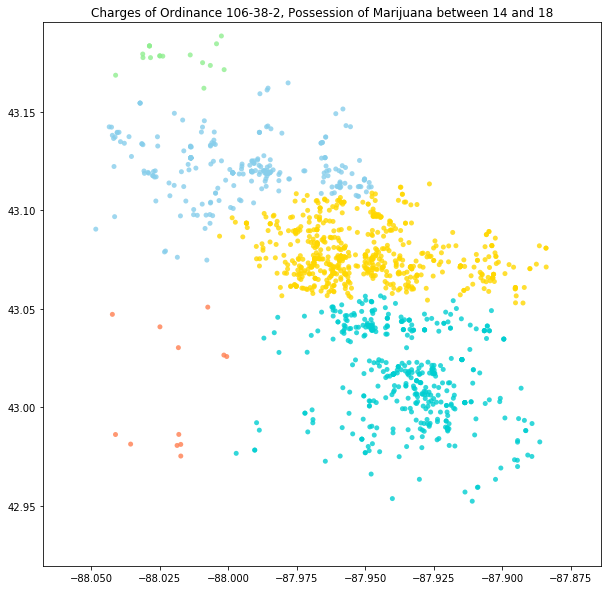

<Figure size 432x288 with 0 Axes>

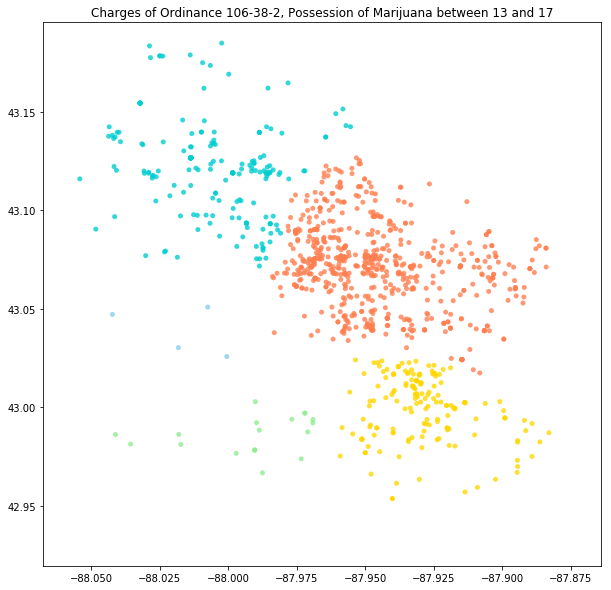

<Figure size 432x288 with 0 Axes>

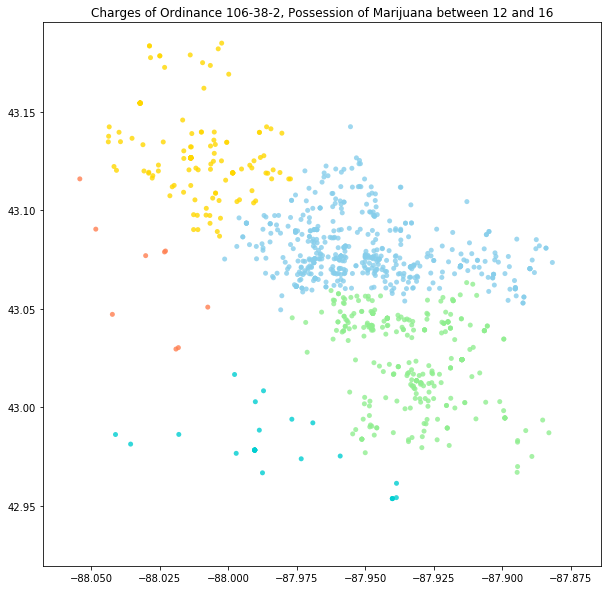

<Figure size 432x288 with 0 Axes>

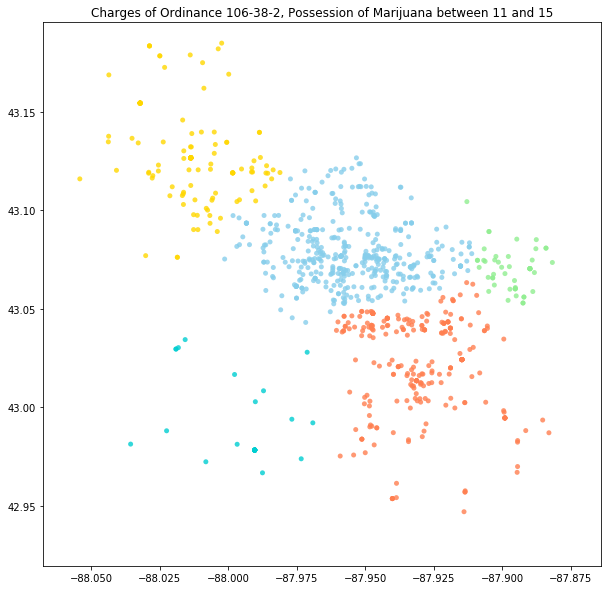

<Figure size 432x288 with 0 Axes>

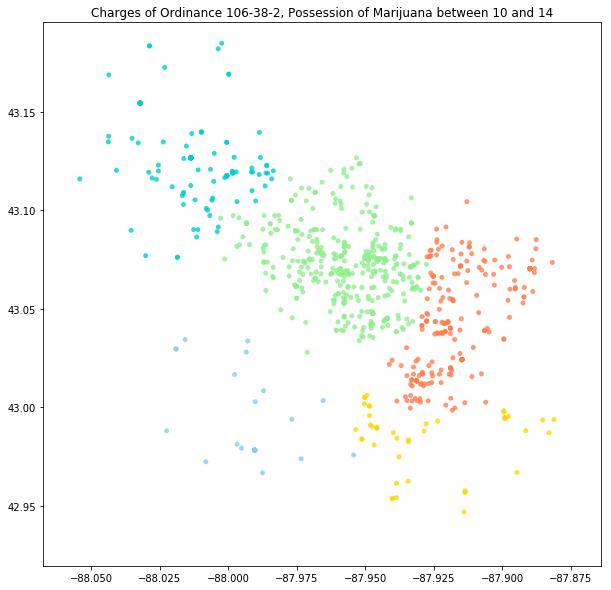

<Figure size 432x288 with 0 Axes>

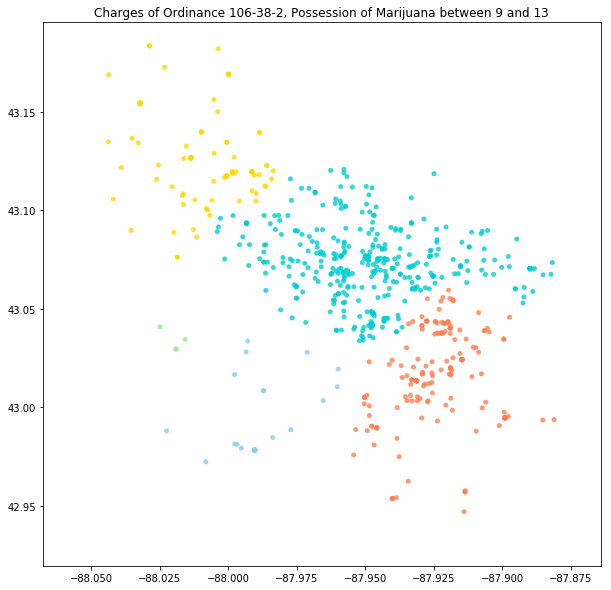

<Figure size 432x288 with 0 Axes>

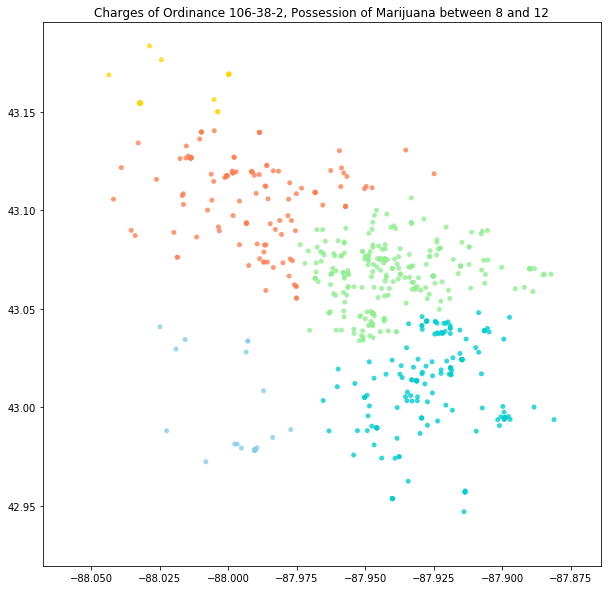

<Figure size 432x288 with 0 Axes>

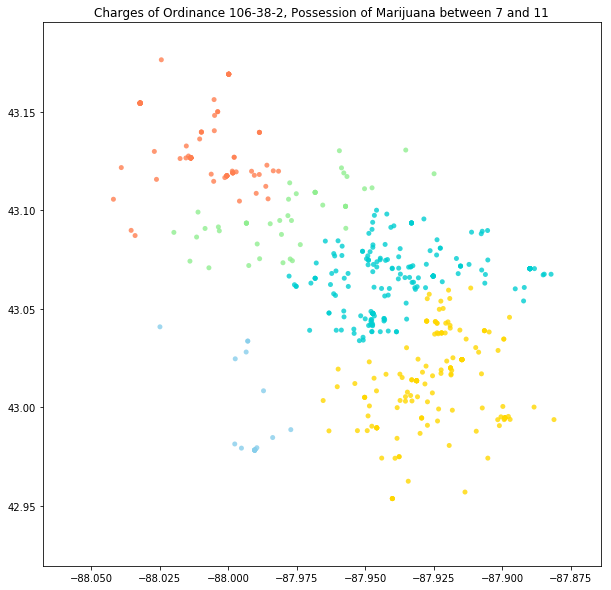

<Figure size 432x288 with 0 Axes>

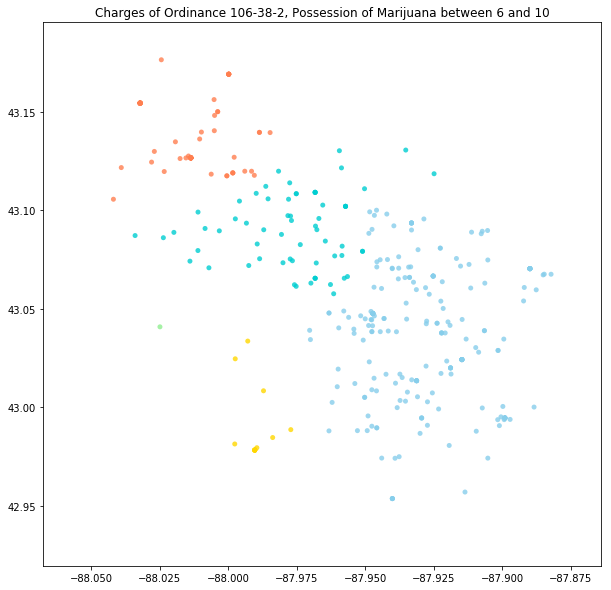

<Figure size 432x288 with 0 Axes>

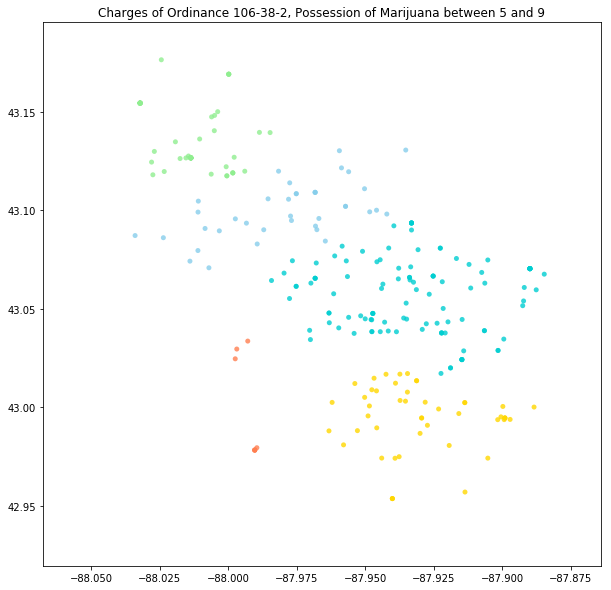

<Figure size 432x288 with 0 Axes>

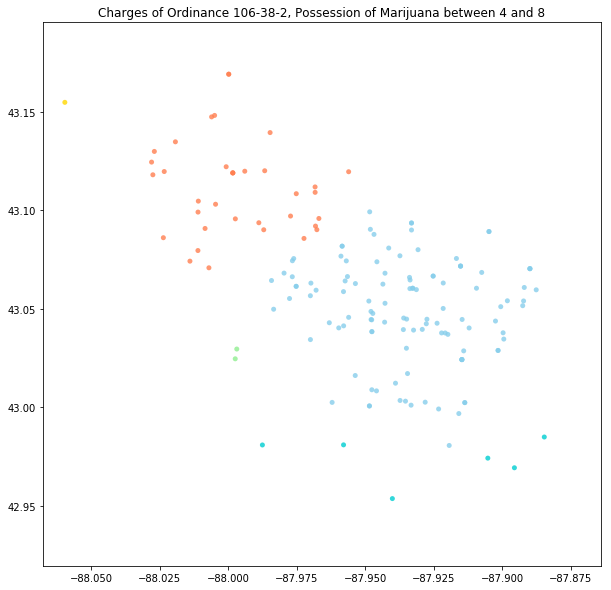

<Figure size 432x288 with 0 Axes>

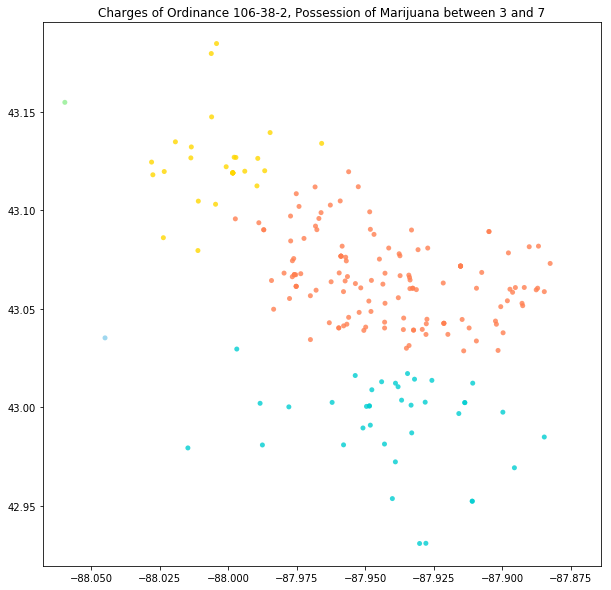

<Figure size 432x288 with 0 Axes>

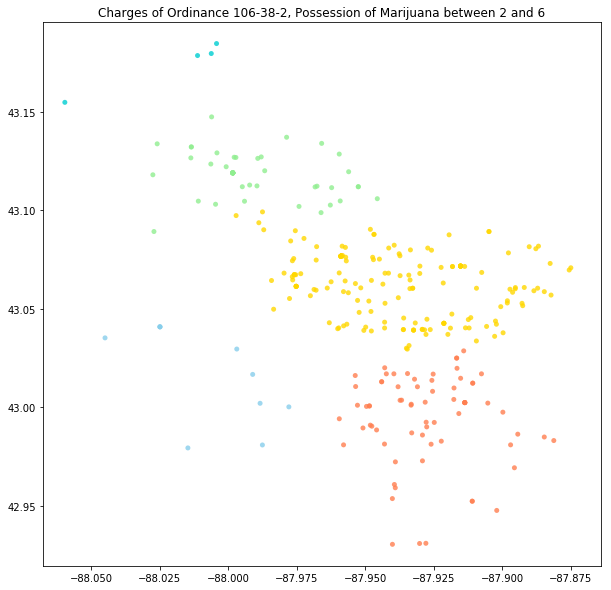

<Figure size 432x288 with 0 Axes>

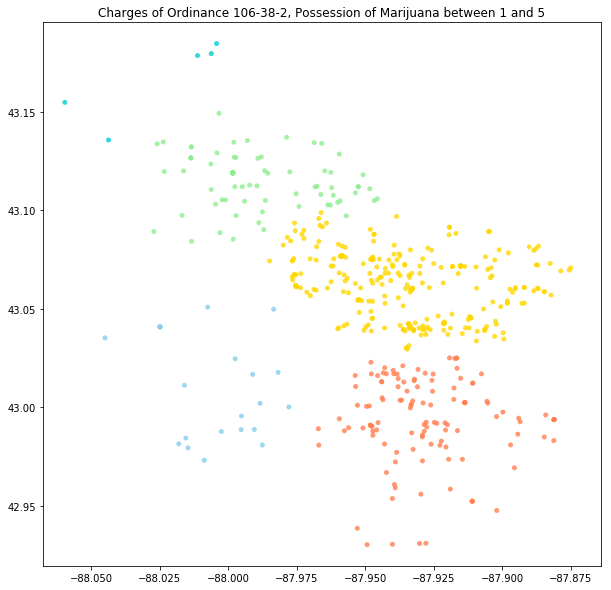

<Figure size 432x288 with 0 Axes>

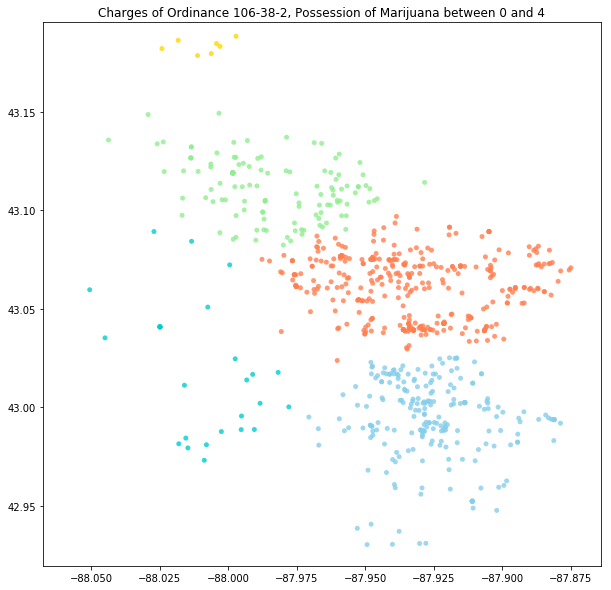

<Figure size 432x288 with 0 Axes>

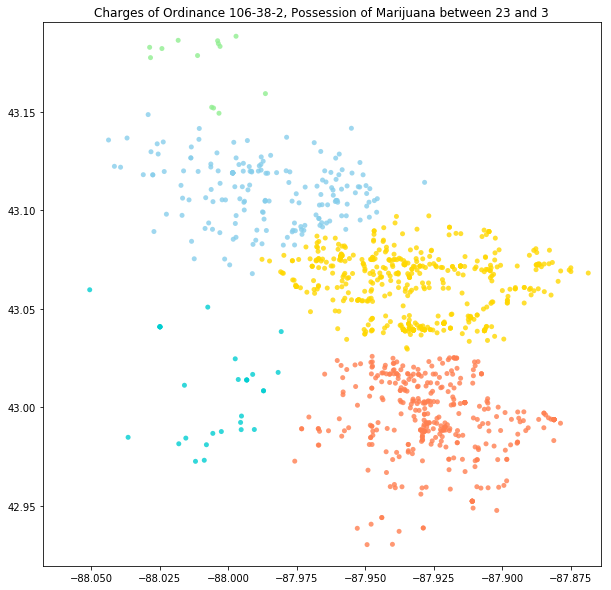

<Figure size 432x288 with 0 Axes>

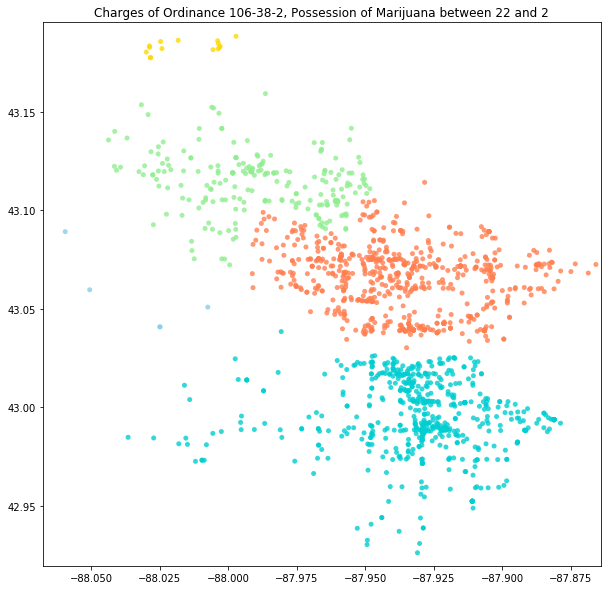

<Figure size 432x288 with 0 Axes>

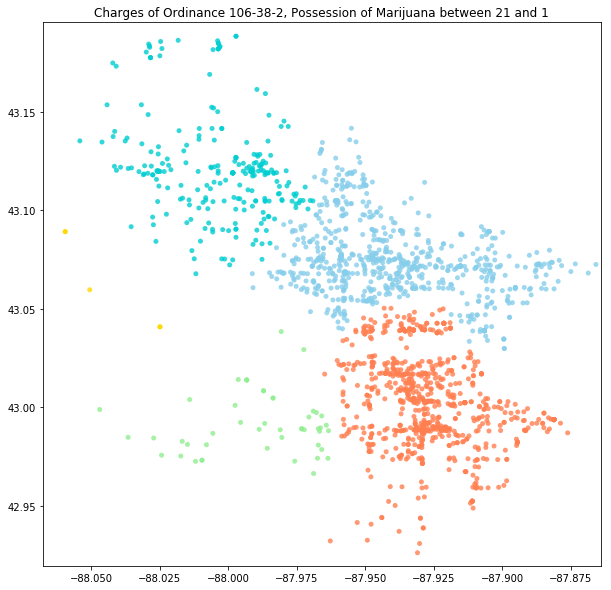

<Figure size 432x288 with 0 Axes>

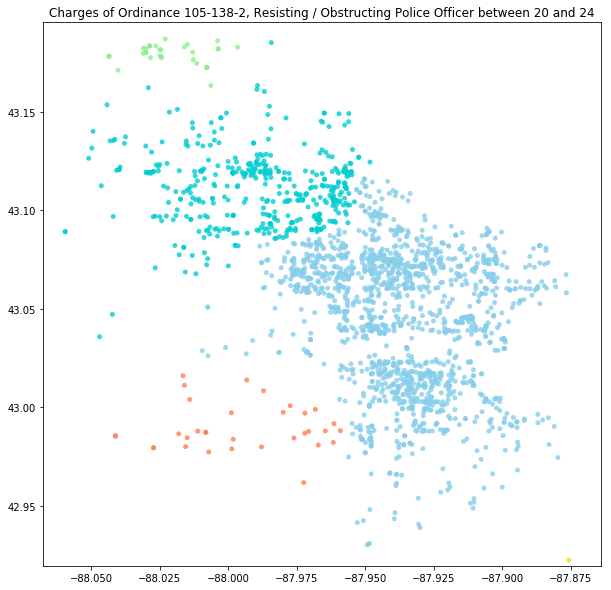

<Figure size 432x288 with 0 Axes>

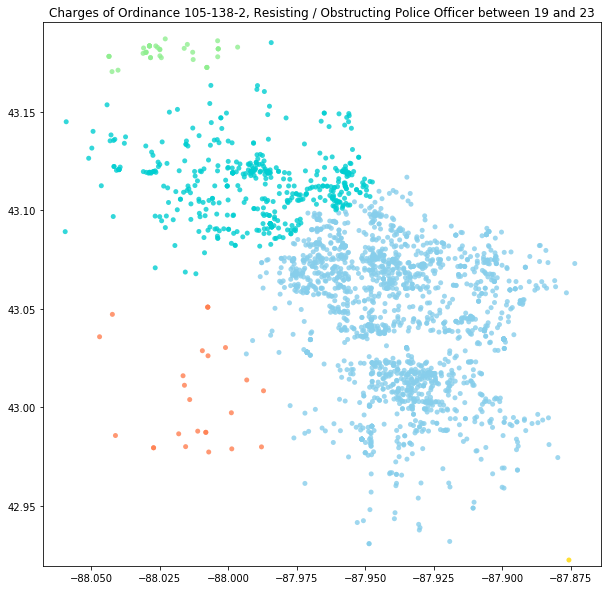

<Figure size 432x288 with 0 Axes>

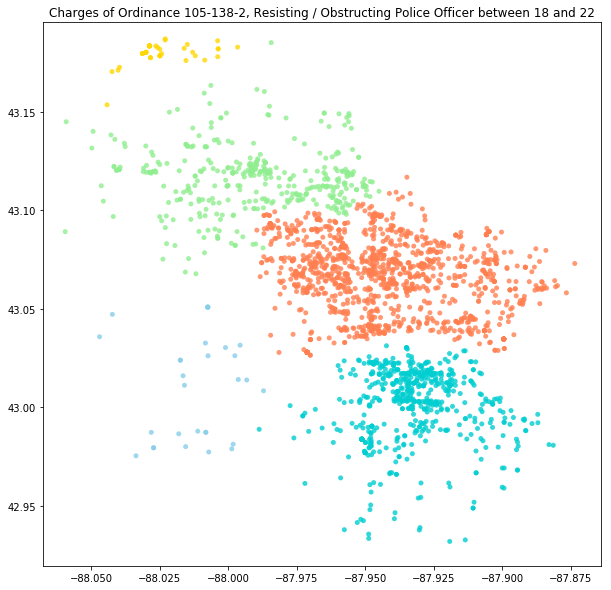

<Figure size 432x288 with 0 Axes>

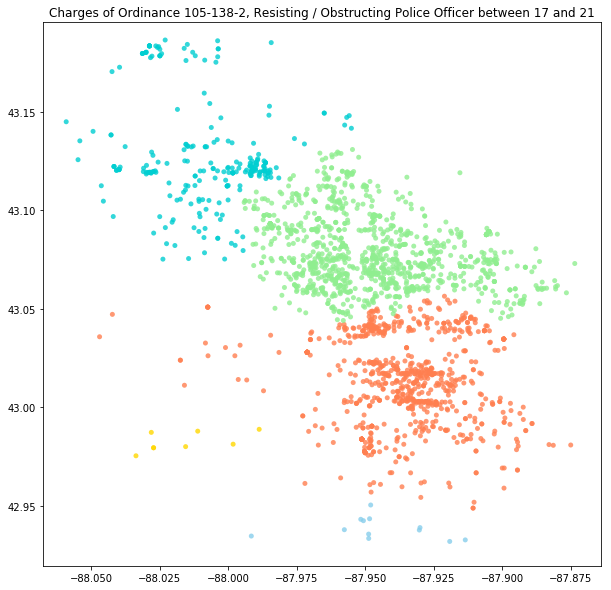

<Figure size 432x288 with 0 Axes>

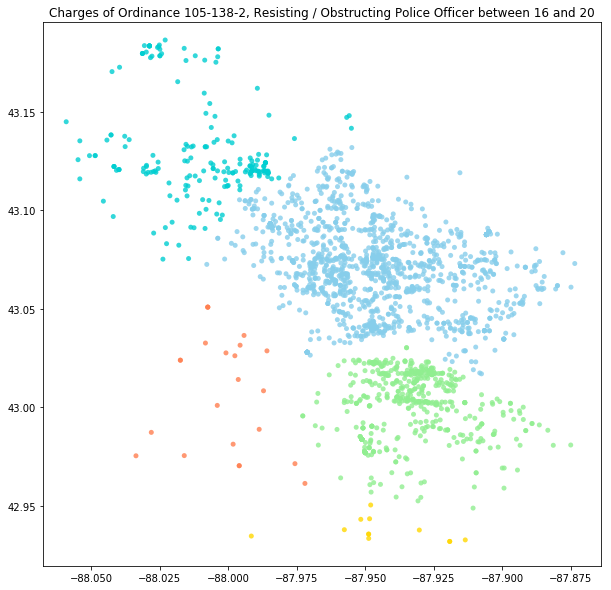

<Figure size 432x288 with 0 Axes>

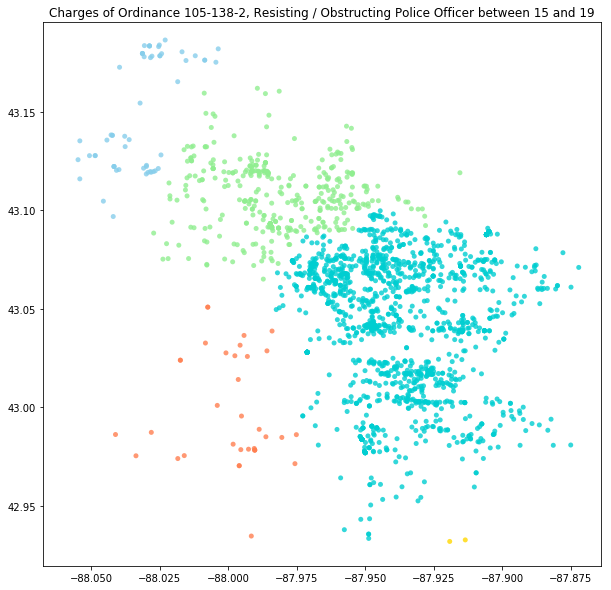

<Figure size 432x288 with 0 Axes>

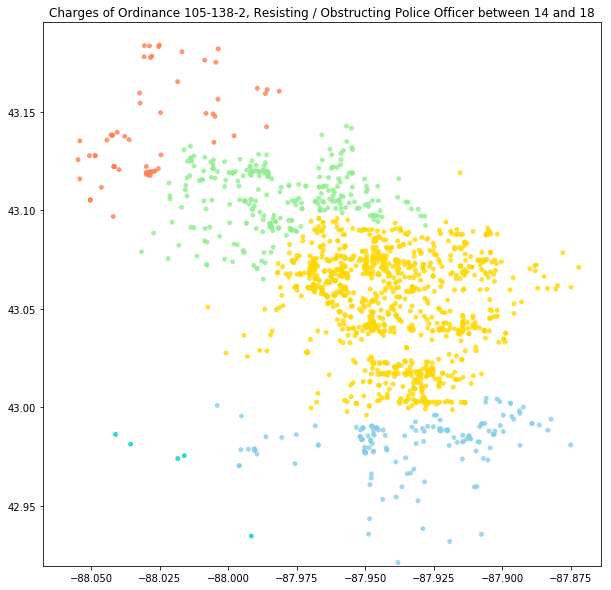

<Figure size 432x288 with 0 Axes>

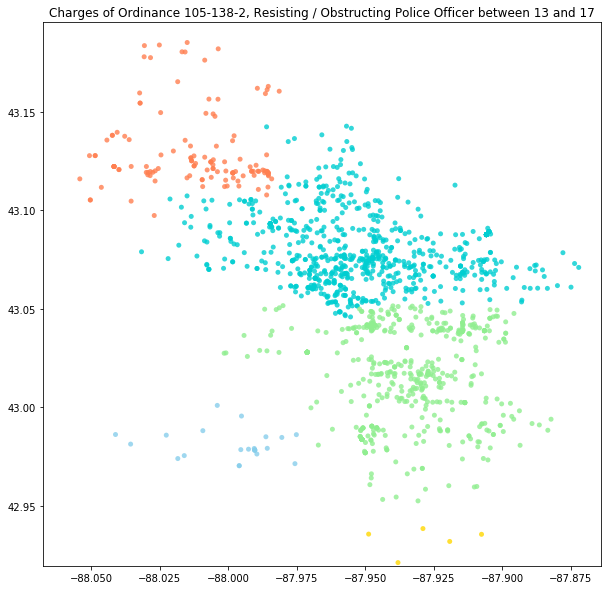

<Figure size 432x288 with 0 Axes>

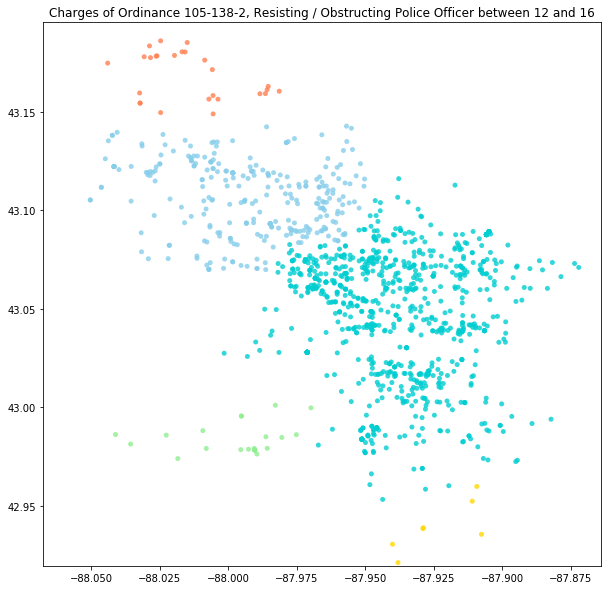

<Figure size 432x288 with 0 Axes>

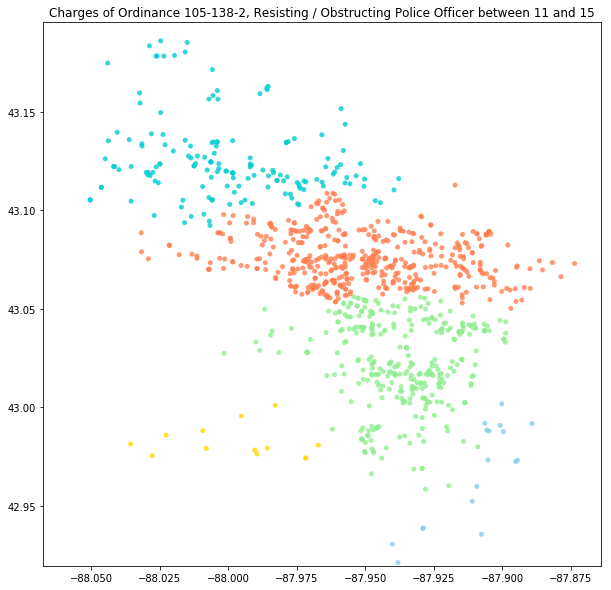

<Figure size 432x288 with 0 Axes>

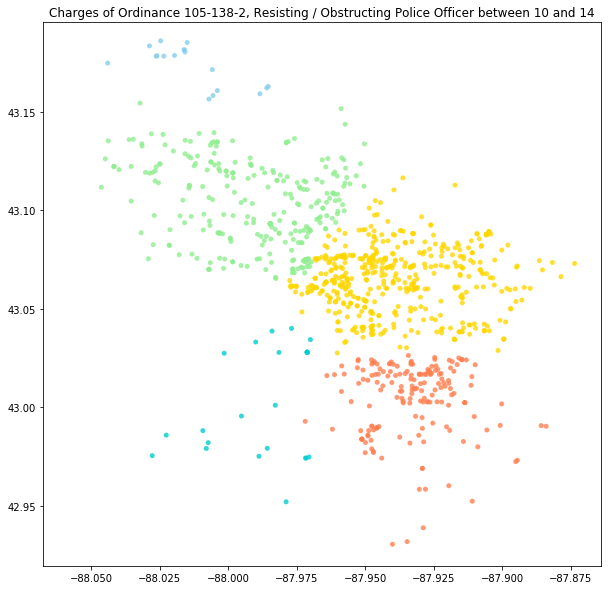

<Figure size 432x288 with 0 Axes>

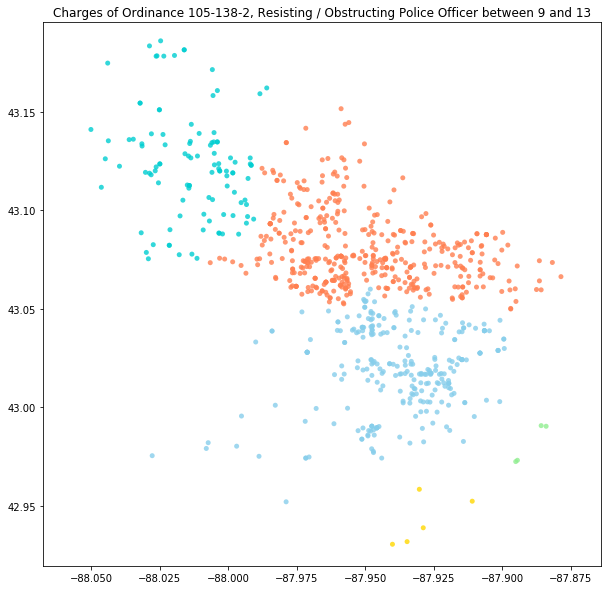

<Figure size 432x288 with 0 Axes>

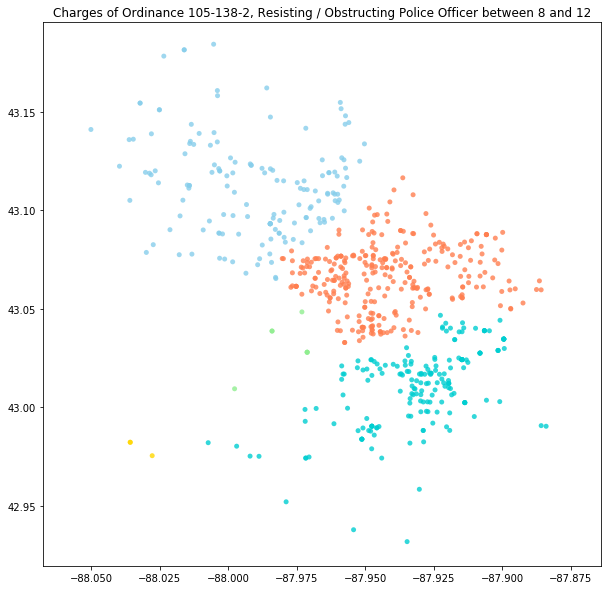

<Figure size 432x288 with 0 Axes>

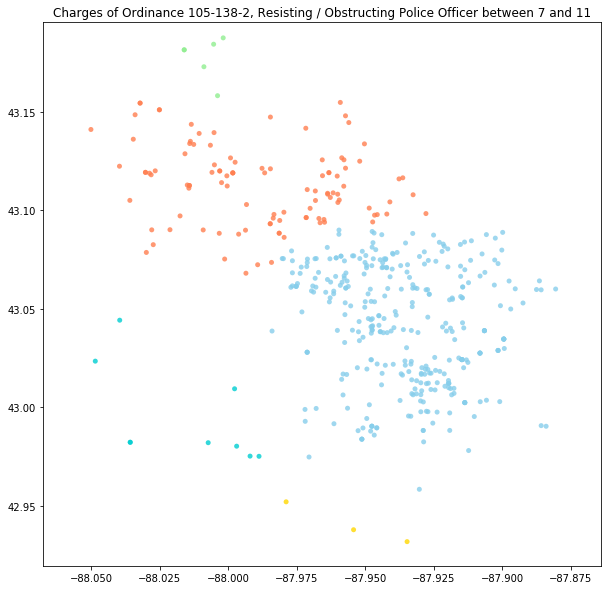

<Figure size 432x288 with 0 Axes>

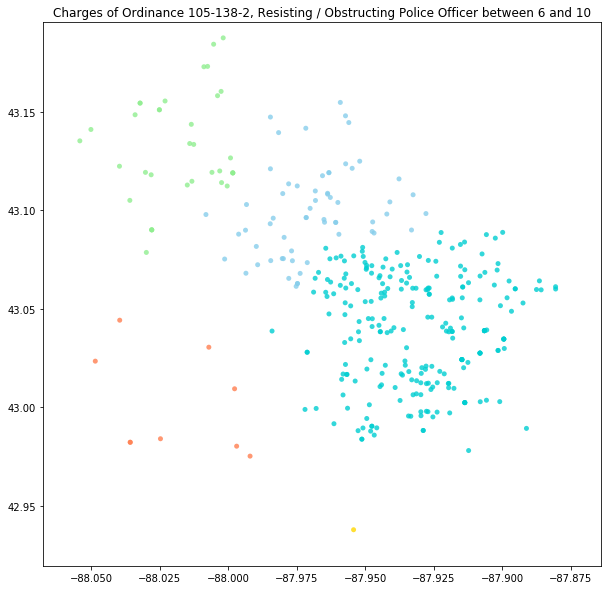

<Figure size 432x288 with 0 Axes>

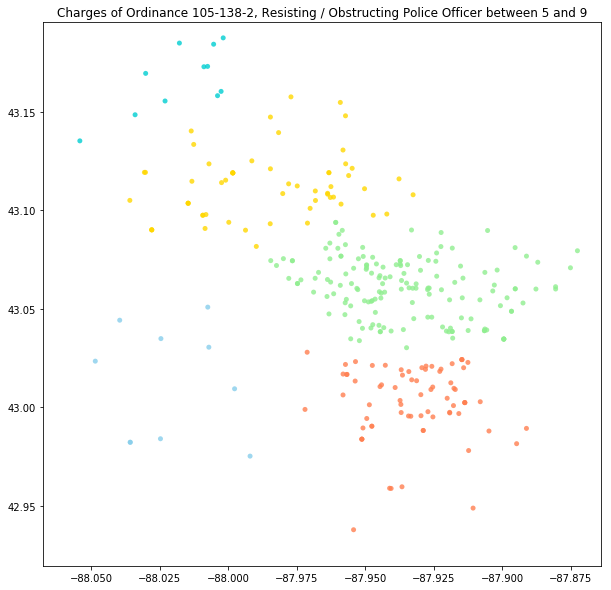

<Figure size 432x288 with 0 Axes>

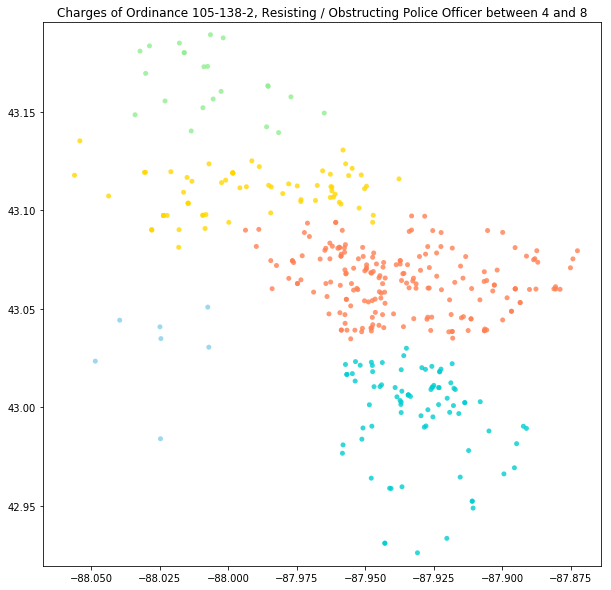

<Figure size 432x288 with 0 Axes>

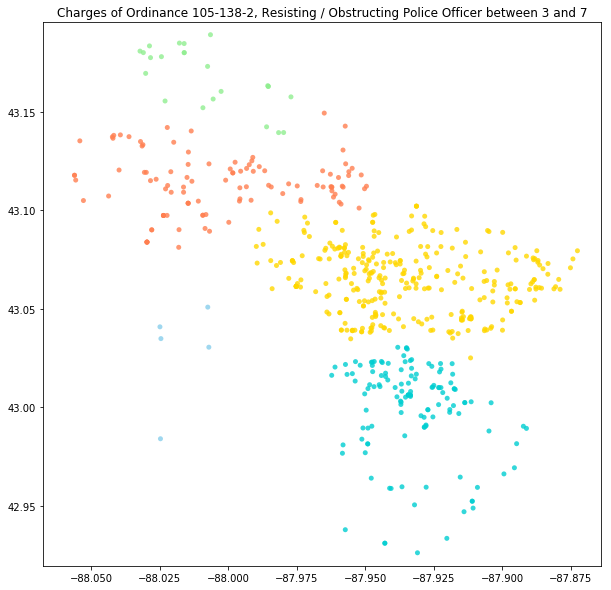

<Figure size 432x288 with 0 Axes>

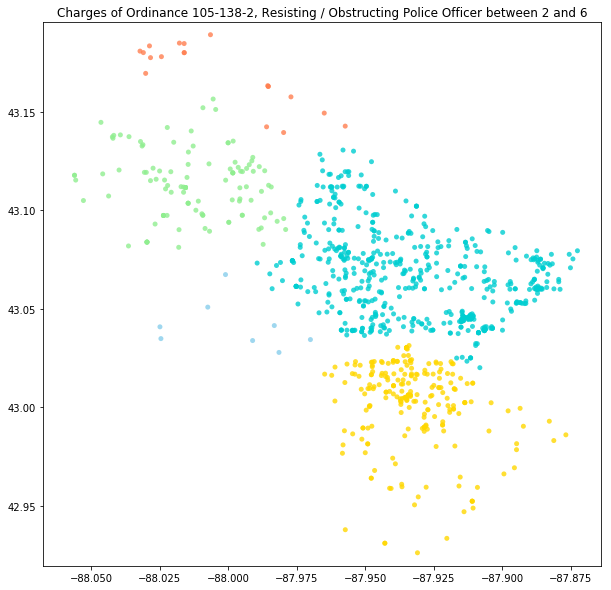

<Figure size 432x288 with 0 Axes>

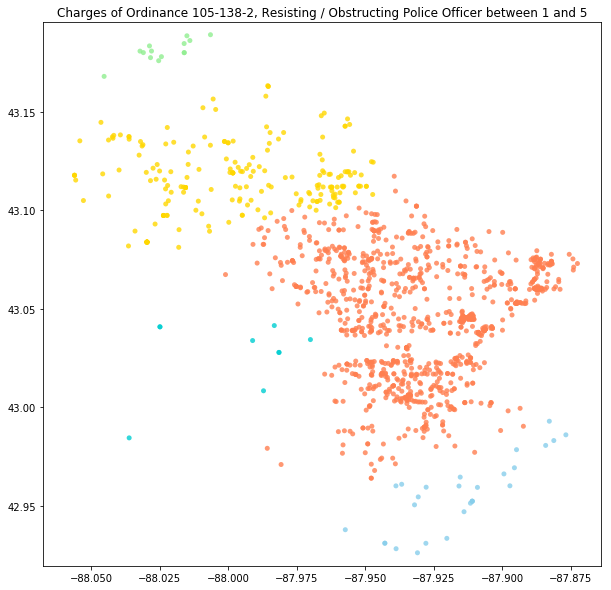

<Figure size 432x288 with 0 Axes>

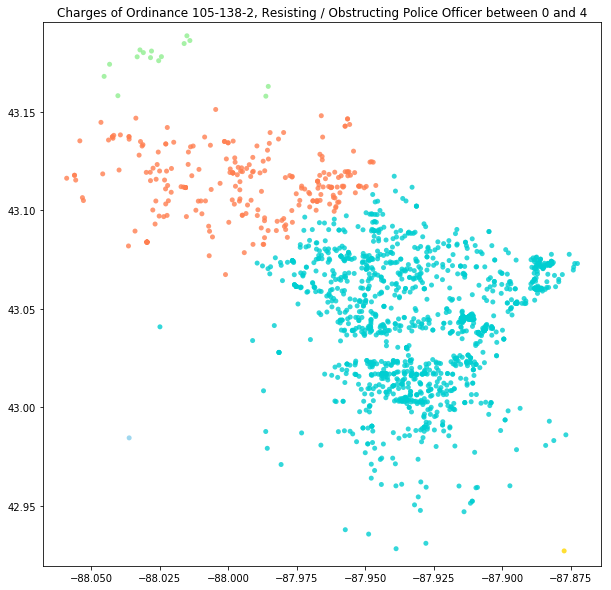

<Figure size 432x288 with 0 Axes>

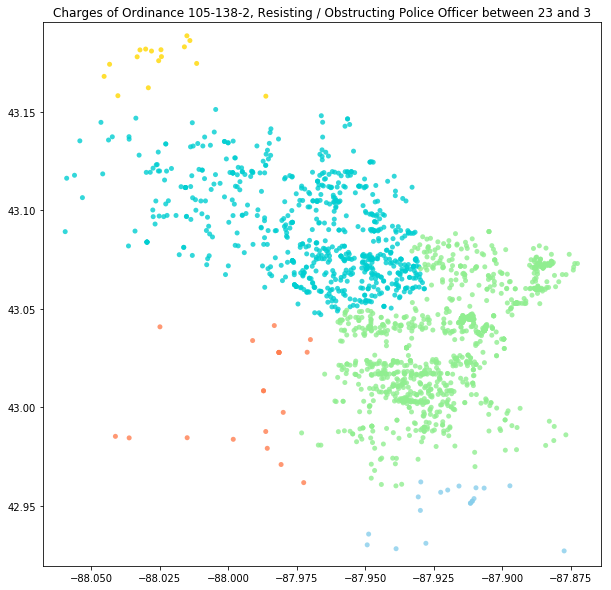

<Figure size 432x288 with 0 Axes>

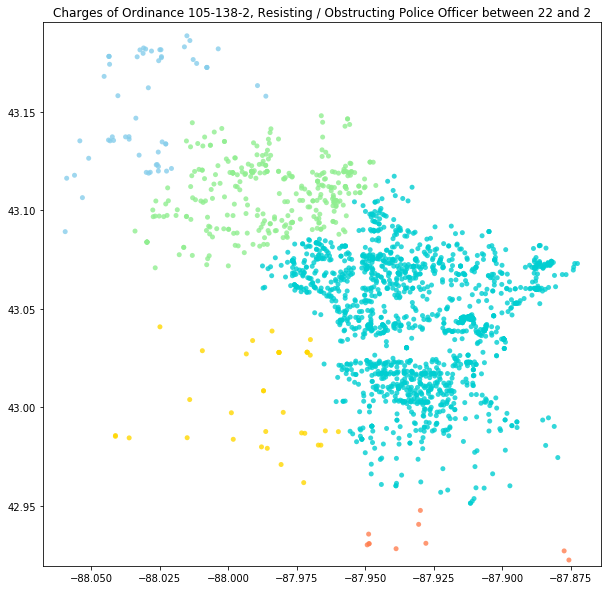

<Figure size 432x288 with 0 Axes>

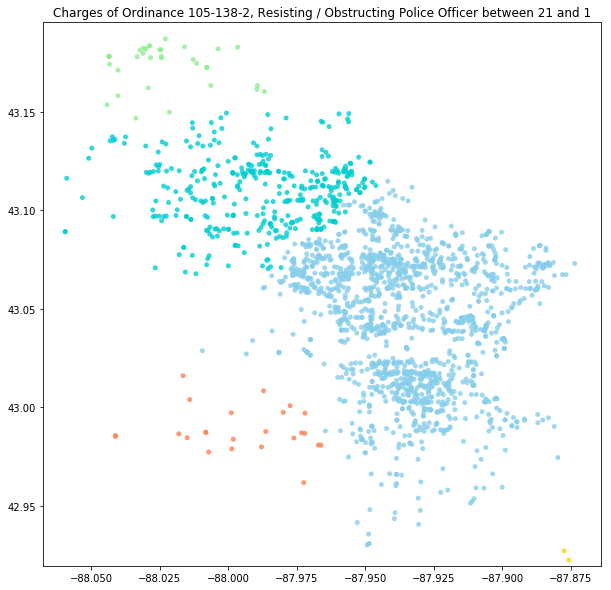

<Figure size 432x288 with 0 Axes>

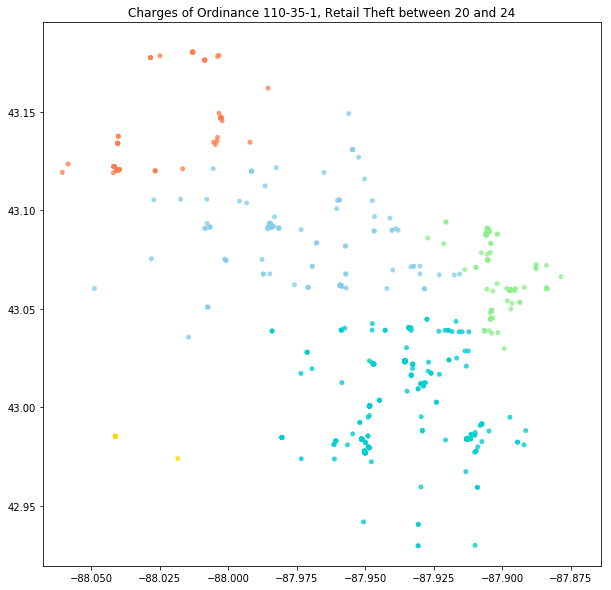

<Figure size 432x288 with 0 Axes>

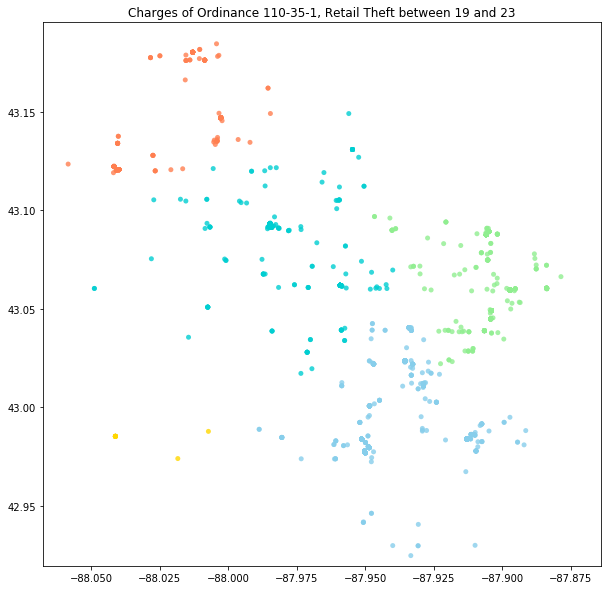

<Figure size 432x288 with 0 Axes>

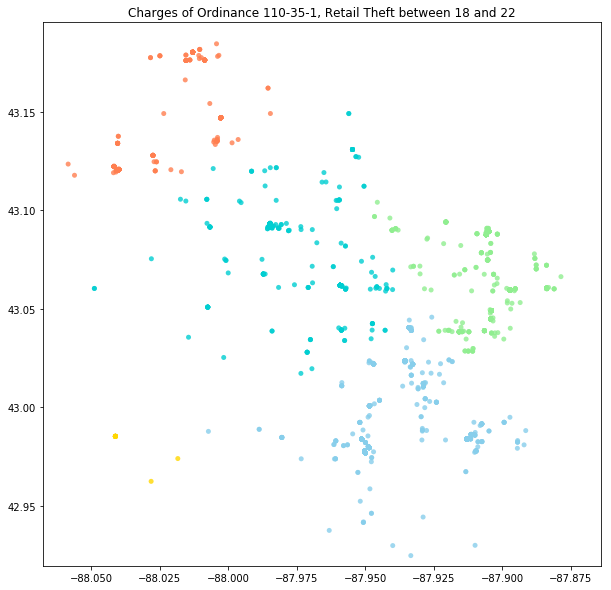

<Figure size 432x288 with 0 Axes>

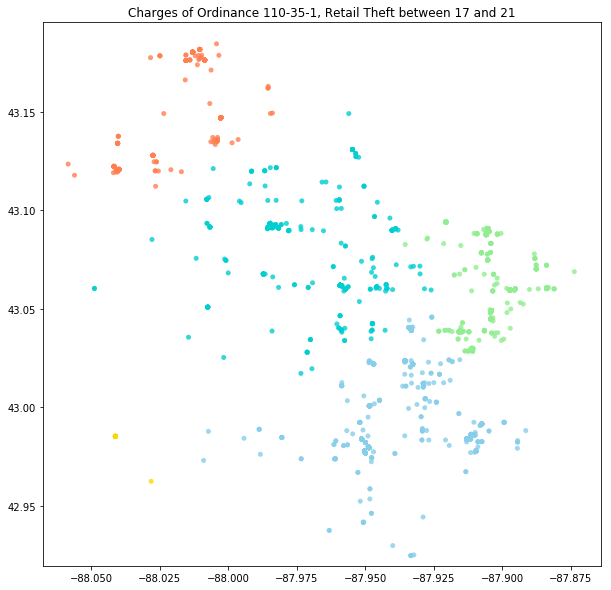

<Figure size 432x288 with 0 Axes>

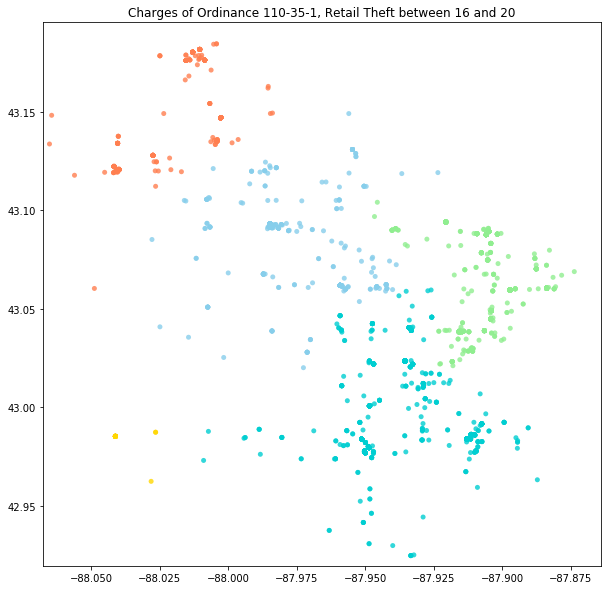

<Figure size 432x288 with 0 Axes>

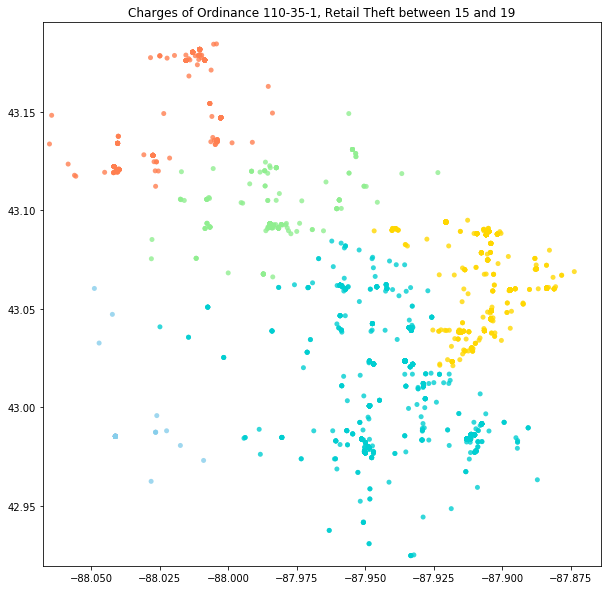

<Figure size 432x288 with 0 Axes>

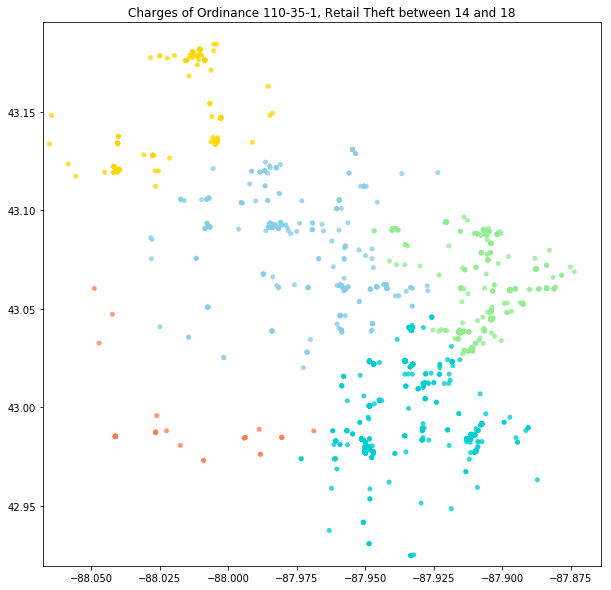

<Figure size 432x288 with 0 Axes>

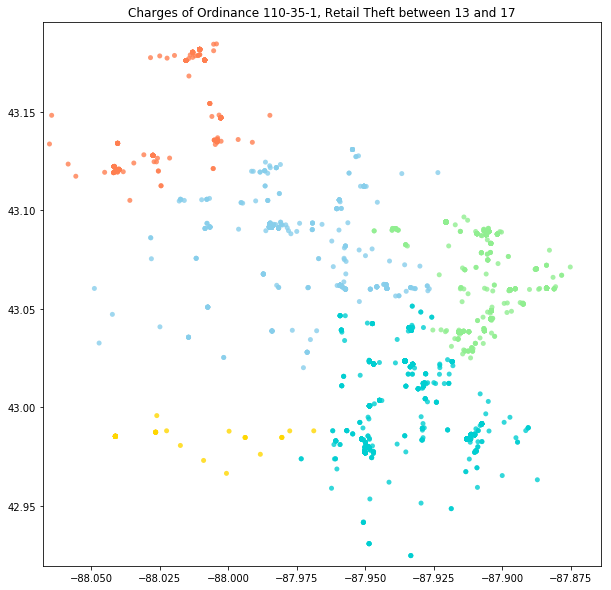

<Figure size 432x288 with 0 Axes>

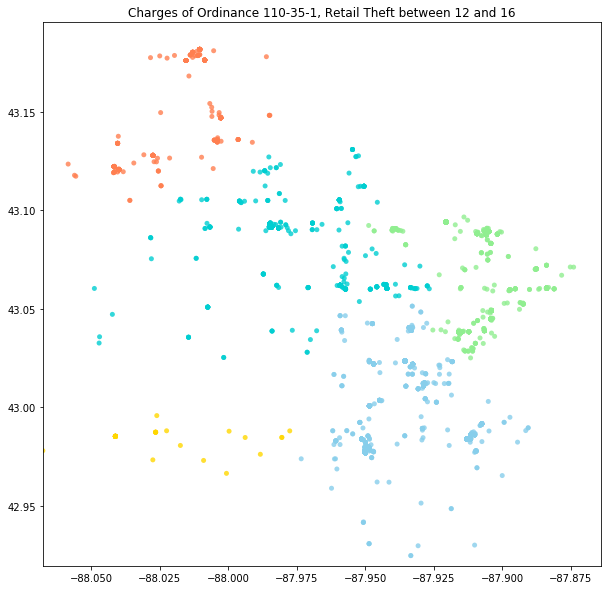

<Figure size 432x288 with 0 Axes>

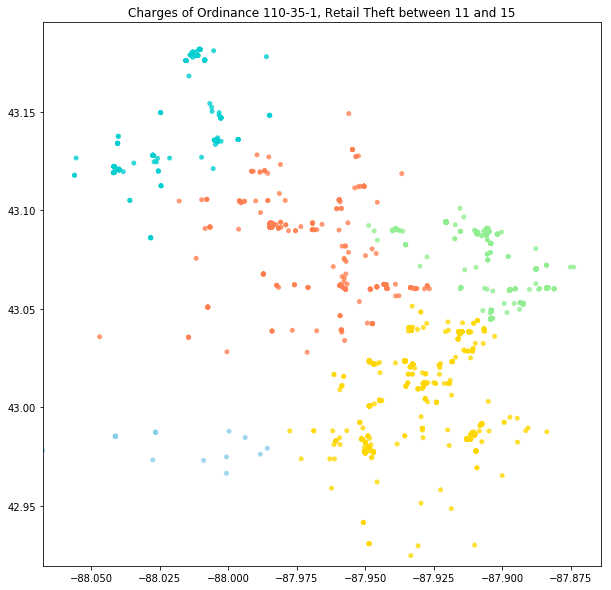

<Figure size 432x288 with 0 Axes>

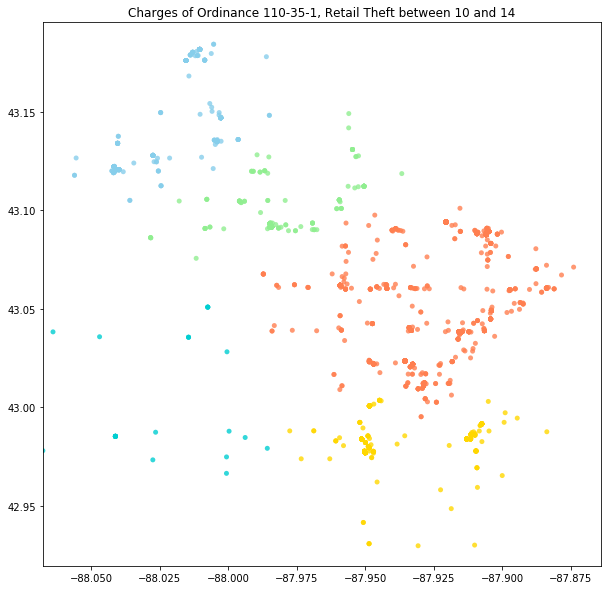

<Figure size 432x288 with 0 Axes>

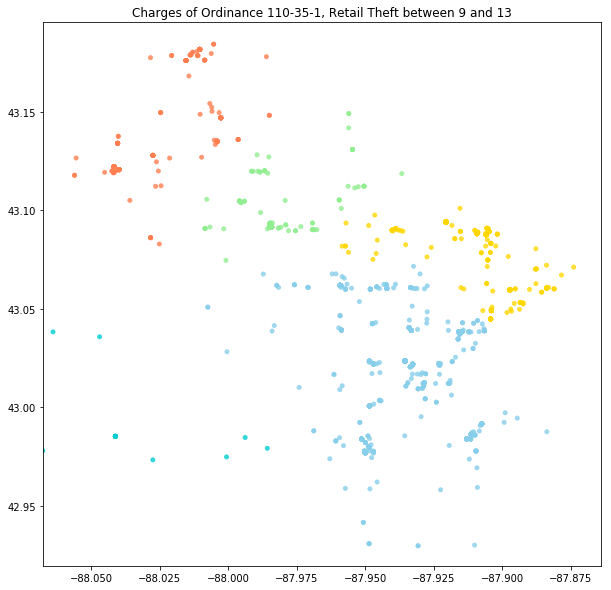

<Figure size 432x288 with 0 Axes>

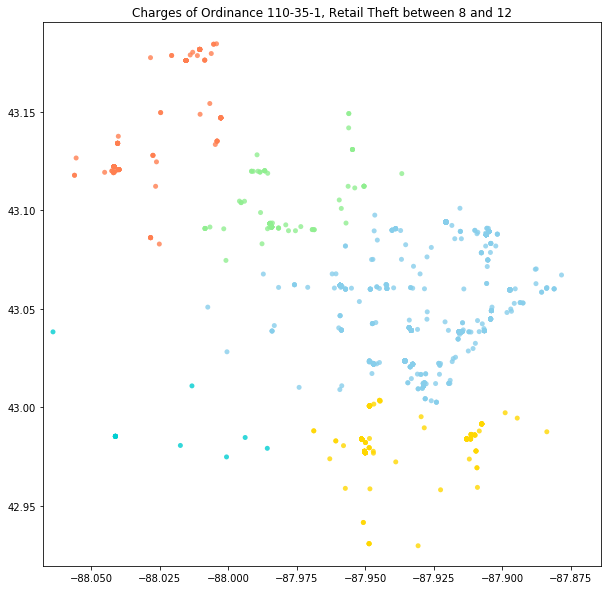

<Figure size 432x288 with 0 Axes>

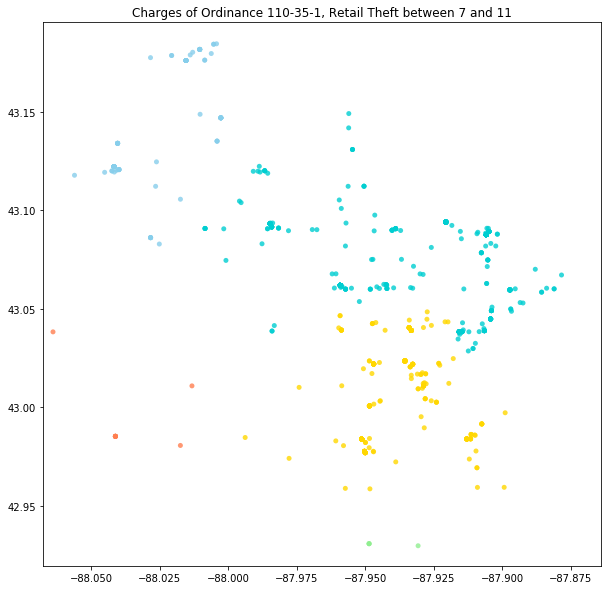

<Figure size 432x288 with 0 Axes>

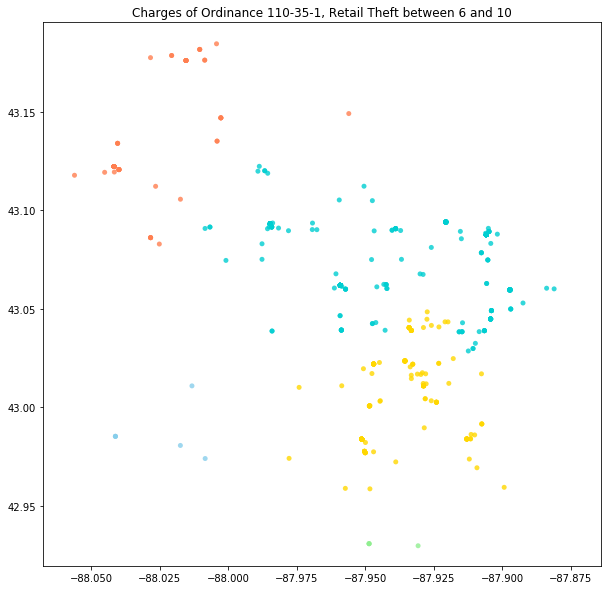

<Figure size 432x288 with 0 Axes>

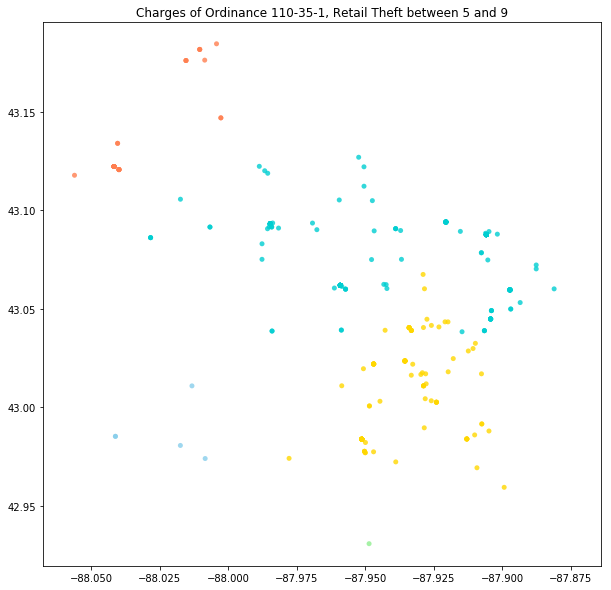

<Figure size 432x288 with 0 Axes>

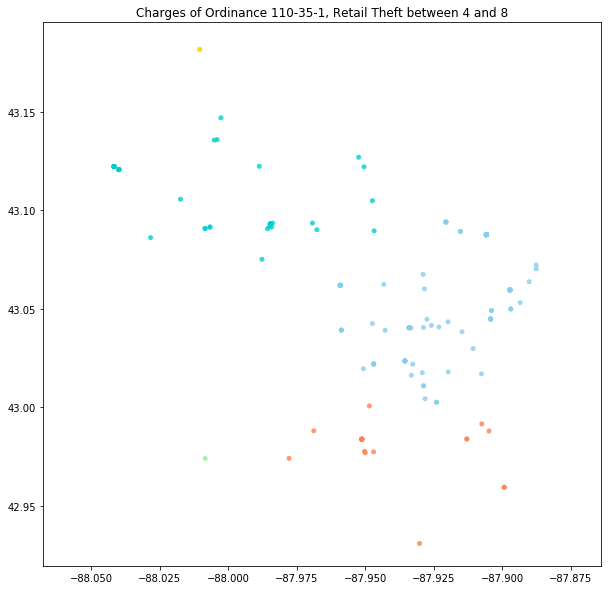

<Figure size 432x288 with 0 Axes>

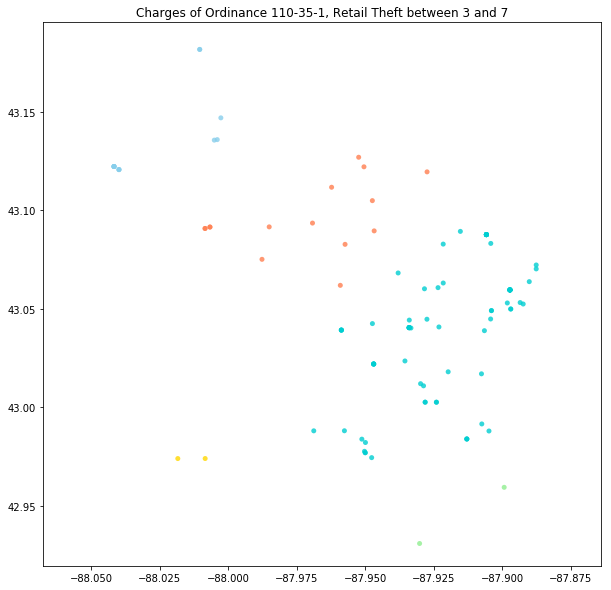

<Figure size 432x288 with 0 Axes>

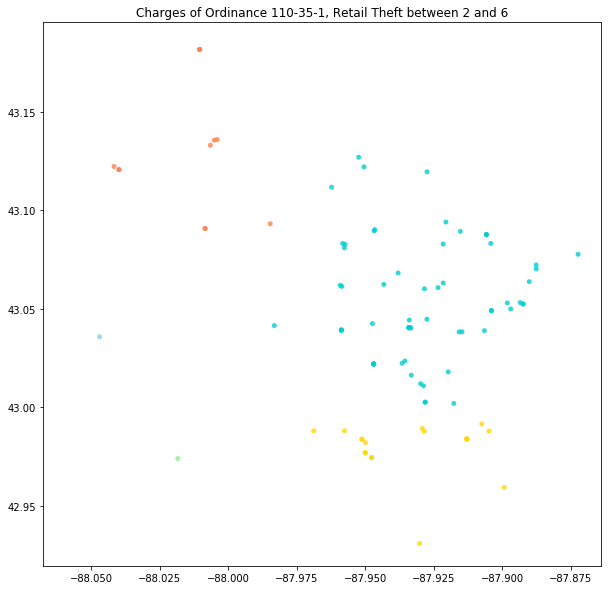

<Figure size 432x288 with 0 Axes>

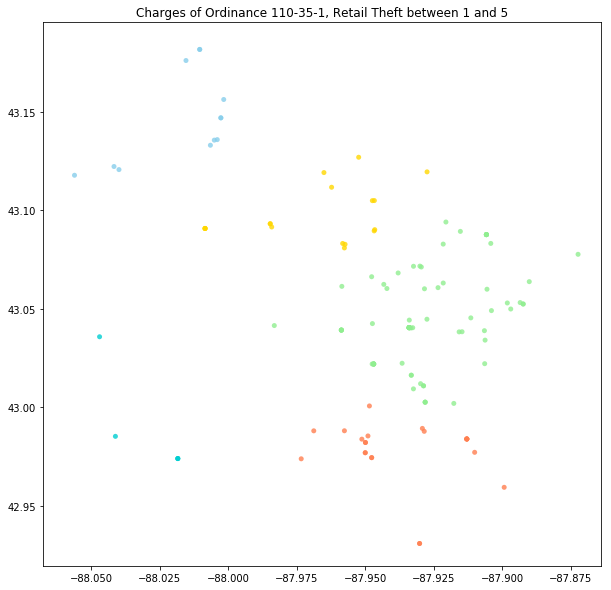

<Figure size 432x288 with 0 Axes>

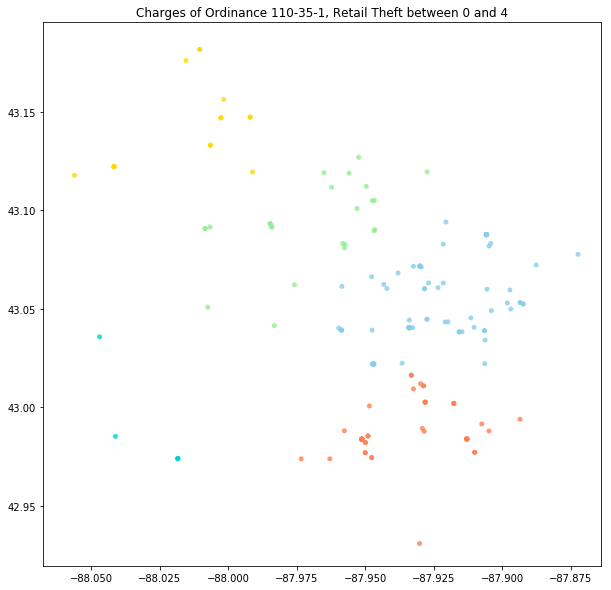

<Figure size 432x288 with 0 Axes>

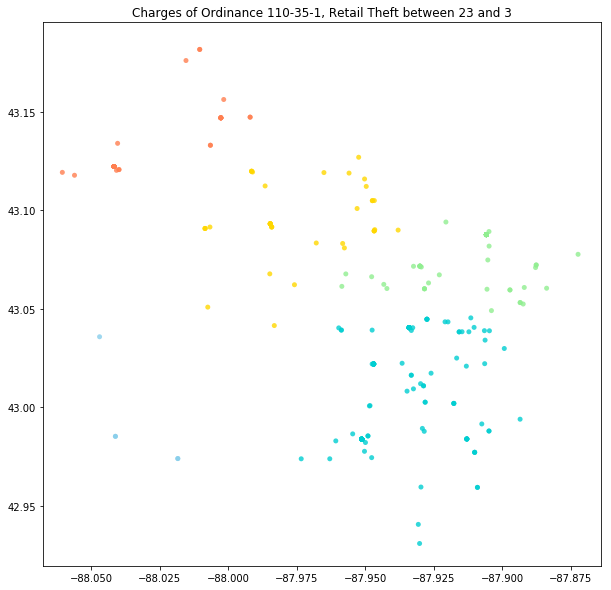

<Figure size 432x288 with 0 Axes>

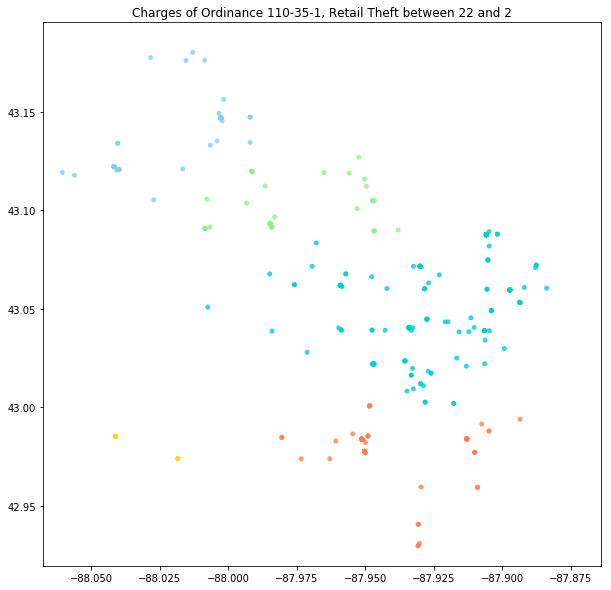

<Figure size 432x288 with 0 Axes>

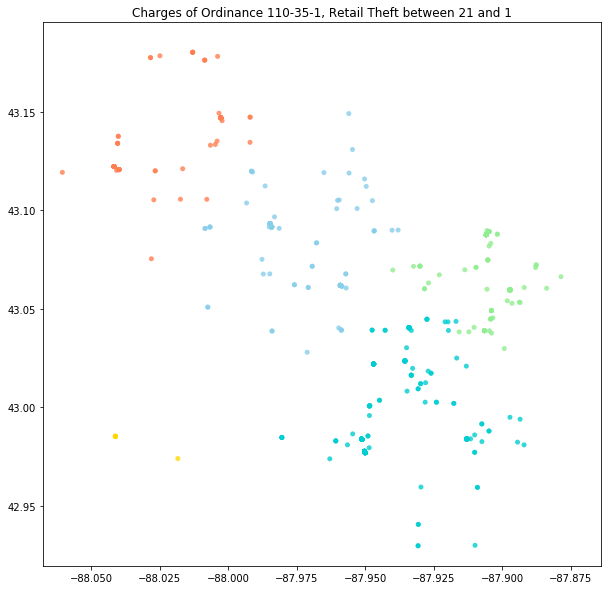

<Figure size 432x288 with 0 Axes>

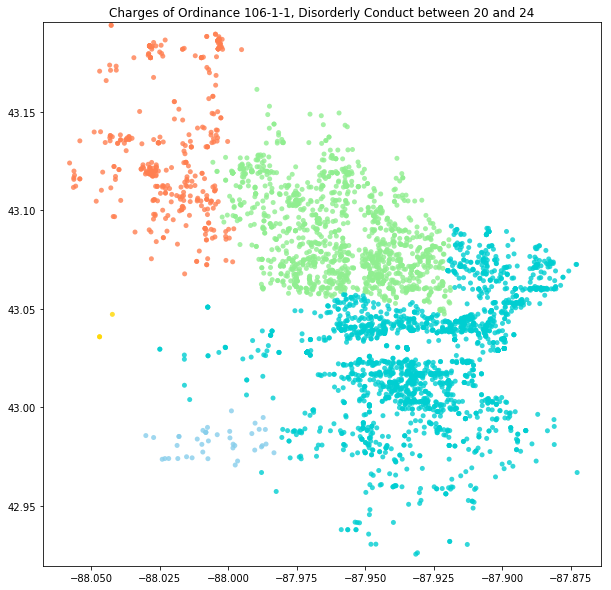

<Figure size 432x288 with 0 Axes>

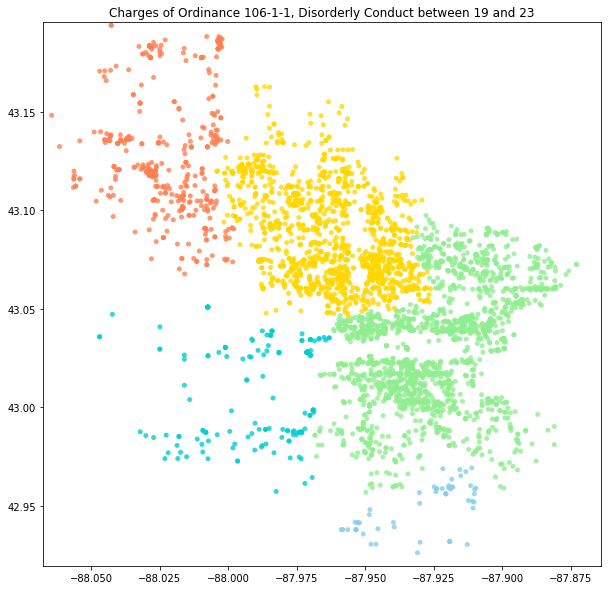

<Figure size 432x288 with 0 Axes>

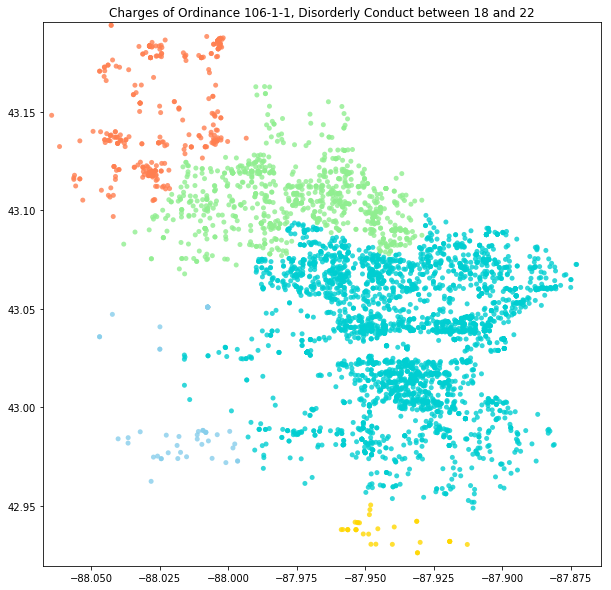

<Figure size 432x288 with 0 Axes>

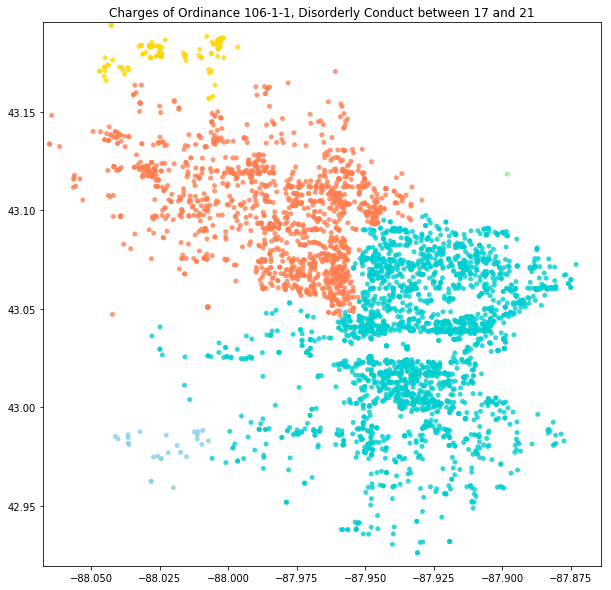

<Figure size 432x288 with 0 Axes>

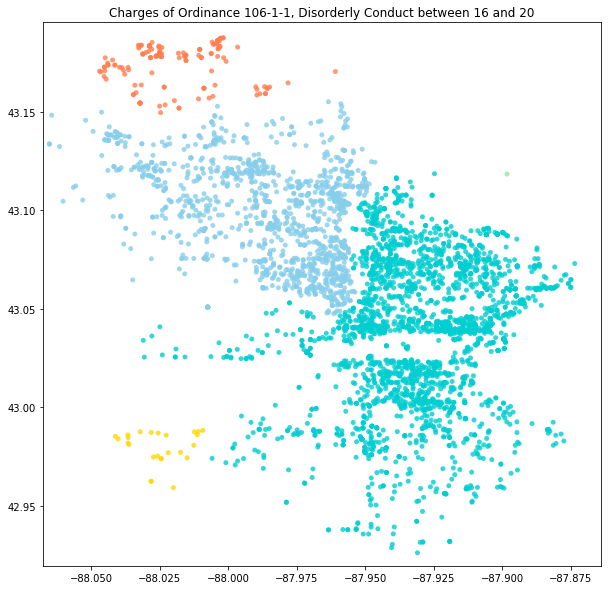

<Figure size 432x288 with 0 Axes>

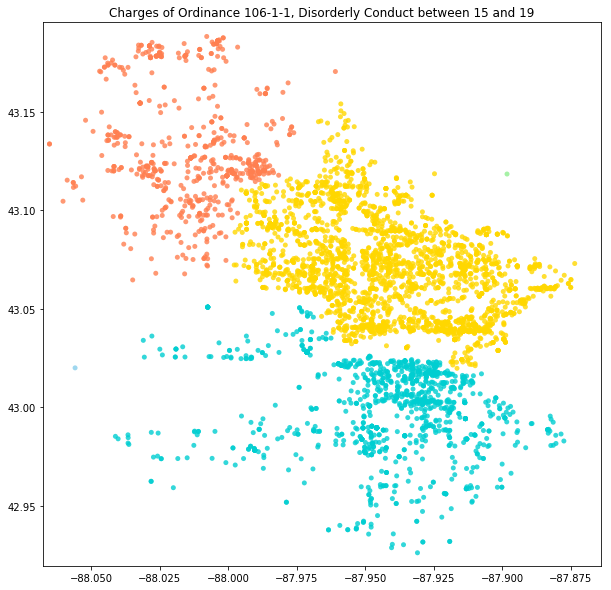

<Figure size 432x288 with 0 Axes>

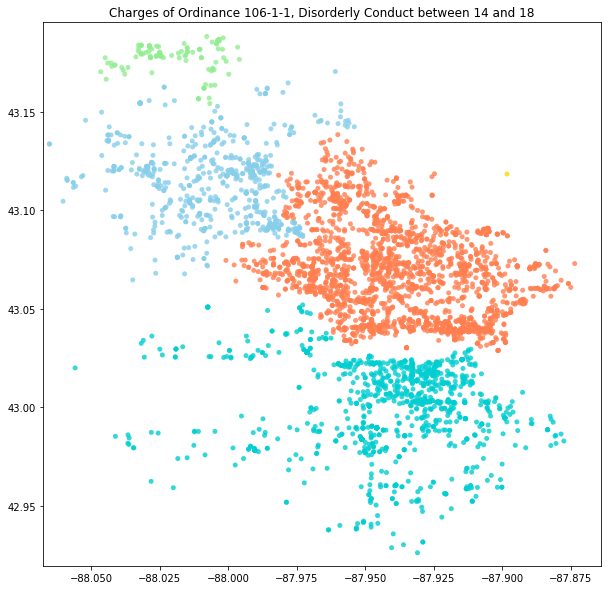

<Figure size 432x288 with 0 Axes>

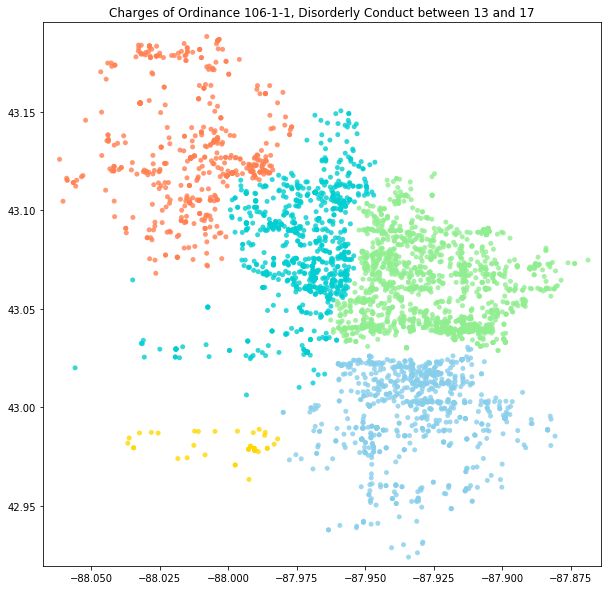

<Figure size 432x288 with 0 Axes>

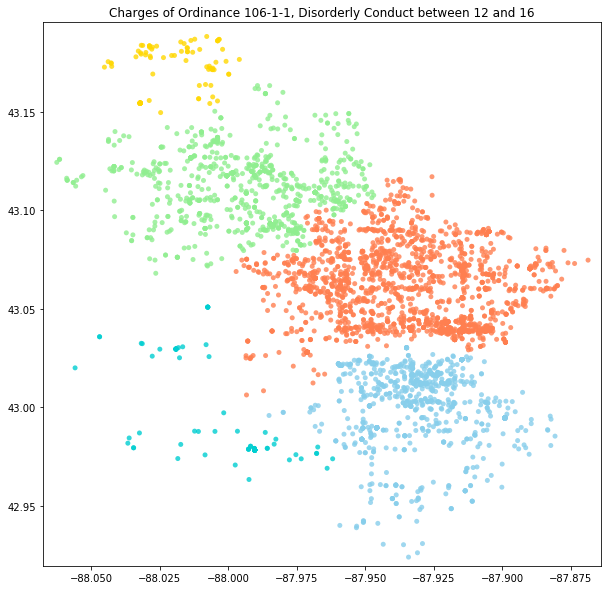

<Figure size 432x288 with 0 Axes>

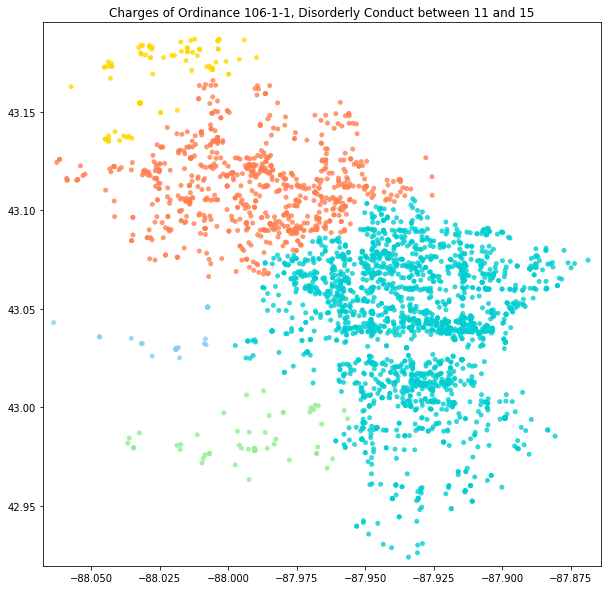

<Figure size 432x288 with 0 Axes>

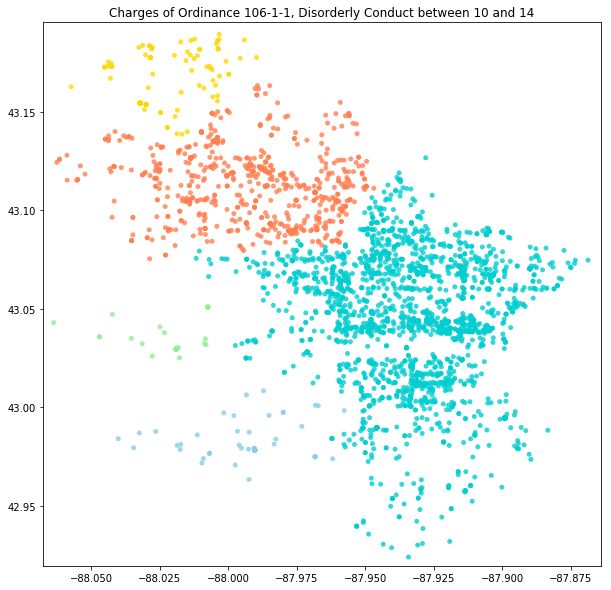

<Figure size 432x288 with 0 Axes>

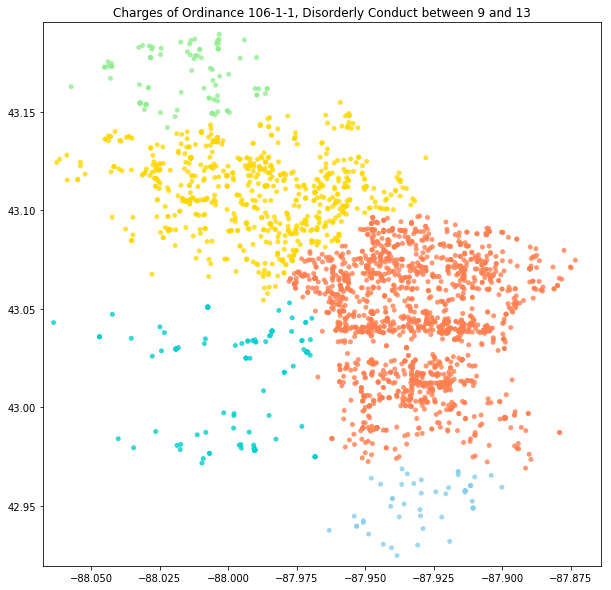

<Figure size 432x288 with 0 Axes>

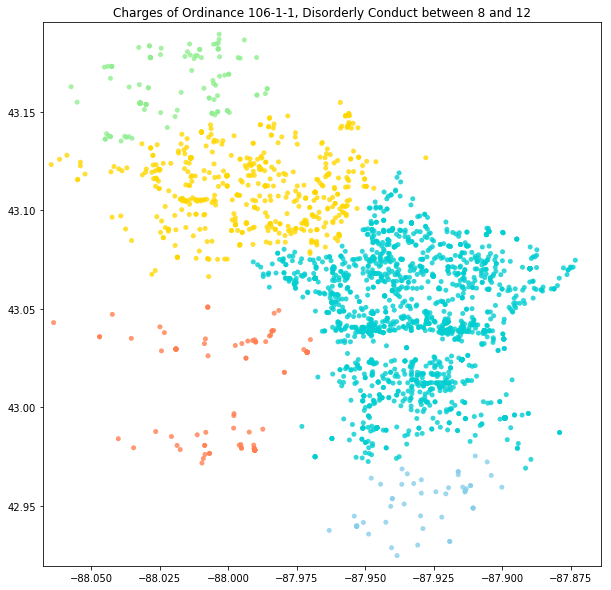

<Figure size 432x288 with 0 Axes>

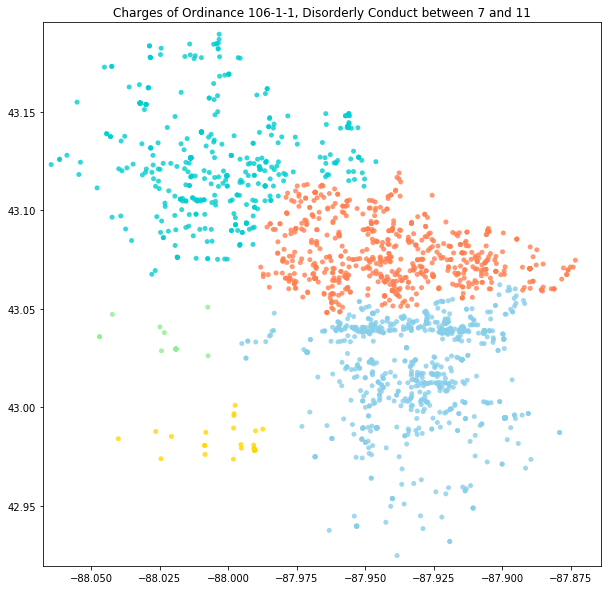

<Figure size 432x288 with 0 Axes>

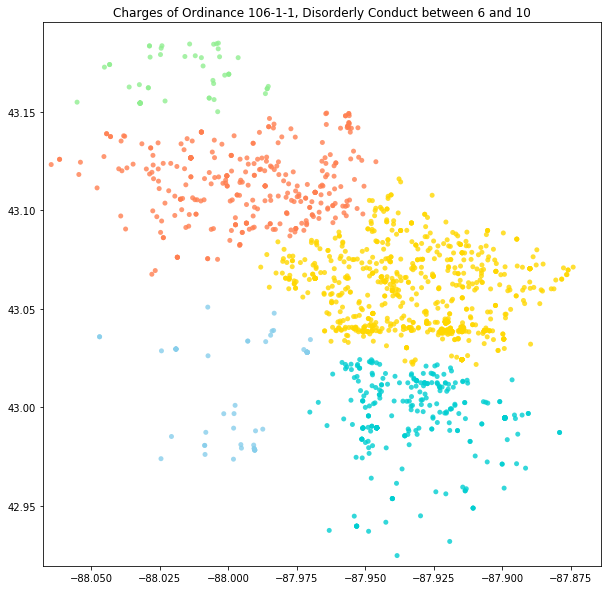

<Figure size 432x288 with 0 Axes>

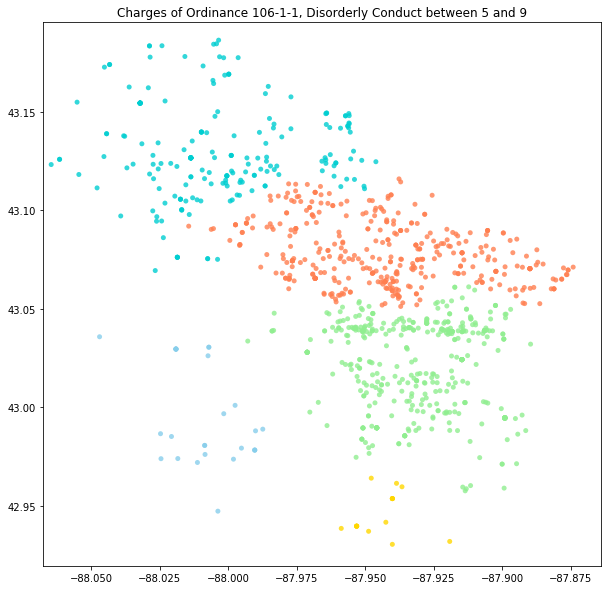

<Figure size 432x288 with 0 Axes>

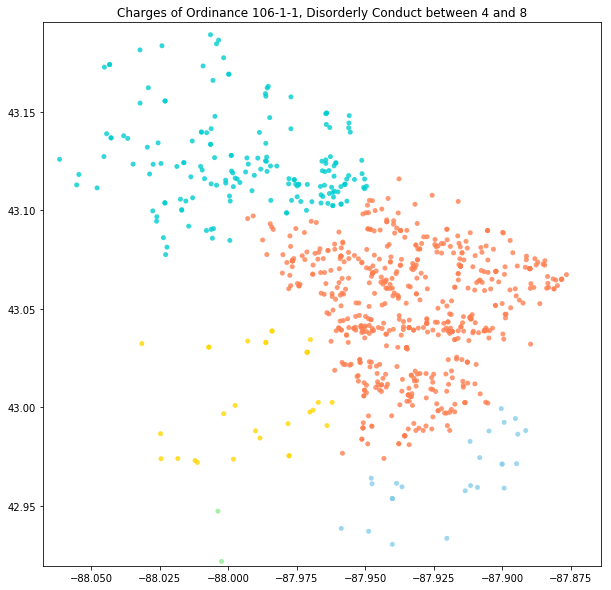

<Figure size 432x288 with 0 Axes>

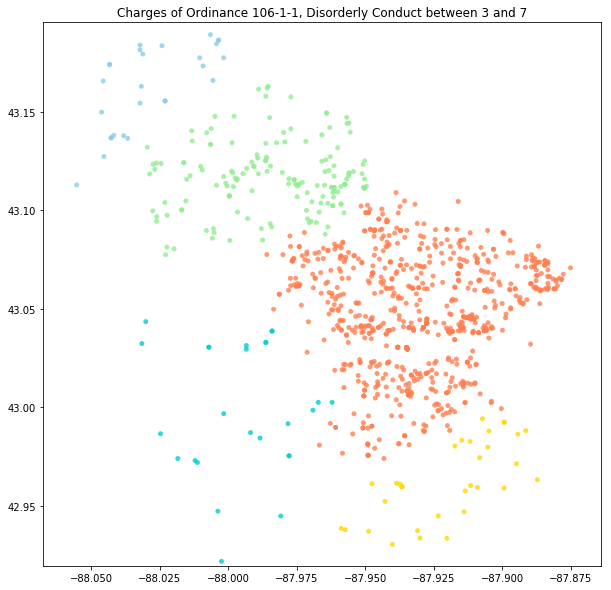

<Figure size 432x288 with 0 Axes>

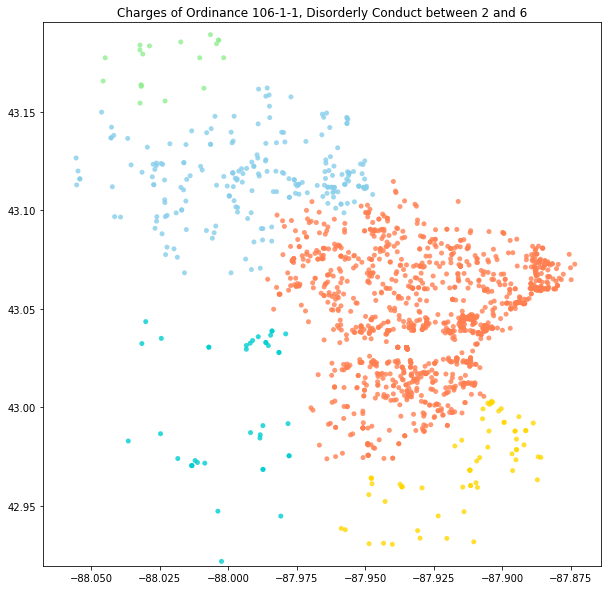

<Figure size 432x288 with 0 Axes>

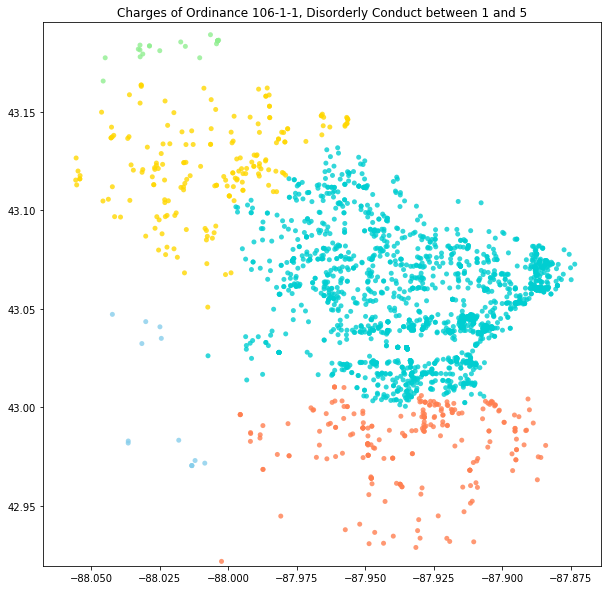

<Figure size 432x288 with 0 Axes>

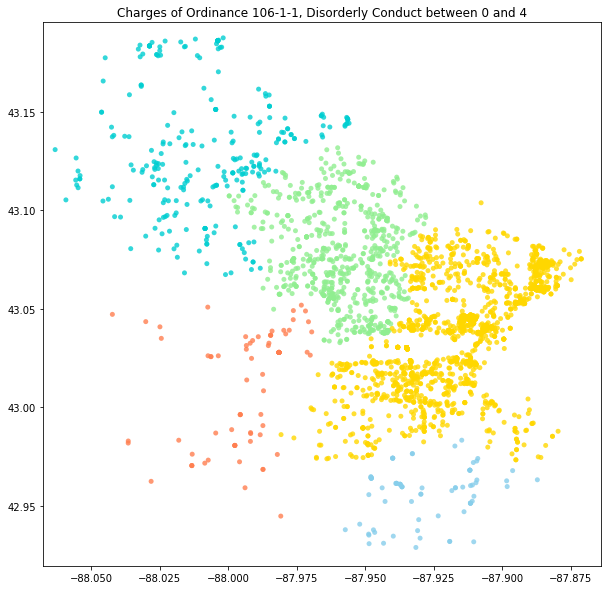

<Figure size 432x288 with 0 Axes>

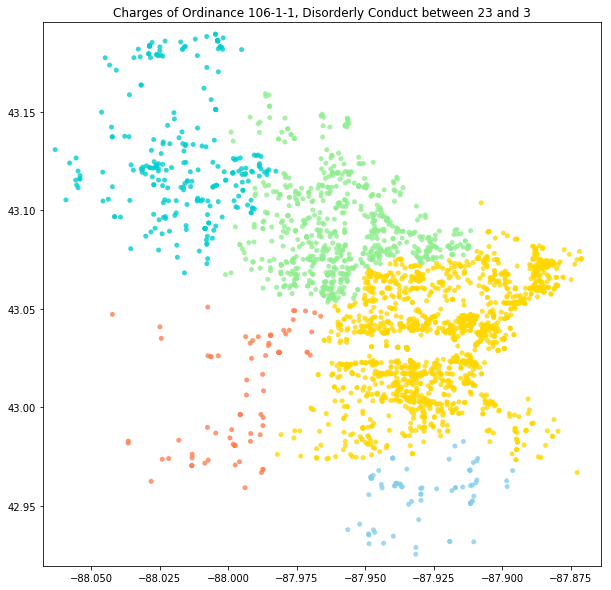

<Figure size 432x288 with 0 Axes>

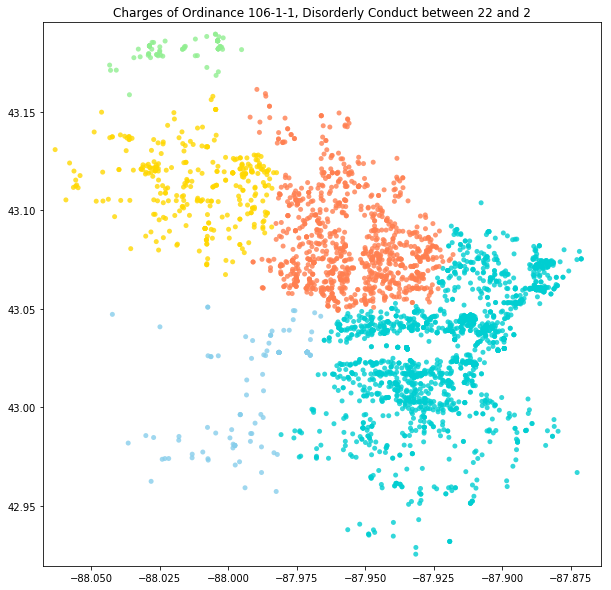

<Figure size 432x288 with 0 Axes>

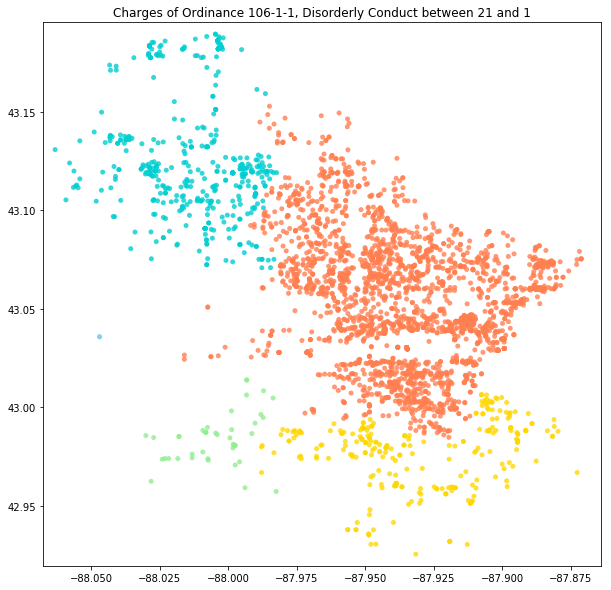

In [159]:
#clustering by time of day
charges = ['Ordinance 106-38-2, Possession of Marijuana', 'Ordinance 105-138-2, Resisting / Obstructing Police Officer', 'Ordinance 110-35-1, Retail Theft', 'Ordinance 106-1-1, Disorderly Conduct']
ch = len(charges)

#charges
for c in range(0, ch):
    datac = data[data['c_violation'] == charges[c]]
    datac = datac[datac['time_of_day'] != 0.0] #get rid of charges w/o time
    #time of day
    for t in range(24, 0, -1):
        plt.clf()
        plt.figure(figsize=(10,10))
        if t > (t-4)%24:
            datact = datac[(datac['time_of_day']<=t) & (datac['time_of_day']>((t-4)%24))]
        else:
            datact = datac[(datac['time_of_day']<=t) | (datac['time_of_day'] > ((t-4)%24))]
        if len(datact.index) < 5:
            plt.scatter(datact['x_lng'],datact['y_lat'], c='black', s=25)
        else:
            agg = sklearn.cluster.AgglomerativeClustering(n_clusters = 5, linkage = 'average', affinity='manhattan')
            agg.fit(datact[['x_lng', 'y_lat']])
            cluster = agg.labels_
            plt.scatter(datact['x_lng'],datact['y_lat'], c=colors[cluster], alpha=.8, linewidth=0, s=25)
        plt.title('Charges of ' + charges[c] + ' between ' + str((t-4)%24) + ' and ' + str(t))
        plt.ylim(42.9197, 43.1953)
        plt.xlim(-88.0676, -87.8640)
        plt.savefig('TIME_c_' + str(c) + '_t_' + str(t) + '.png')
        plt.show()

In [161]:
#make animated visualizations 
import glob
import moviepy.editor as mpy

for x in range (0, ch):
    gif_name = 'ch_' + str(x) +'.gif'
    fps = 1
    t = 'TIME_c_' + str(x) + '*' + '.png'
    file_list = glob.glob(t) # Get all the pngs in the current directory
    list.sort(file_list, key=lambda x: int(x.split('_')[4].split('.png')[0])) # Sort the images by #, this may need to be tweaked for your use case
    clip = mpy.ImageSequenceClip(file_list, fps=fps)
    clip.write_gif(gif_name, fps=fps)
    
#source: http://superfluoussextant.com/making-gifs-with-python.html


[MoviePy] Building file ch_0.gif with imageio


 96%|█████████▌| 24/25 [00:01<00:00, 12.29it/s]



[MoviePy] Building file ch_1.gif with imageio


 96%|█████████▌| 24/25 [00:02<00:00, 11.77it/s]



[MoviePy] Building file ch_2.gif with imageio


 96%|█████████▌| 24/25 [00:01<00:00, 12.21it/s]



[MoviePy] Building file ch_3.gif with imageio


 96%|█████████▌| 24/25 [00:01<00:00, 12.22it/s]


<Figure size 432x288 with 0 Axes>

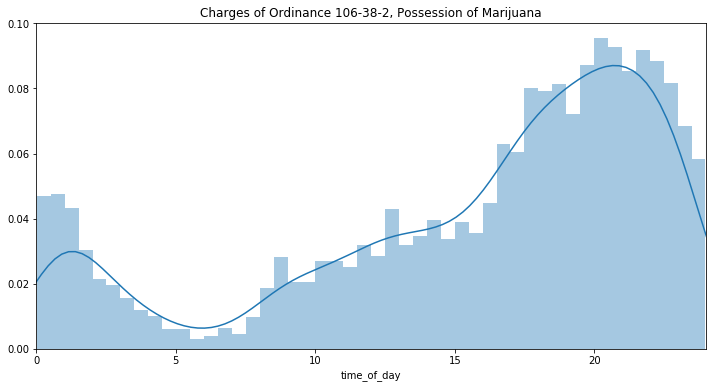

<Figure size 432x288 with 0 Axes>

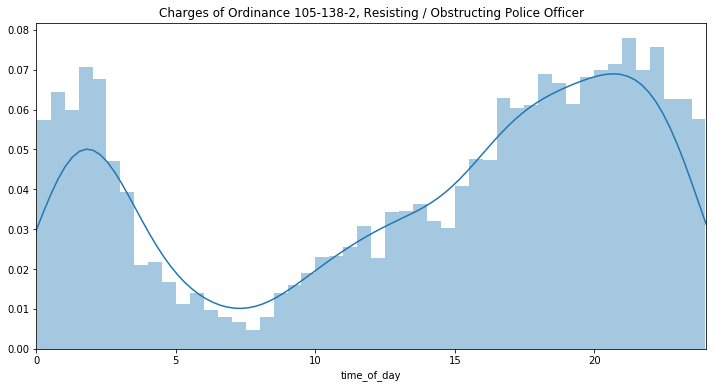

<Figure size 432x288 with 0 Axes>

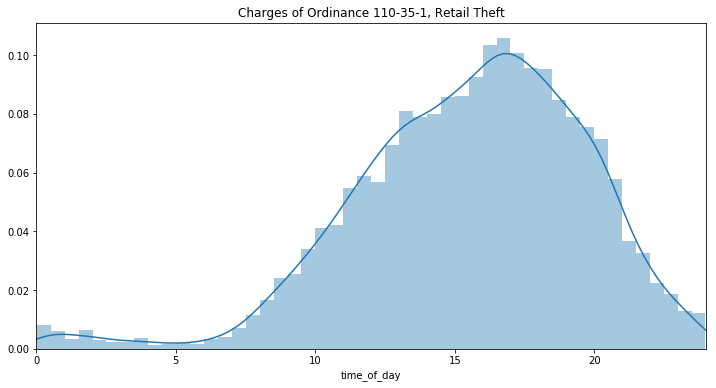

<Figure size 432x288 with 0 Axes>

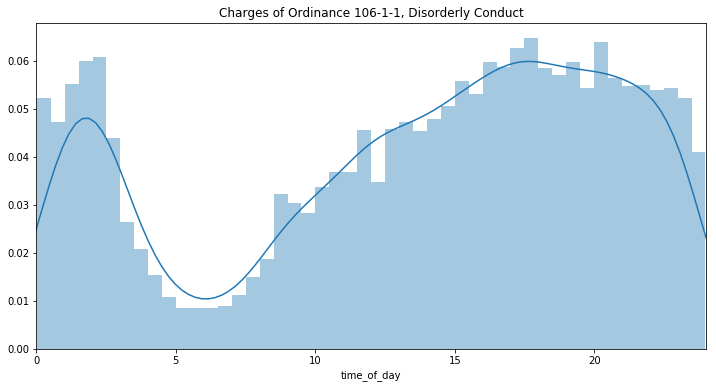

In [154]:
#histograms of daily charges
for c in range(0, ch):
    plt.clf()
    datac = data[(data['c_violation'] == charges[c]) & (data['time_of_day'] != 0)]
    plt.figure(figsize=(12, 6))
    sns.distplot(datac['time_of_day'], bins=48)
    plt.title('Charges of ' + charges[c])
    plt.xlim(0, 24)
    plt.show()

<Figure size 432x288 with 0 Axes>

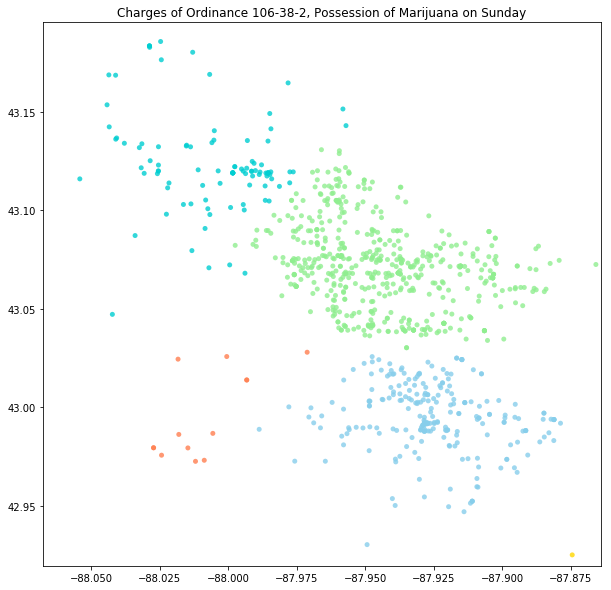

<Figure size 432x288 with 0 Axes>

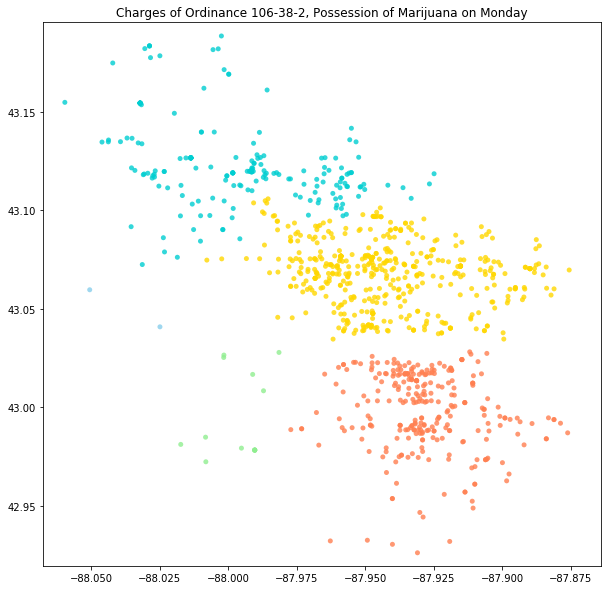

<Figure size 432x288 with 0 Axes>

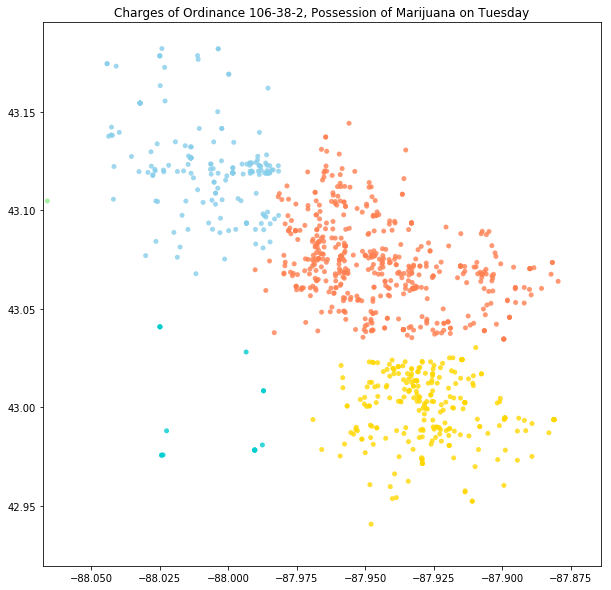

<Figure size 432x288 with 0 Axes>

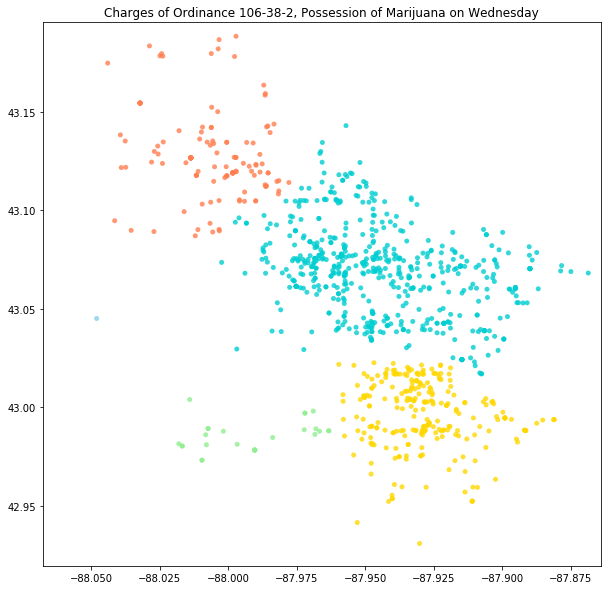

<Figure size 432x288 with 0 Axes>

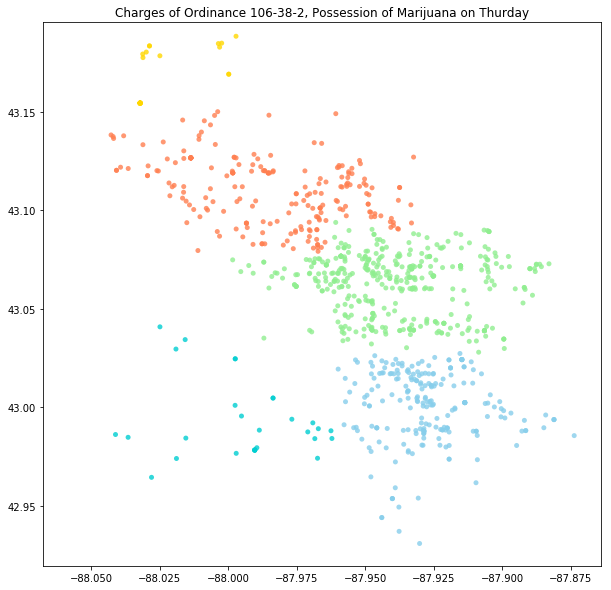

<Figure size 432x288 with 0 Axes>

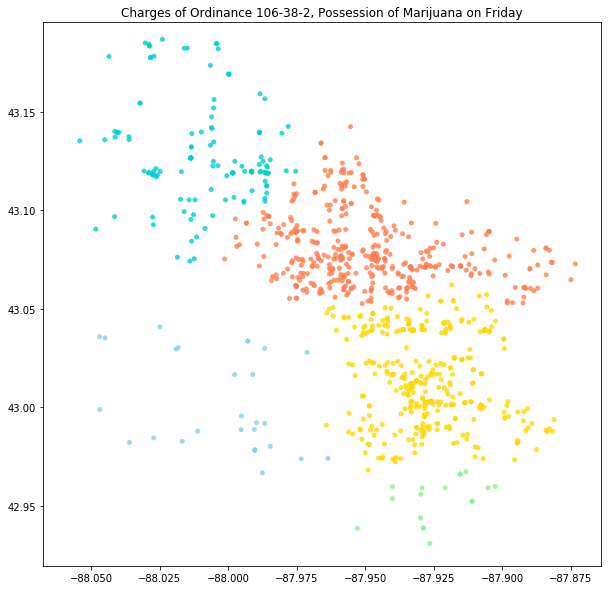

<Figure size 432x288 with 0 Axes>

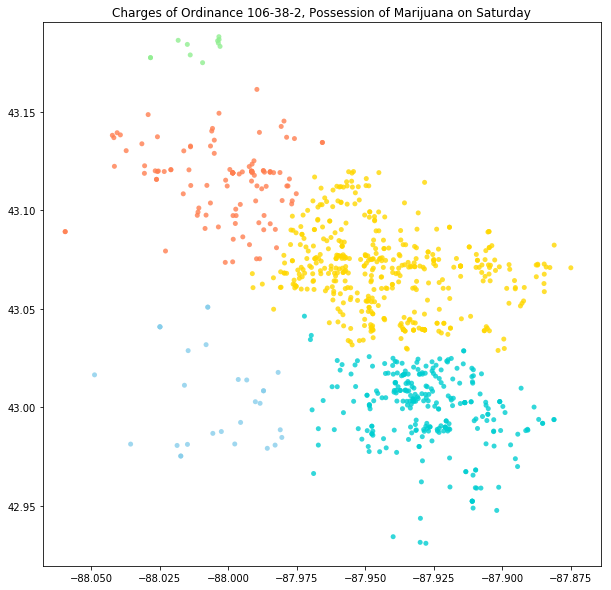

<Figure size 432x288 with 0 Axes>

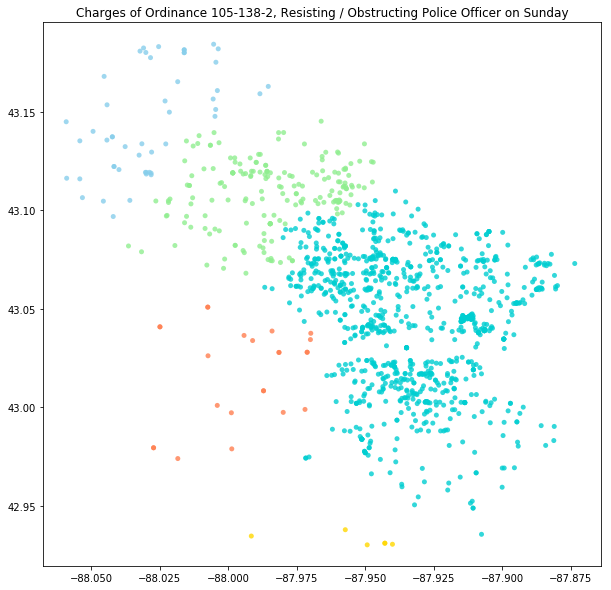

<Figure size 432x288 with 0 Axes>

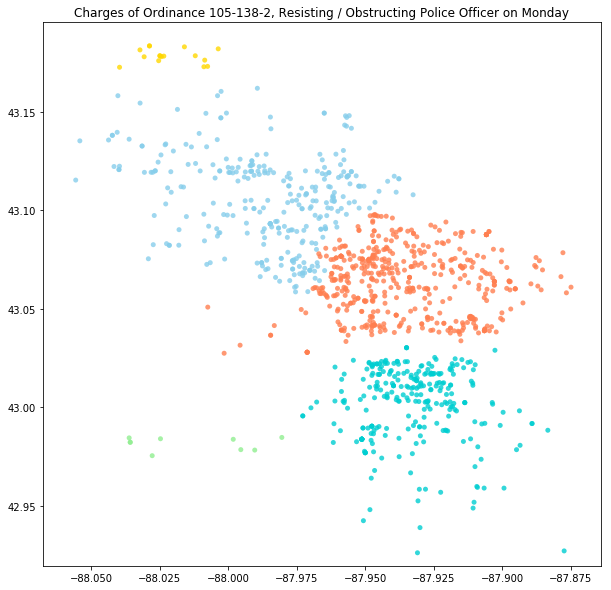

<Figure size 432x288 with 0 Axes>

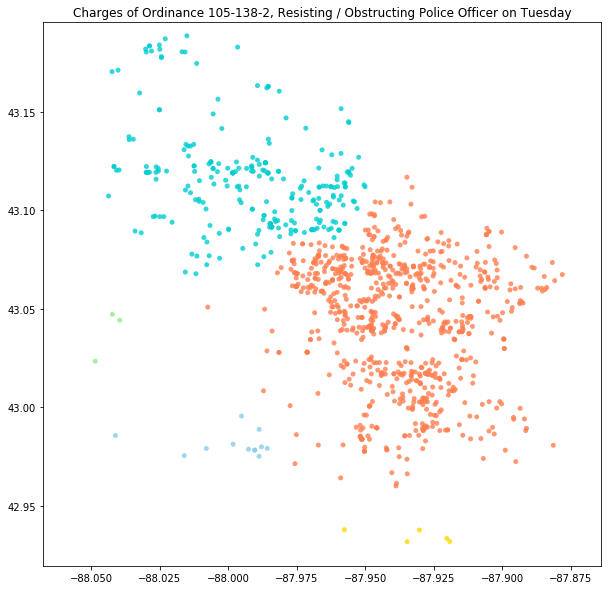

<Figure size 432x288 with 0 Axes>

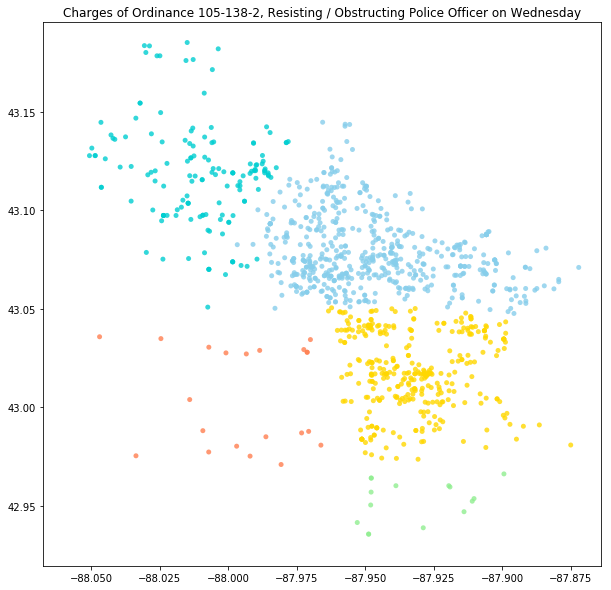

<Figure size 432x288 with 0 Axes>

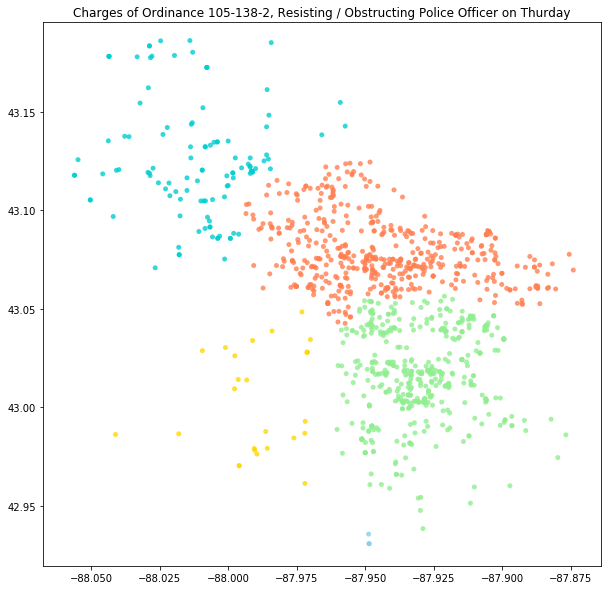

<Figure size 432x288 with 0 Axes>

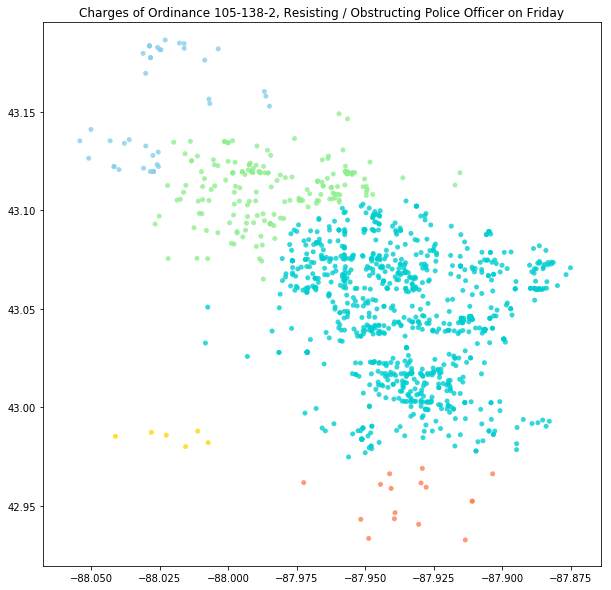

<Figure size 432x288 with 0 Axes>

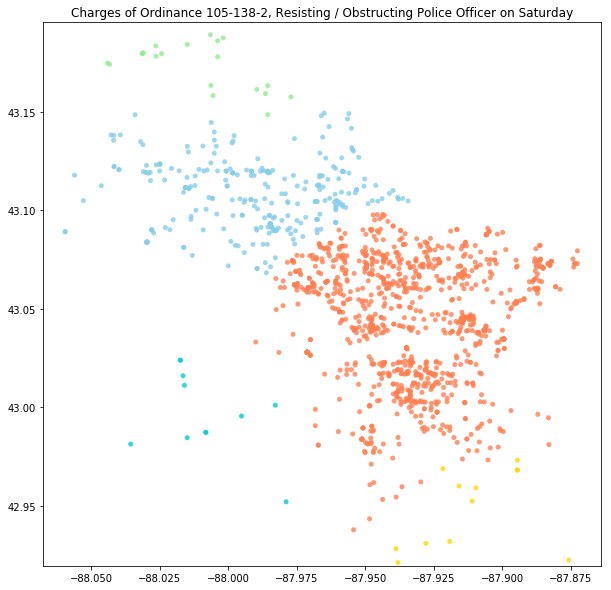

<Figure size 432x288 with 0 Axes>

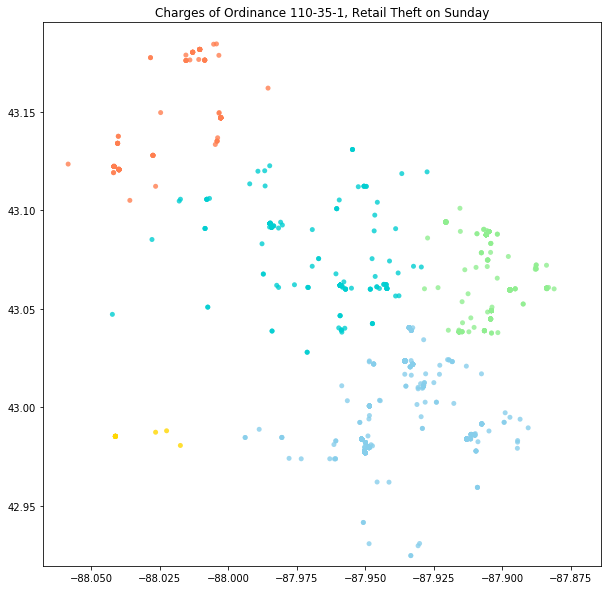

<Figure size 432x288 with 0 Axes>

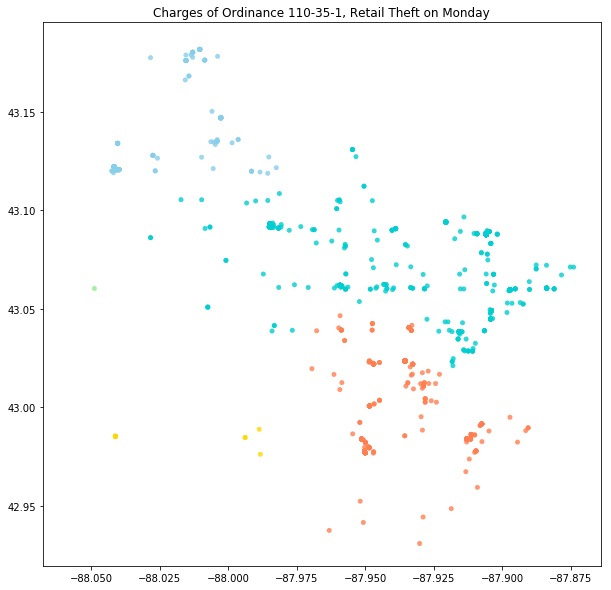

<Figure size 432x288 with 0 Axes>

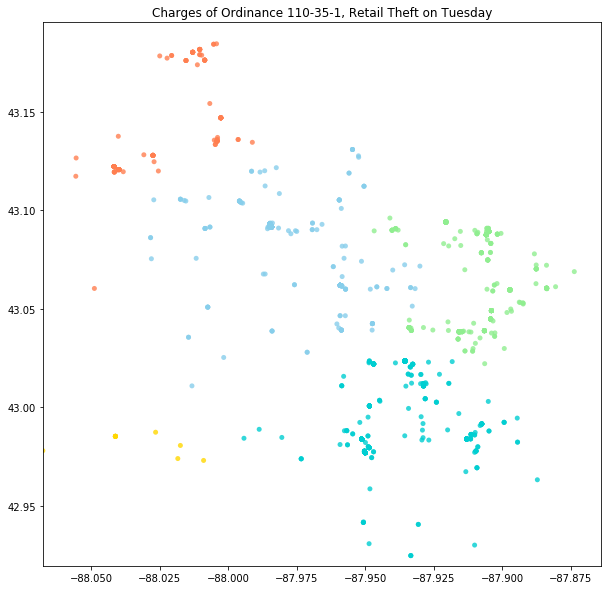

<Figure size 432x288 with 0 Axes>

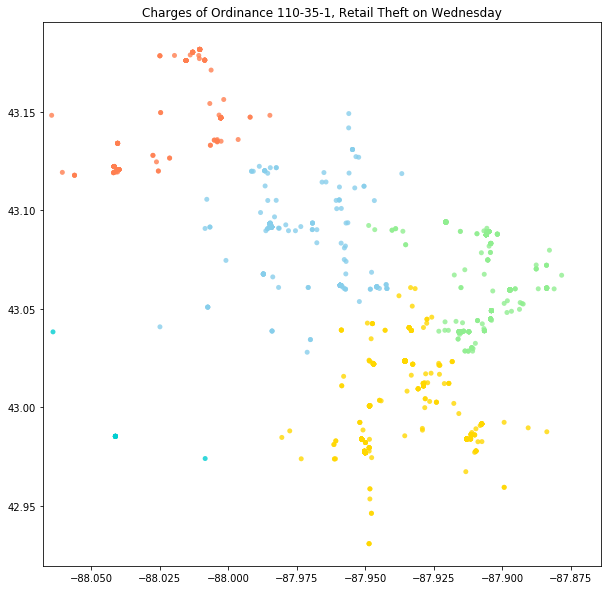

<Figure size 432x288 with 0 Axes>

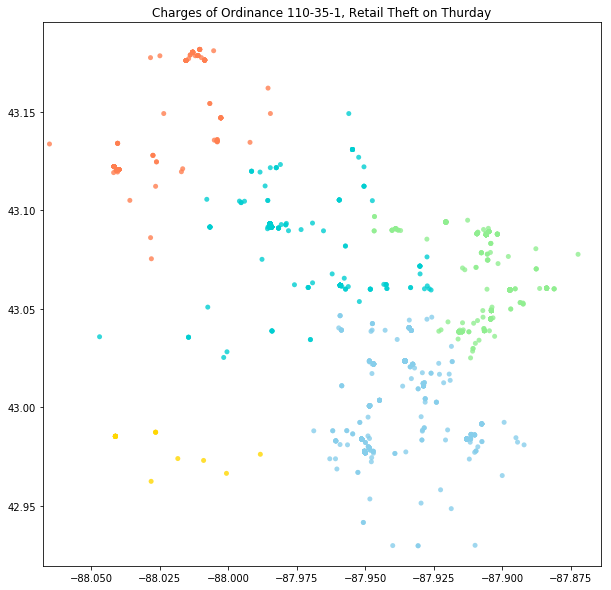

<Figure size 432x288 with 0 Axes>

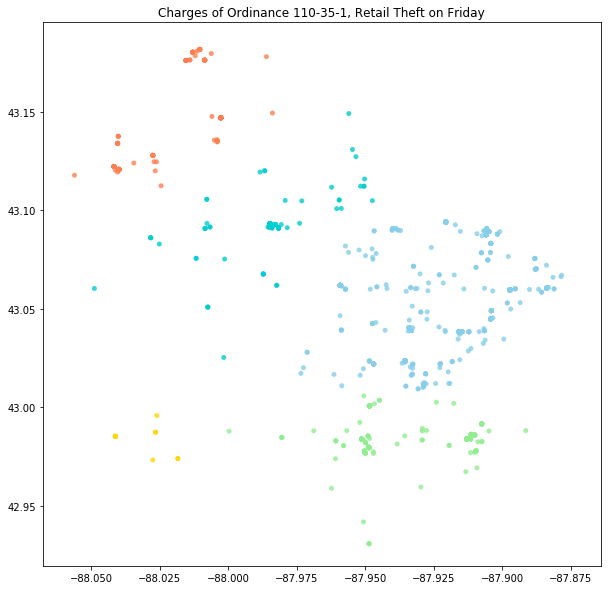

<Figure size 432x288 with 0 Axes>

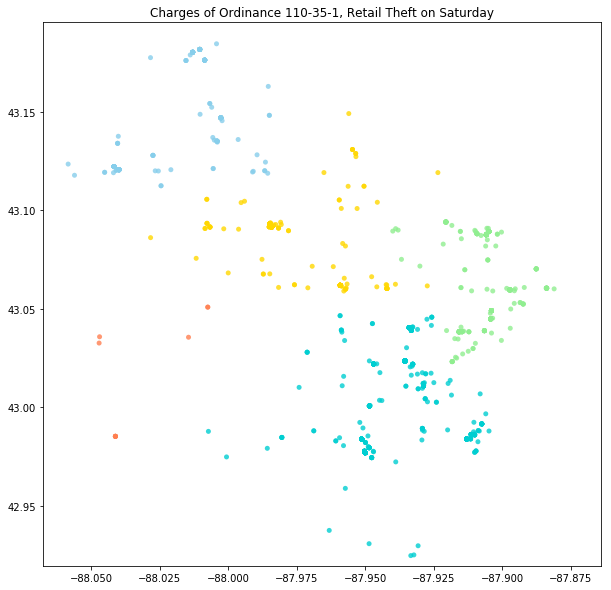

<Figure size 432x288 with 0 Axes>

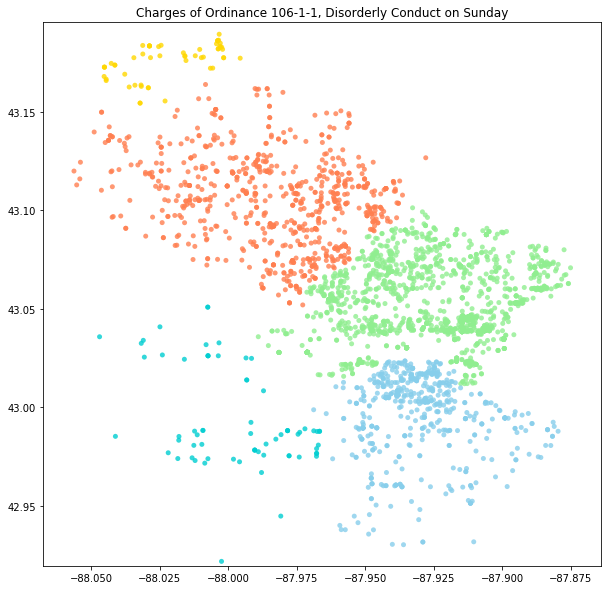

<Figure size 432x288 with 0 Axes>

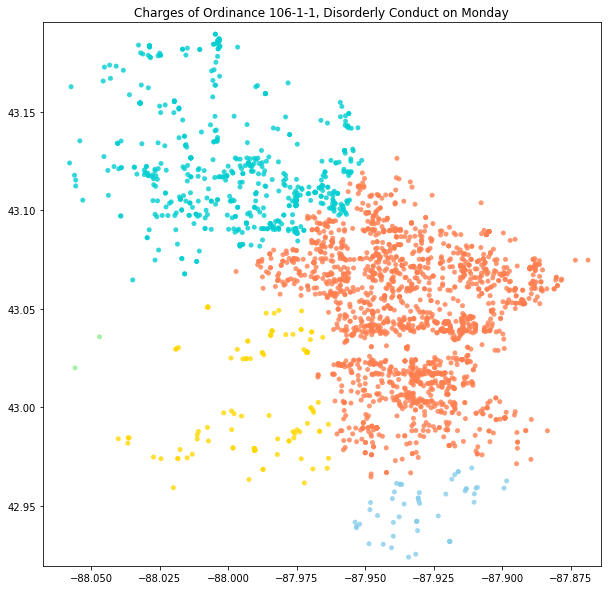

<Figure size 432x288 with 0 Axes>

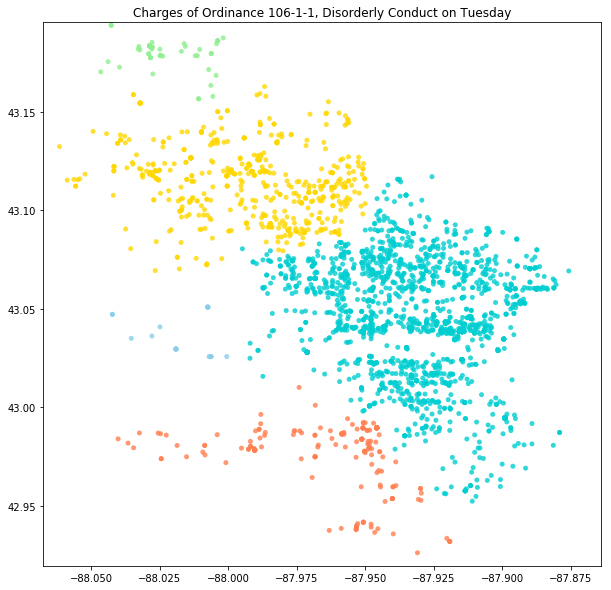

<Figure size 432x288 with 0 Axes>

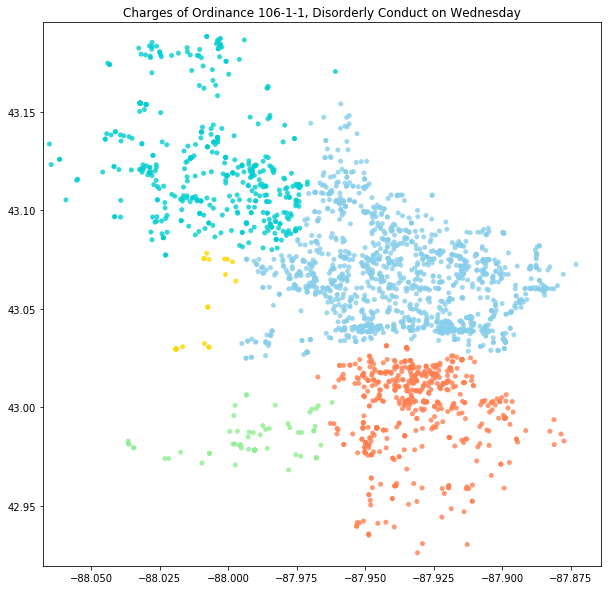

<Figure size 432x288 with 0 Axes>

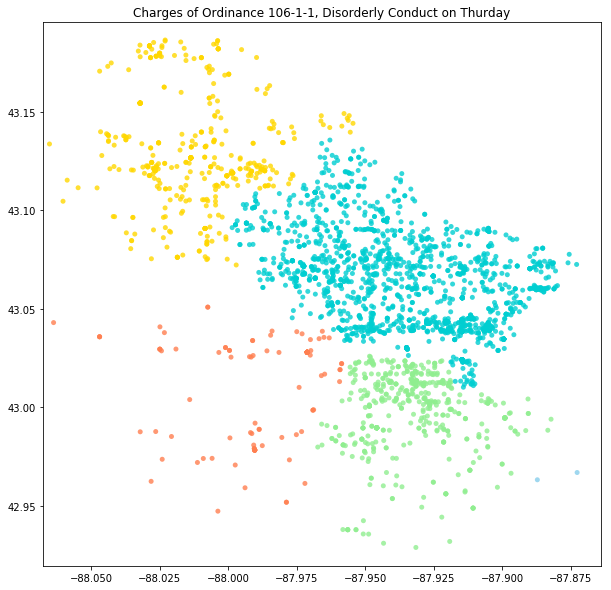

<Figure size 432x288 with 0 Axes>

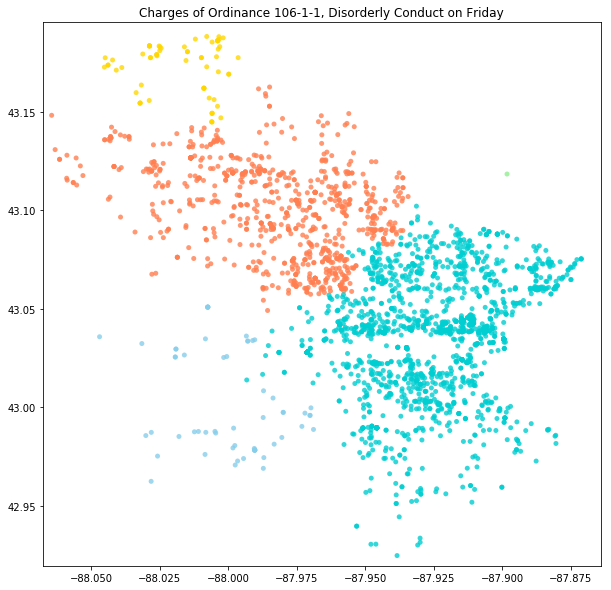

<Figure size 432x288 with 0 Axes>

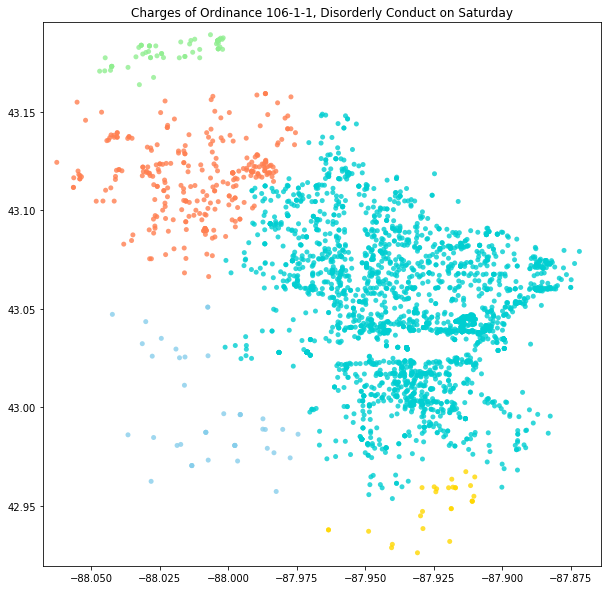

In [168]:
#clustering by day of week
charges = ['Ordinance 106-38-2, Possession of Marijuana', 'Ordinance 105-138-2, Resisting / Obstructing Police Officer', 'Ordinance 110-35-1, Retail Theft', 'Ordinance 106-1-1, Disorderly Conduct']
ch = len(charges)
days = {0:'Sunday', 1:'Monday', 2:'Tuesday',
       3:'Wednesday', 4:'Thurday', 5:'Friday', 6:'Saturday'}

#charges
for c in range(0, ch):
    datac = data[data['c_violation'] == charges[c]]
    #day of week
    for t in range(0, 7):
        plt.clf()
        plt.figure(figsize=(10,10))
        datact = datac[datac['day_of_week'] == t]
        if len(datact.index) < 5:
            plt.scatter(datact['x_lng'],datact['y_lat'], c='black', s=25)
        else:
            agg = sklearn.cluster.AgglomerativeClustering(n_clusters = 5, linkage = 'average', affinity='manhattan')
            agg.fit(datact[['x_lng', 'y_lat']])
            cluster = agg.labels_
            plt.scatter(datact['x_lng'],datact['y_lat'], c=colors[cluster], alpha=.8, linewidth=0, s=25)
        plt.title('Charges of ' + charges[c] + ' on ' + days[t])
        plt.ylim(42.9197, 43.1953)
        plt.xlim(-88.0676, -87.8640)
        plt.savefig('WEEK_c_' + str(c) + '_t_' + str(t) + '.png')
        plt.show()

In [183]:
#make animated visualizations 
import glob
import moviepy.editor as mpy

for x in range (0, ch):
    gif_name = 'week_ch_' + str(x) +'.gif'
    fps = 1
    t = 'WEEK_c_' + str(c) + '*' + '.png'
    file_list = glob.glob(t) # Get all the pngs in the current directory
    list.sort(file_list, key=lambda x: int(x.split('_')[4].split('.png')[0])) # Sort the images by #, this may need to be tweaked for your use case
    clip = mpy.ImageSequenceClip(file_list, fps=fps)
    clip.write_gif(gif_name, fps=fps)
    
#source: http://superfluoussextant.com/making-gifs-with-python.html


[MoviePy] Building file week_ch_0.gif with imageio


 88%|████████▊ | 7/8 [00:00<00:00, 12.34it/s]



[MoviePy] Building file week_ch_1.gif with imageio


 88%|████████▊ | 7/8 [00:00<00:00, 11.55it/s]



[MoviePy] Building file week_ch_2.gif with imageio


 88%|████████▊ | 7/8 [00:00<00:00, 11.99it/s]



[MoviePy] Building file week_ch_3.gif with imageio


 88%|████████▊ | 7/8 [00:00<00:00, 12.42it/s]


<Figure size 432x288 with 0 Axes>

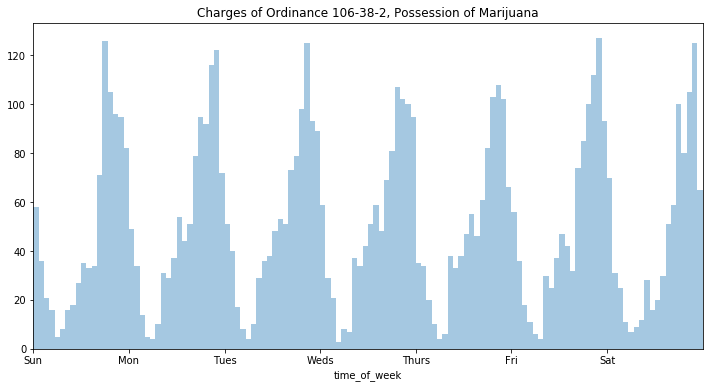

<Figure size 432x288 with 0 Axes>

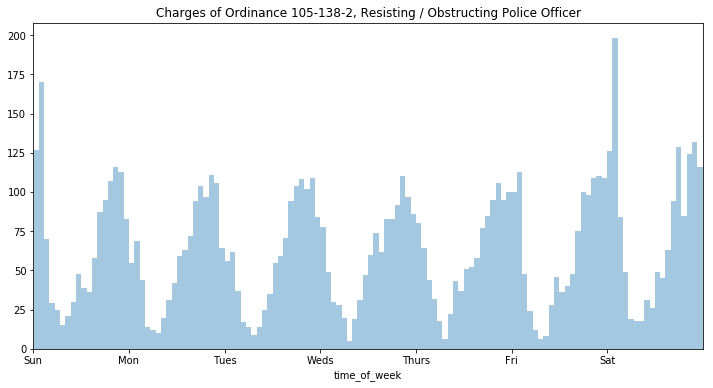

<Figure size 432x288 with 0 Axes>

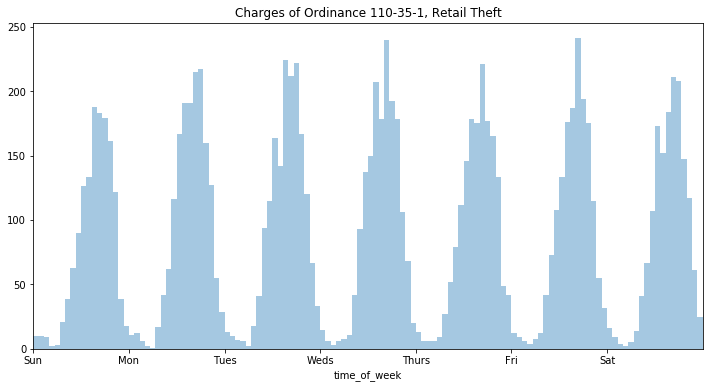

<Figure size 432x288 with 0 Axes>

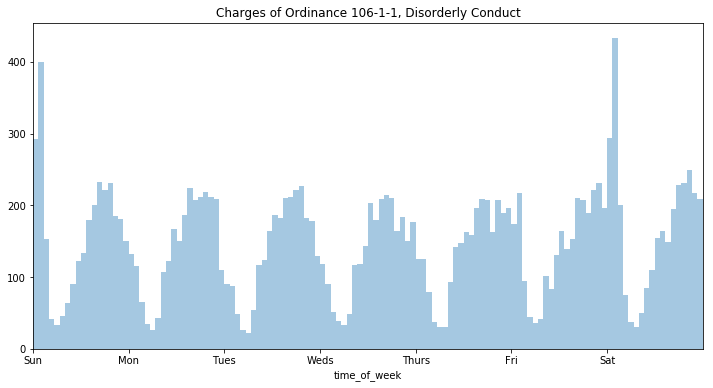

In [179]:
#histograms of weekly charges
for c in range(0, ch):
    plt.clf()
    datac = data[(data['c_violation'] == charges[c])]
    datac = datac[datac['time_of_day'] != 0.0]
    plt.figure(figsize=(12, 6))
    sns.distplot(datac['time_of_week'], bins=126, kde=False)
    plt.title('Charges of ' + charges[c])
    plt.xlim(0, 168)
    plt.xticks(np.linspace(0, (6*24), 7), ['Sun', 'Mon', 'Tues', 'Weds', 'Thurs', 'Fri', 'Sat', 'Sun'])
    plt.show()

<Figure size 432x288 with 0 Axes>

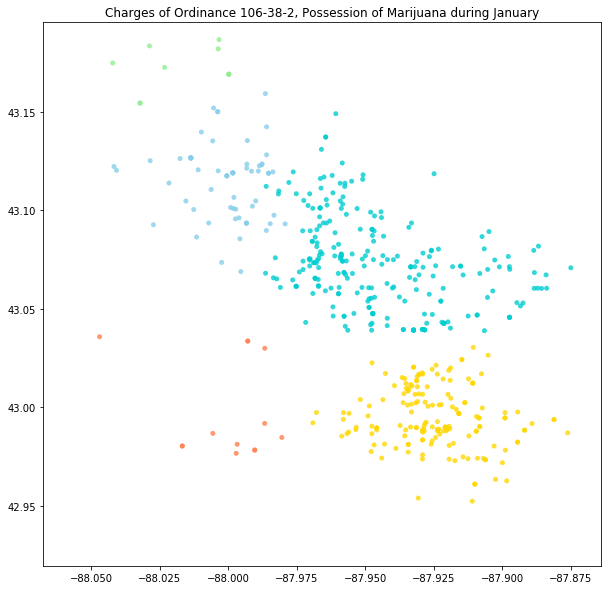

<Figure size 432x288 with 0 Axes>

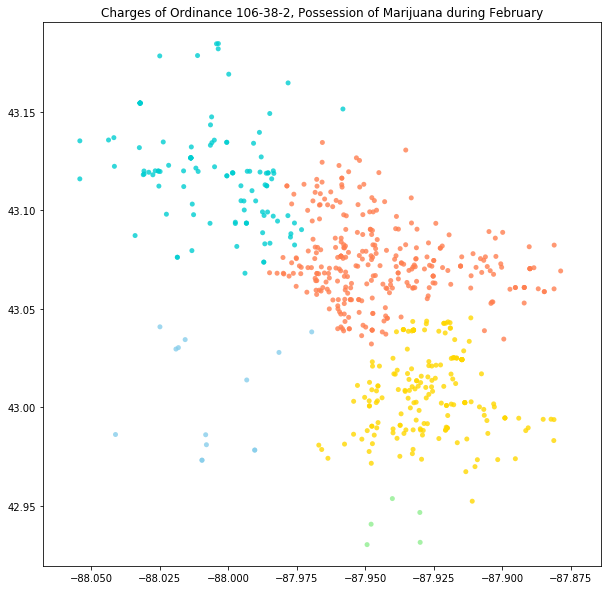

<Figure size 432x288 with 0 Axes>

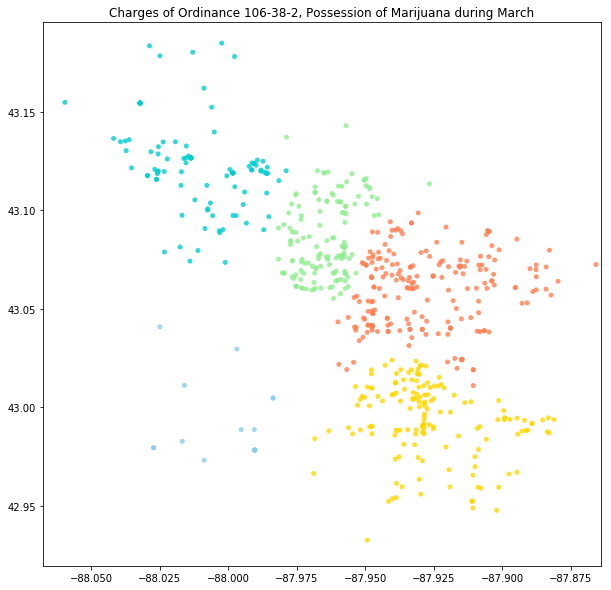

<Figure size 432x288 with 0 Axes>

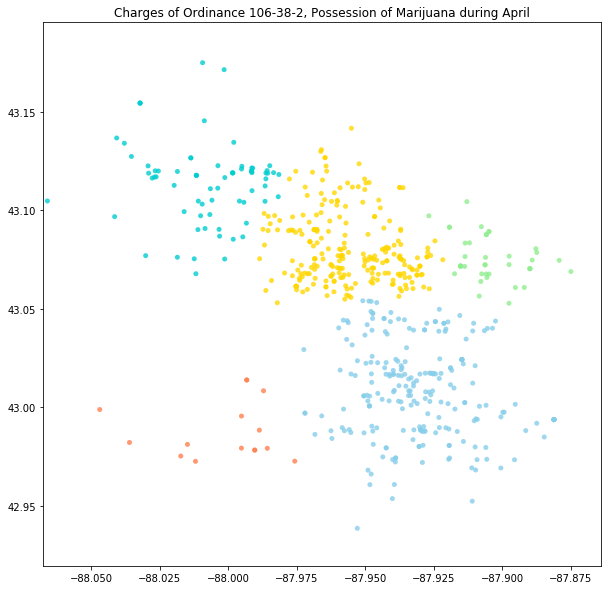

<Figure size 432x288 with 0 Axes>

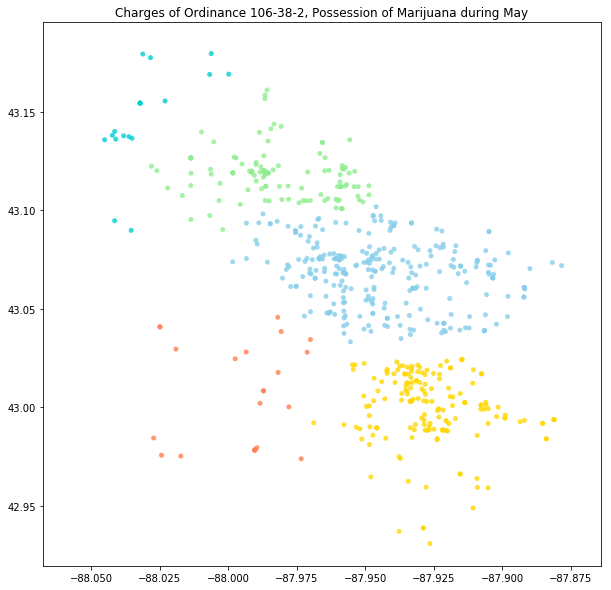

<Figure size 432x288 with 0 Axes>

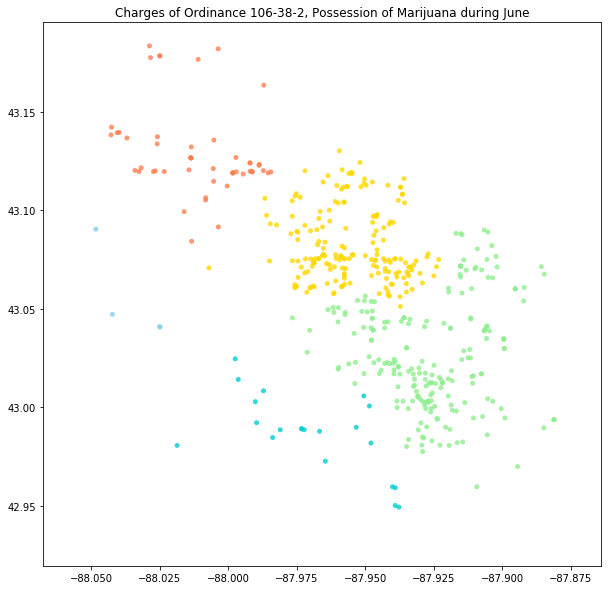

<Figure size 432x288 with 0 Axes>

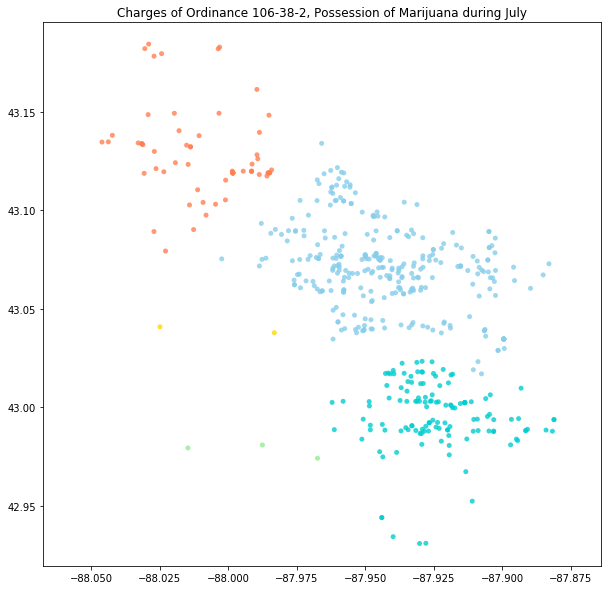

<Figure size 432x288 with 0 Axes>

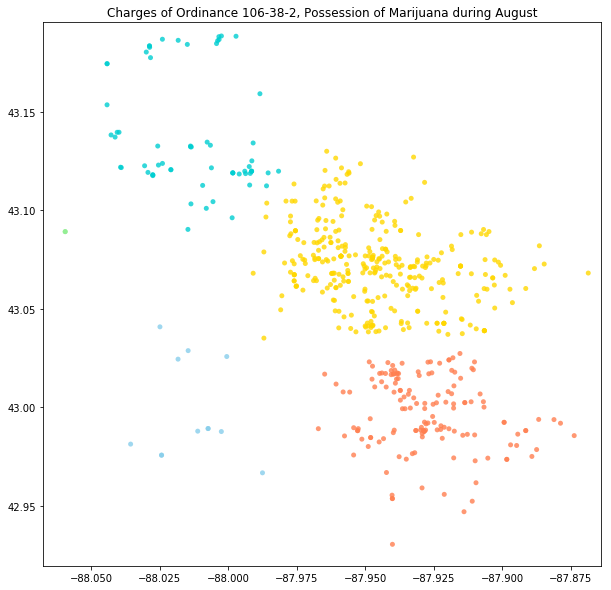

<Figure size 432x288 with 0 Axes>

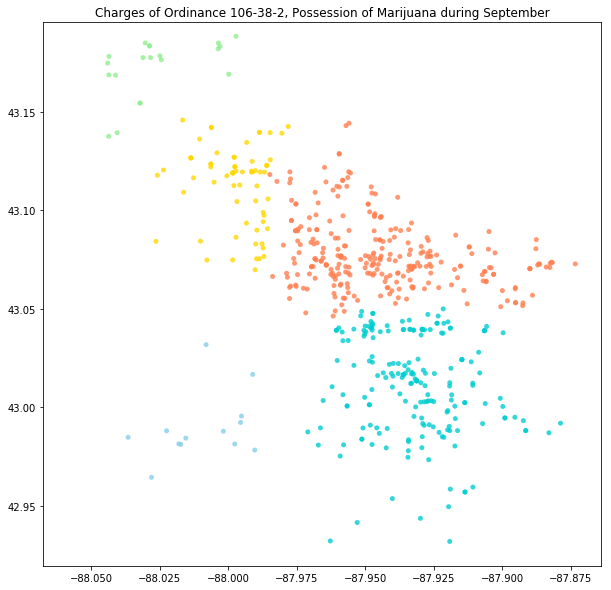

<Figure size 432x288 with 0 Axes>

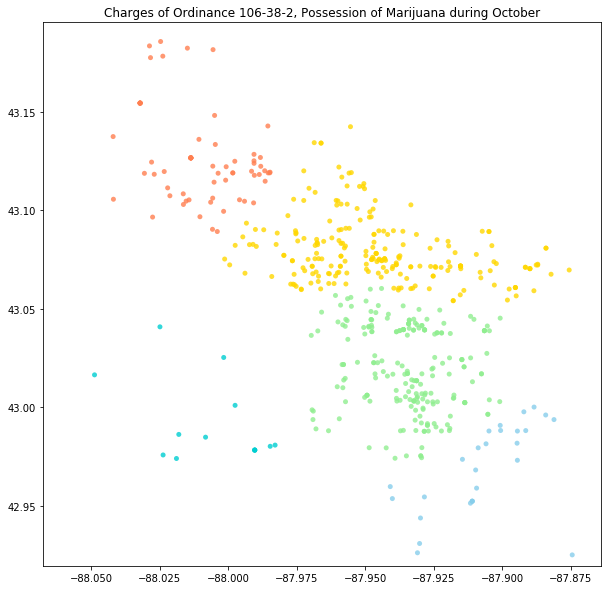

<Figure size 432x288 with 0 Axes>

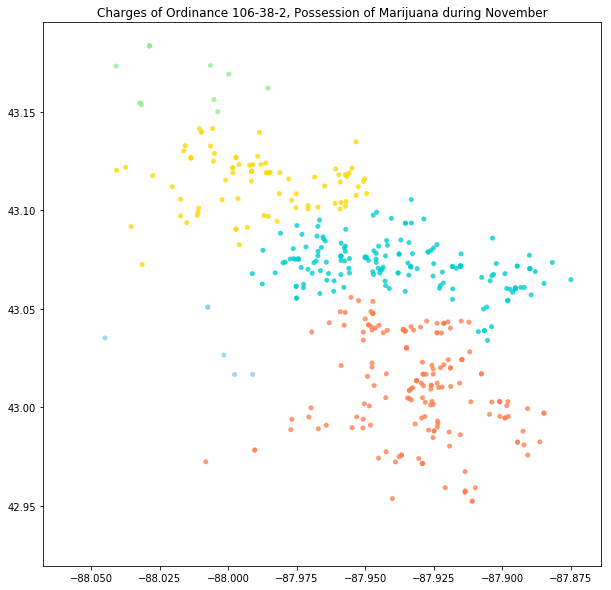

<Figure size 432x288 with 0 Axes>

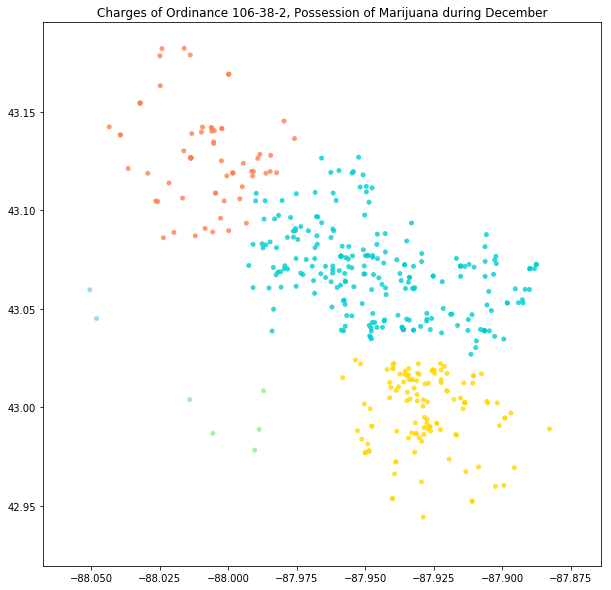

<Figure size 432x288 with 0 Axes>

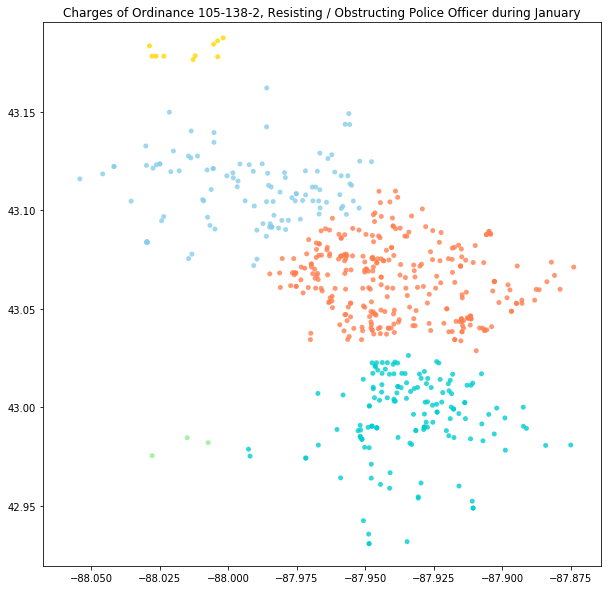

<Figure size 432x288 with 0 Axes>

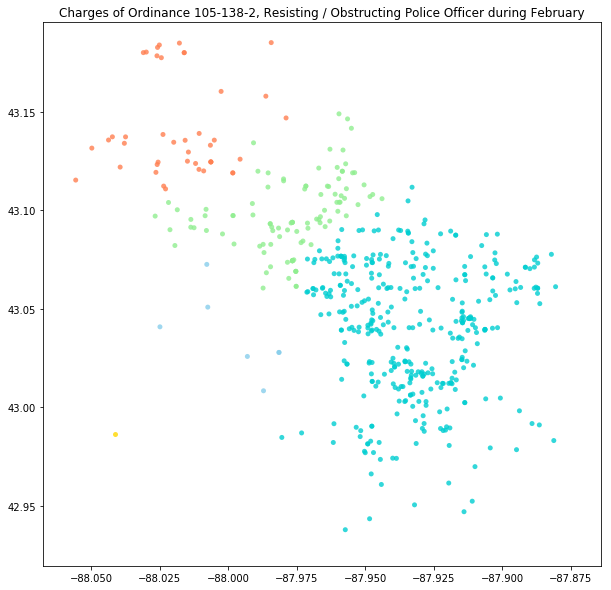

<Figure size 432x288 with 0 Axes>

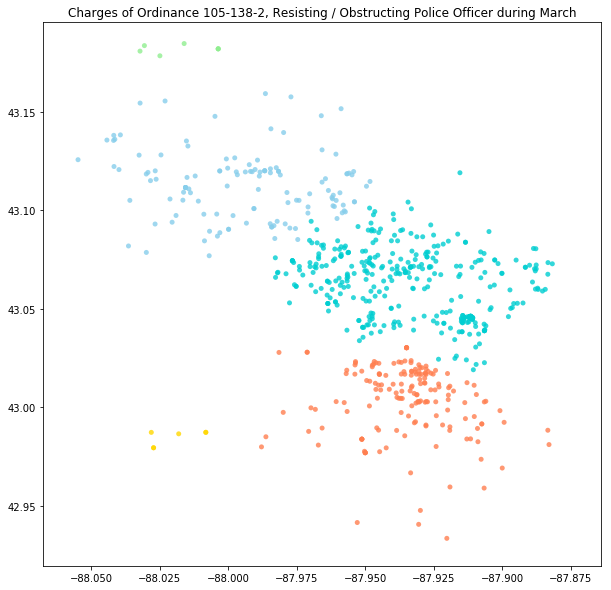

<Figure size 432x288 with 0 Axes>

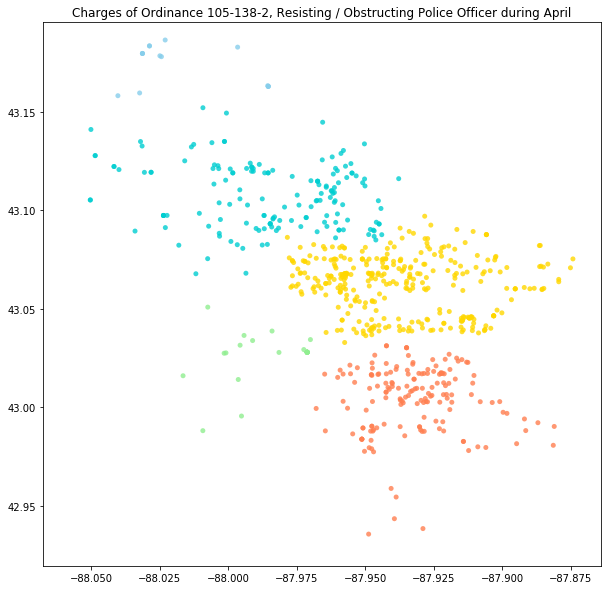

<Figure size 432x288 with 0 Axes>

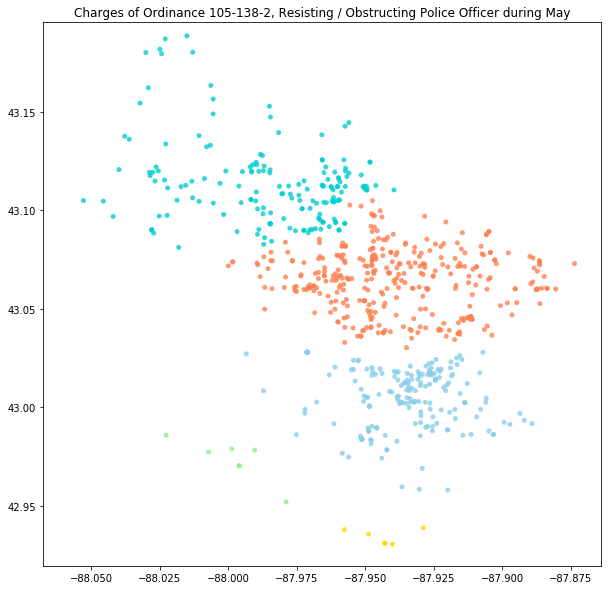

<Figure size 432x288 with 0 Axes>

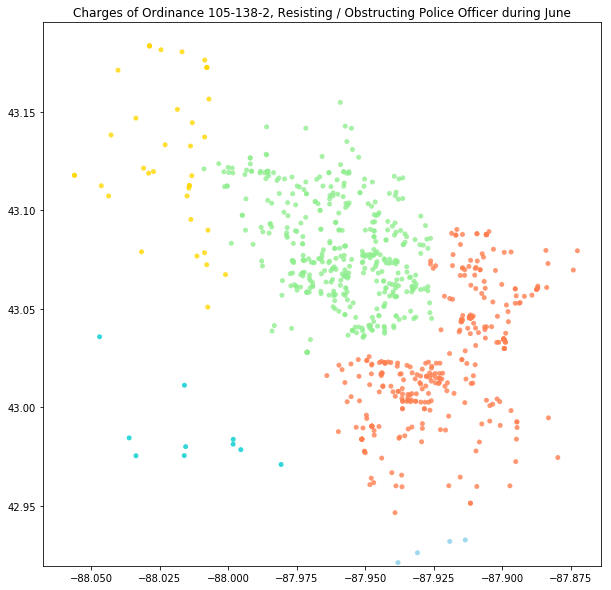

<Figure size 432x288 with 0 Axes>

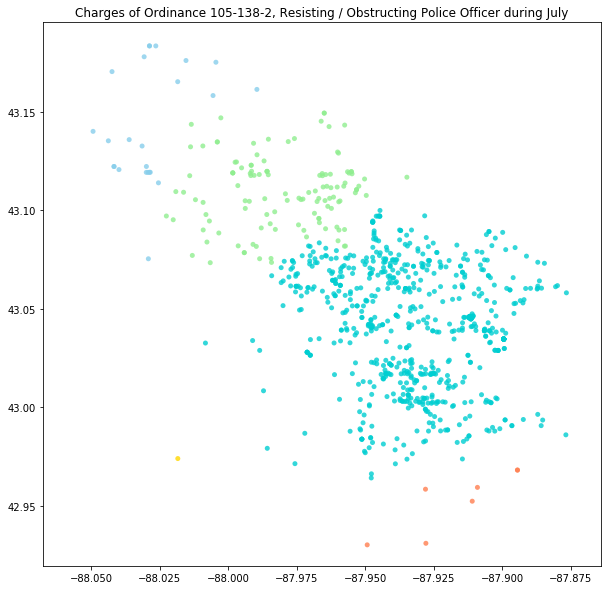

<Figure size 432x288 with 0 Axes>

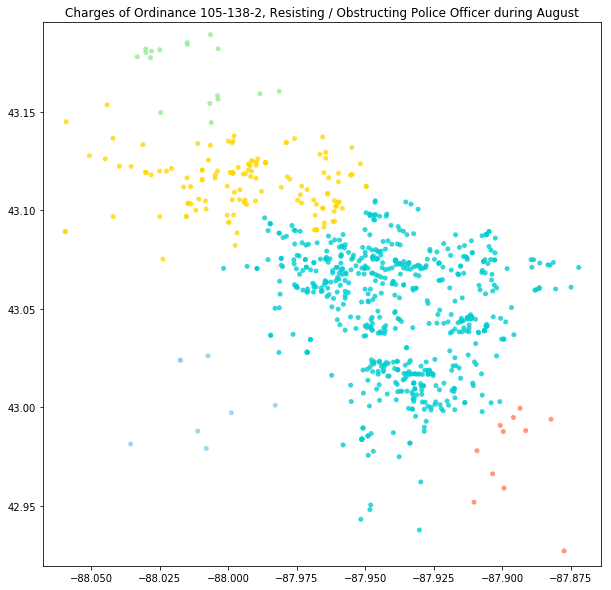

<Figure size 432x288 with 0 Axes>

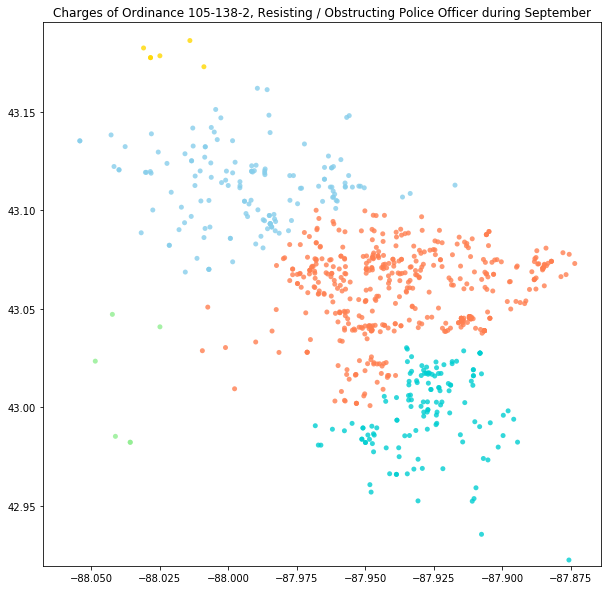

<Figure size 432x288 with 0 Axes>

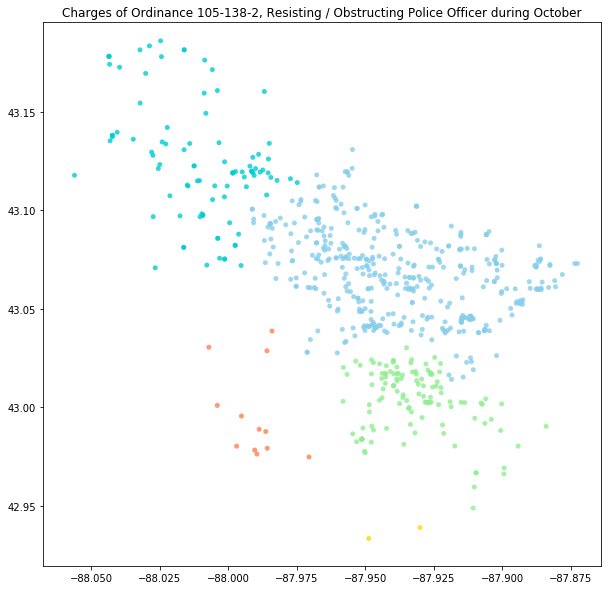

<Figure size 432x288 with 0 Axes>

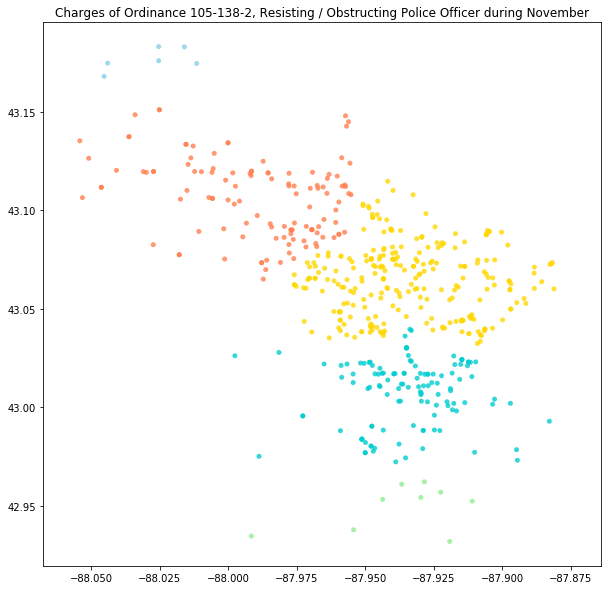

<Figure size 432x288 with 0 Axes>

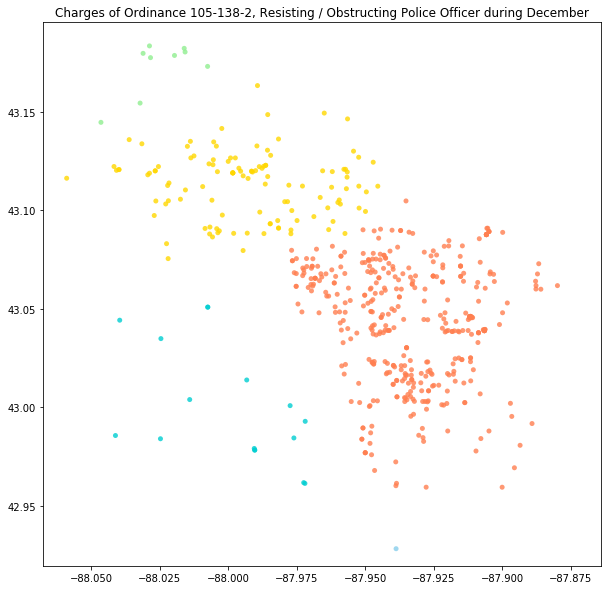

<Figure size 432x288 with 0 Axes>

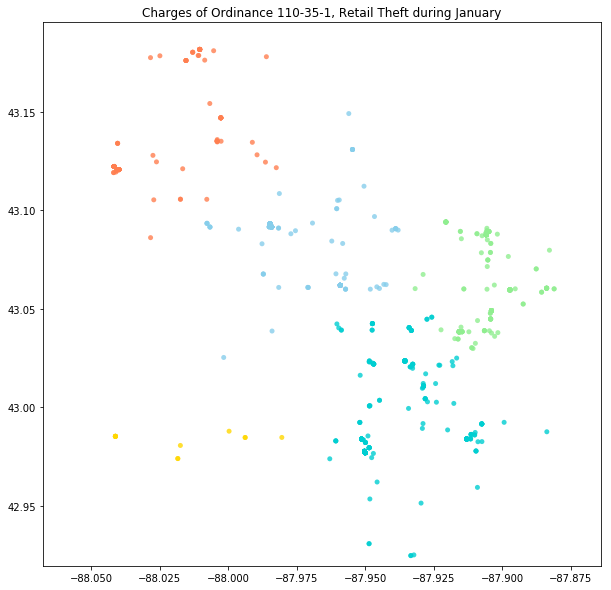

<Figure size 432x288 with 0 Axes>

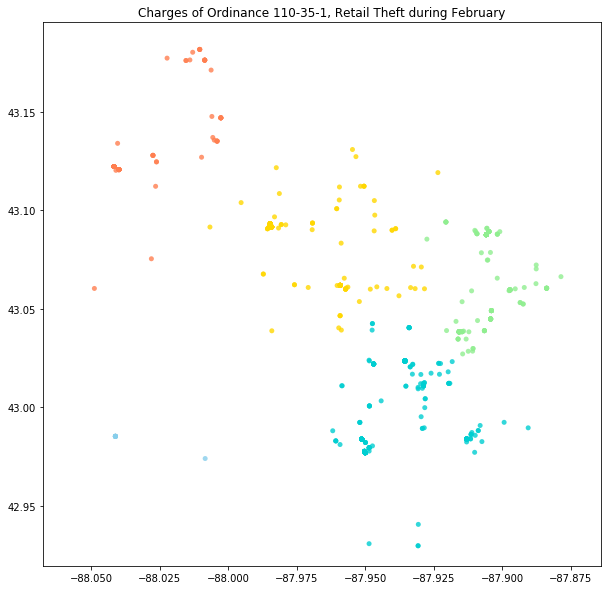

<Figure size 432x288 with 0 Axes>

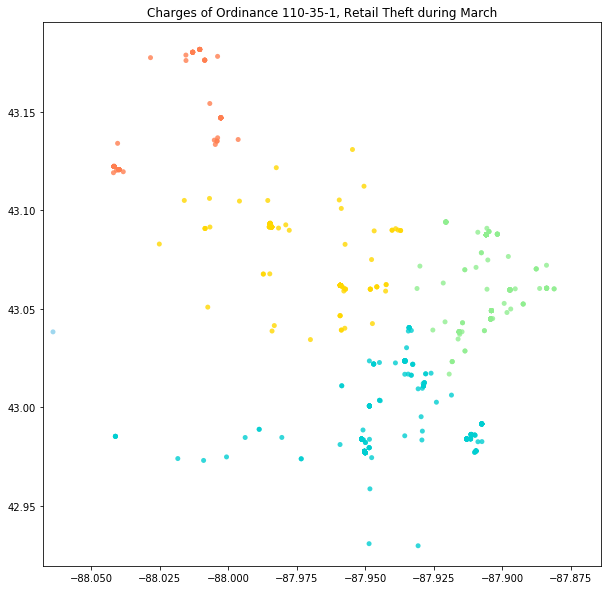

<Figure size 432x288 with 0 Axes>

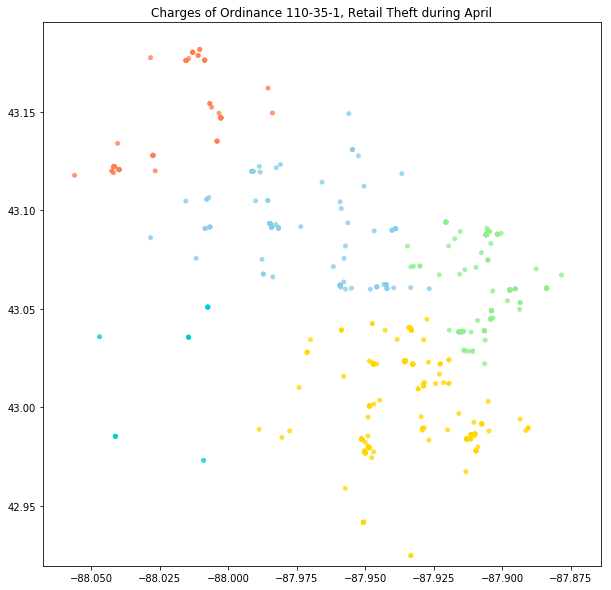

<Figure size 432x288 with 0 Axes>

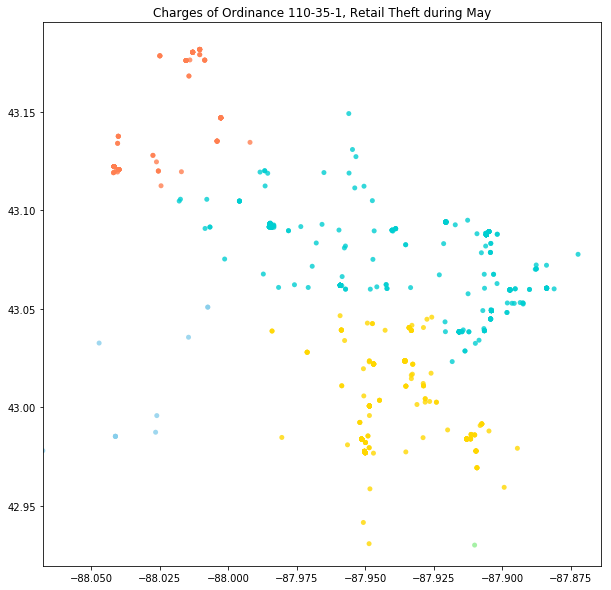

<Figure size 432x288 with 0 Axes>

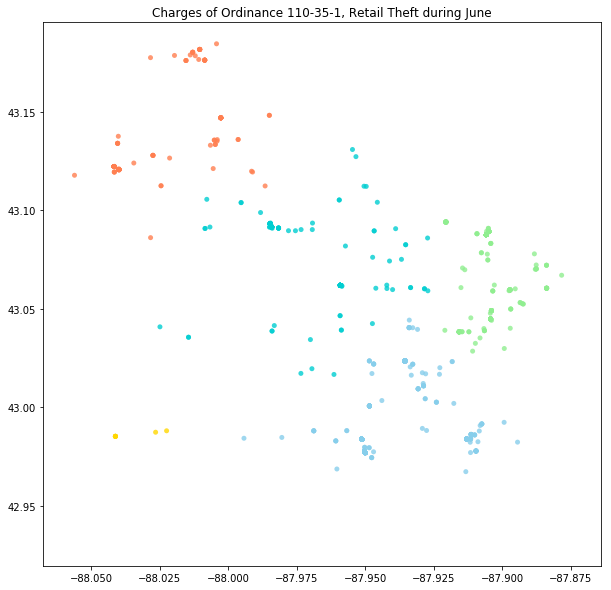

<Figure size 432x288 with 0 Axes>

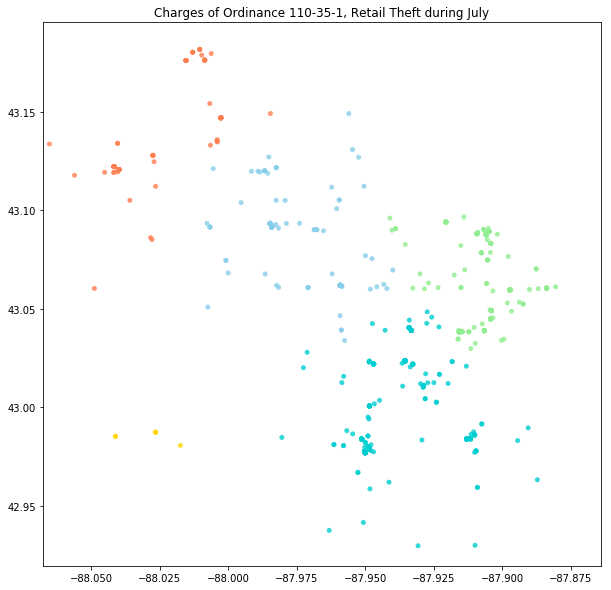

<Figure size 432x288 with 0 Axes>

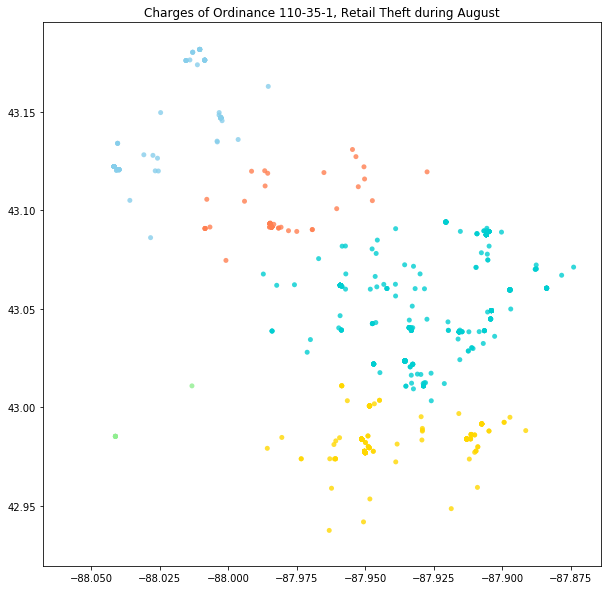

<Figure size 432x288 with 0 Axes>

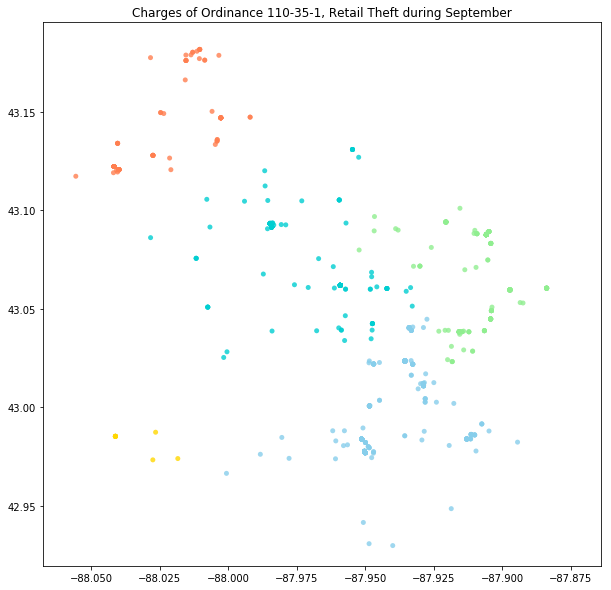

<Figure size 432x288 with 0 Axes>

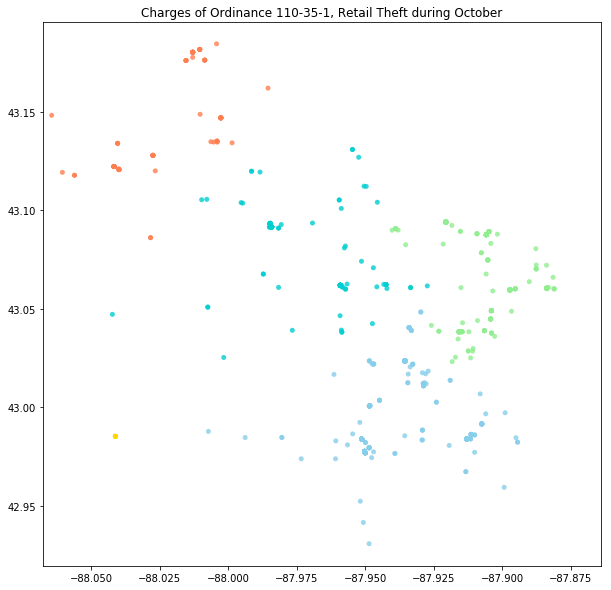

<Figure size 432x288 with 0 Axes>

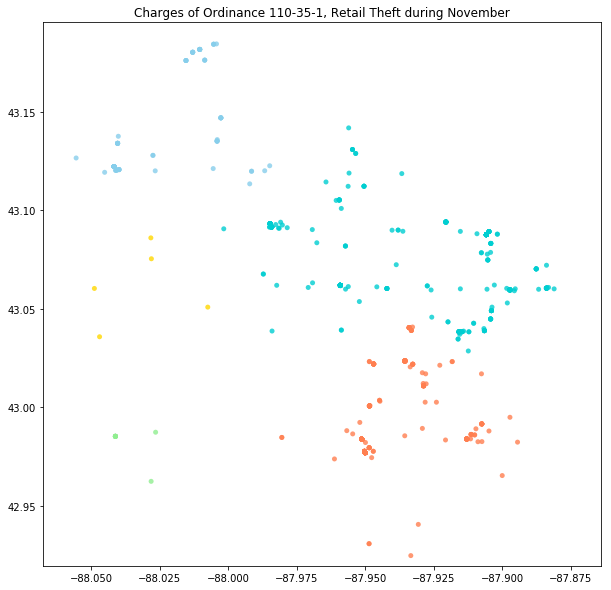

<Figure size 432x288 with 0 Axes>

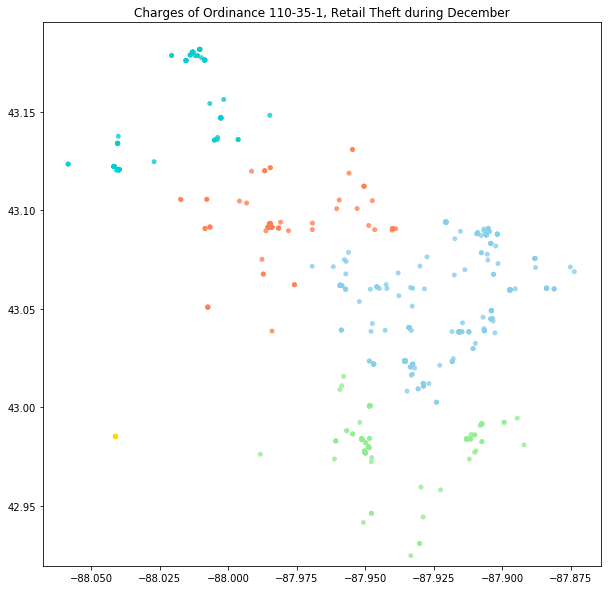

<Figure size 432x288 with 0 Axes>

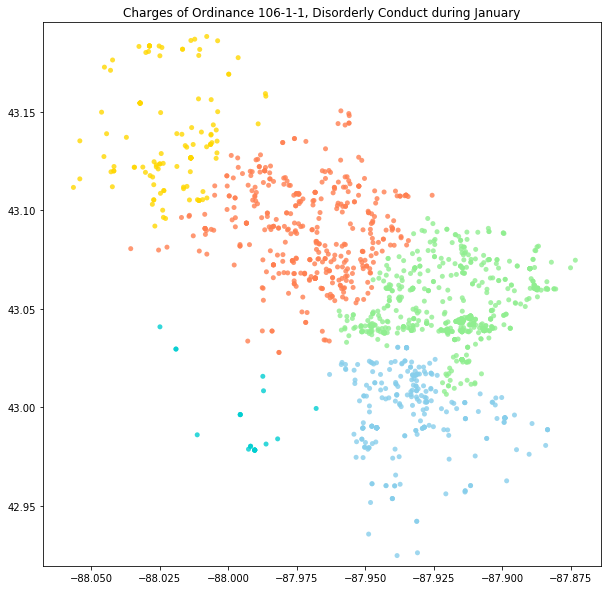

<Figure size 432x288 with 0 Axes>

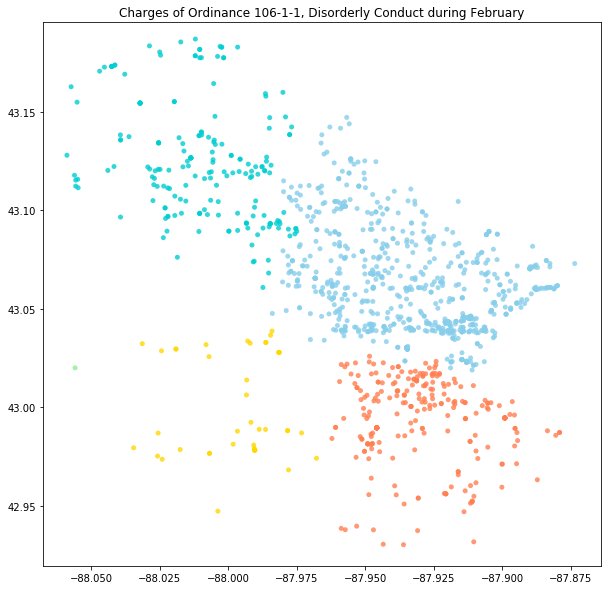

<Figure size 432x288 with 0 Axes>

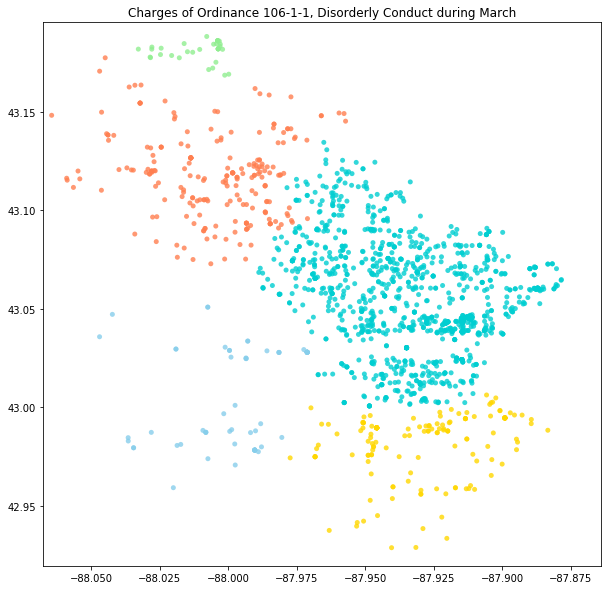

<Figure size 432x288 with 0 Axes>

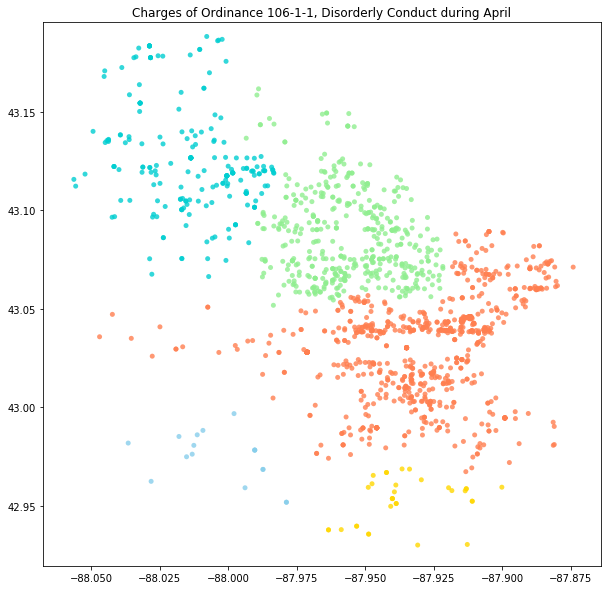

<Figure size 432x288 with 0 Axes>

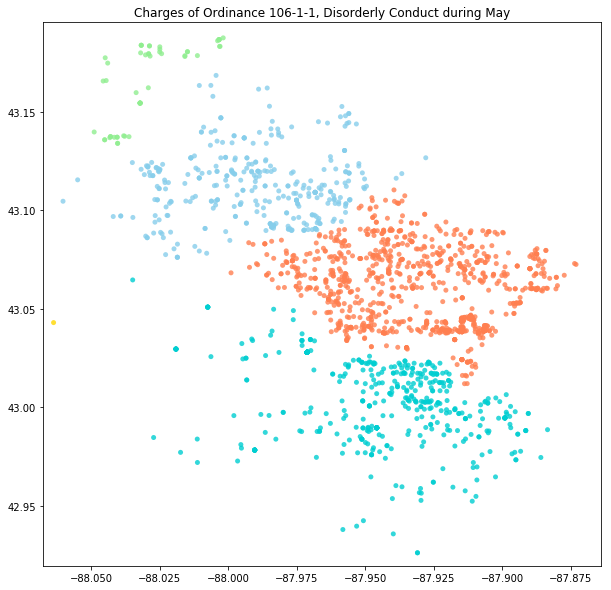

<Figure size 432x288 with 0 Axes>

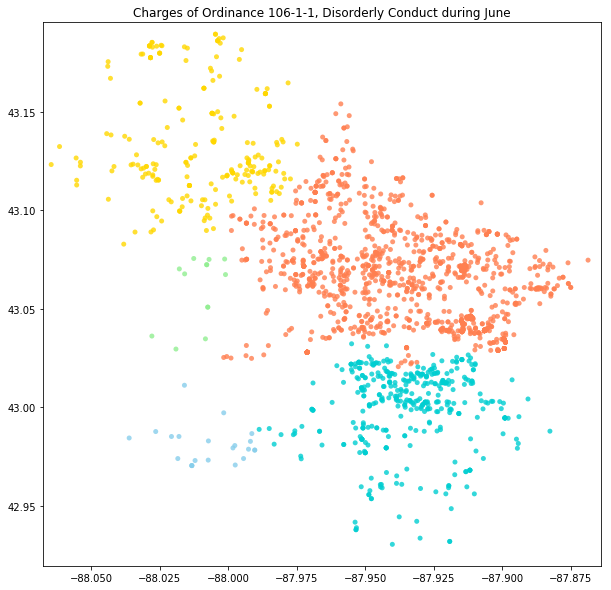

<Figure size 432x288 with 0 Axes>

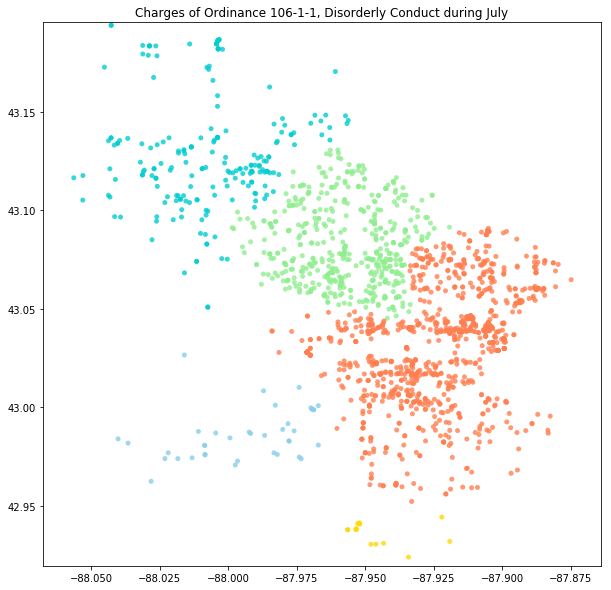

<Figure size 432x288 with 0 Axes>

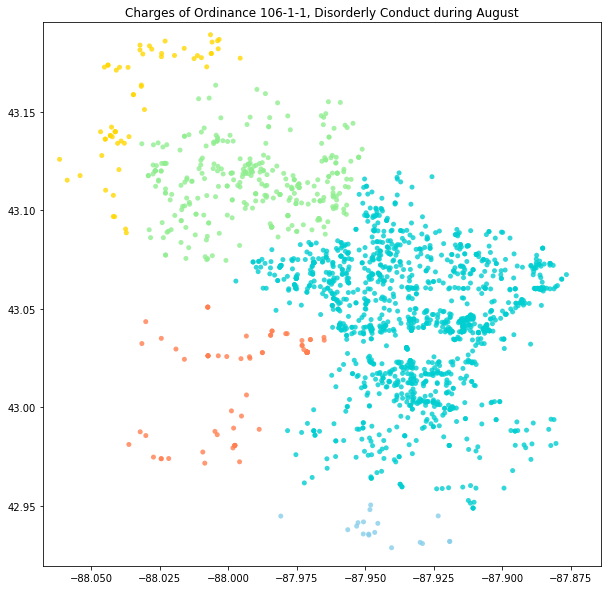

<Figure size 432x288 with 0 Axes>

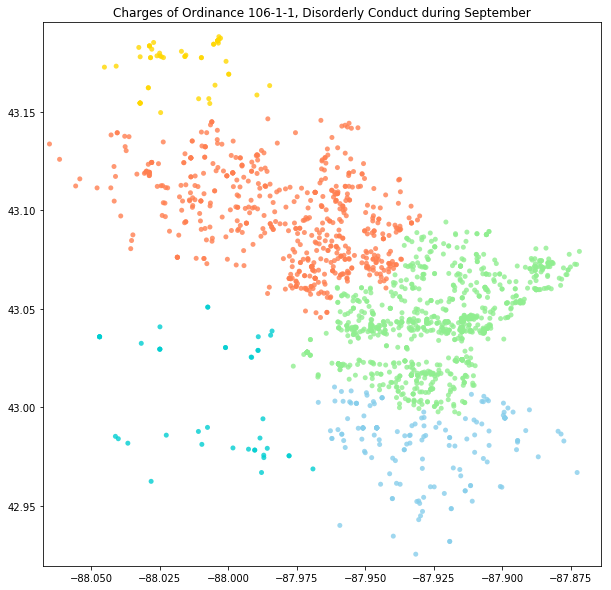

<Figure size 432x288 with 0 Axes>

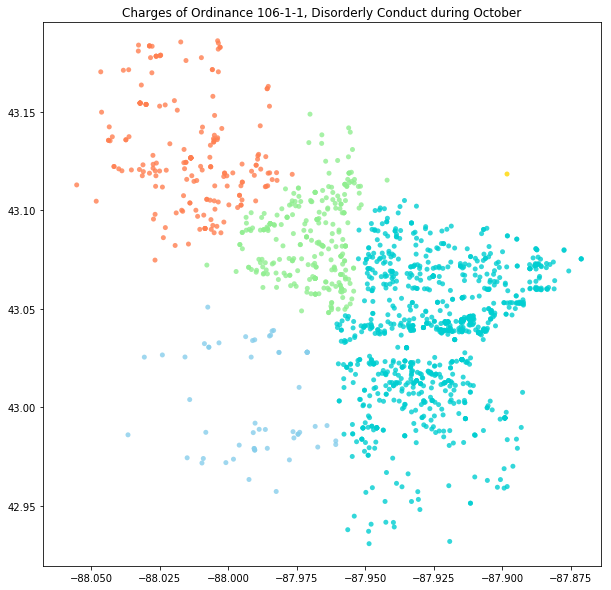

<Figure size 432x288 with 0 Axes>

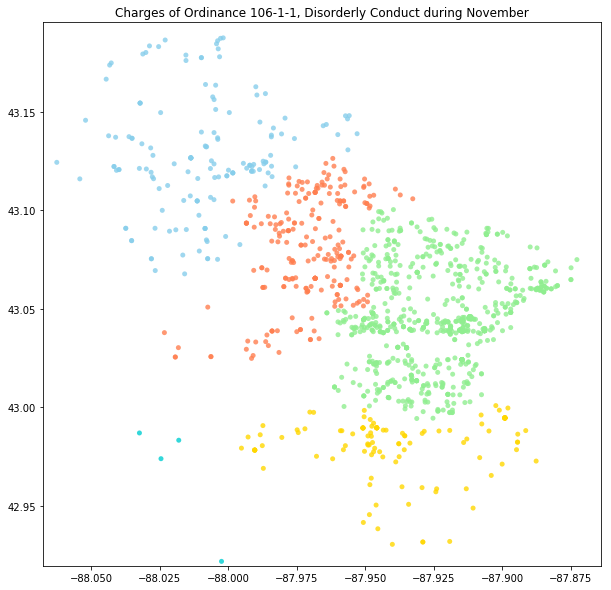

<Figure size 432x288 with 0 Axes>

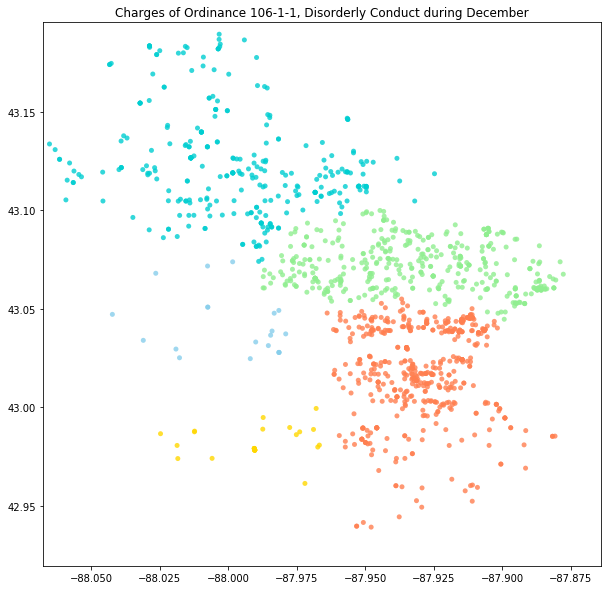

In [180]:
#clustering by time of year
charges = ['Ordinance 106-38-2, Possession of Marijuana', 'Ordinance 105-138-2, Resisting / Obstructing Police Officer', 'Ordinance 110-35-1, Retail Theft', 'Ordinance 106-1-1, Disorderly Conduct']
ch = len(charges)
months = {1:'January', 2:'February', 3:'March',
          4:'April', 5:'May', 6:'June',
         7:'July', 8:'August', 9:'September',
         10:'October', 11:'November', 12:'December'}

#charges
for c in range(0, ch):
    datac = data[data['c_violation'] == charges[c]]
    #month 
    for t in range(1, 13):
        plt.clf()
        plt.figure(figsize=(10,10))
        datact = datac[datac['month'] == t]
        if len(datact.index) < 5:
            plt.scatter(datact['x_lng'],datact['y_lat'], c='black', s=25)
        else:
            agg = sklearn.cluster.AgglomerativeClustering(n_clusters = 5, linkage = 'average', affinity='manhattan')
            agg.fit(datact[['x_lng', 'y_lat']])
            cluster = agg.labels_
            plt.scatter(datact['x_lng'],datact['y_lat'], c=colors[cluster], alpha=.8, linewidth=0, s=25)
        plt.title('Charges of ' + charges[c] + ' during ' + months[t])
        plt.ylim(42.9197, 43.1953)
        plt.xlim(-88.0676, -87.8640)
        plt.savefig('YEAR_c_' + str(c) + '_t_' + str(t) + '.png')
        plt.show()

In [182]:
#make animated visualizations 
import glob
import moviepy.editor as mpy

for x in range (0, ch):
    gif_name = 'year_ch_' + str(x) +'.gif'
    fps = 1
    t = 'YEAR_c_' + str(c) + '*' + '.png'
    file_list = glob.glob(t) # Get all the pngs in the current directory
    list.sort(file_list, key=lambda x: int(x.split('_')[4].split('.png')[0])) # Sort the images by #, this may need to be tweaked for your use case
    clip = mpy.ImageSequenceClip(file_list, fps=fps)
    clip.write_gif(gif_name, fps=fps)
    
#source: http://superfluoussextant.com/making-gifs-with-python.html


[MoviePy] Building file year_ch_0.gif with imageio


 92%|█████████▏| 12/13 [00:00<00:00, 12.00it/s]



[MoviePy] Building file year_ch_1.gif with imageio


 92%|█████████▏| 12/13 [00:01<00:00, 11.64it/s]



[MoviePy] Building file year_ch_2.gif with imageio


 92%|█████████▏| 12/13 [00:01<00:00, 11.95it/s]



[MoviePy] Building file year_ch_3.gif with imageio


 92%|█████████▏| 12/13 [00:01<00:00, 11.99it/s]


In [ ]:
def getDayOfYear(y, m, d):
    days = {1:31, 2:28, 3:31, 4:30,
           5:31, 6:30, 7:31, 8:31,
           9:30, 10:31, 11:30, 12:31}
    total = 0
    for x in range (1, m):
        total = total + days[x]
    total = total + d
    if (y % 4 == 0) & (m > 2): #leap year
        total = total + 1
    return total

data['day_of_year'] = data.apply(lambda row: getDayOfYear(row['year'], row['month'], row['day']), axis=1)
print(data.head())

<Figure size 432x288 with 0 Axes>

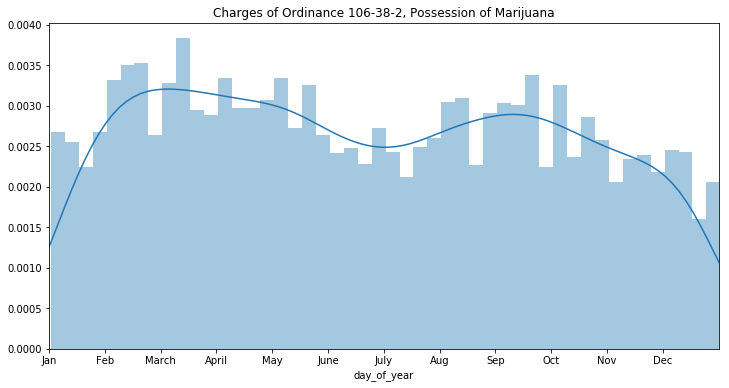

<Figure size 432x288 with 0 Axes>

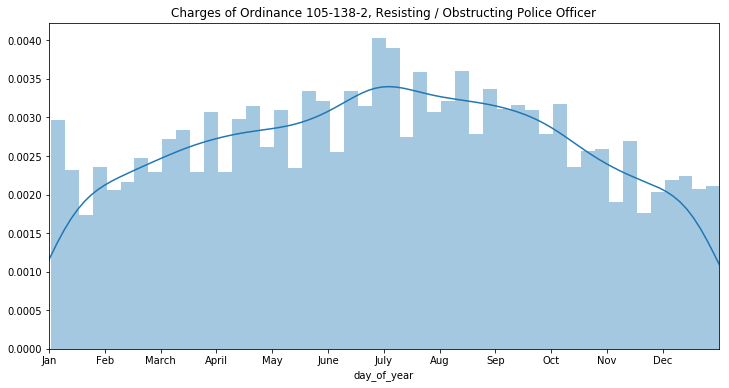

<Figure size 432x288 with 0 Axes>

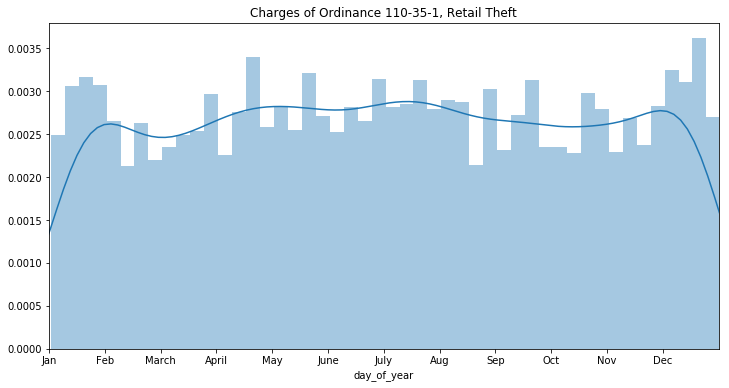

<Figure size 432x288 with 0 Axes>

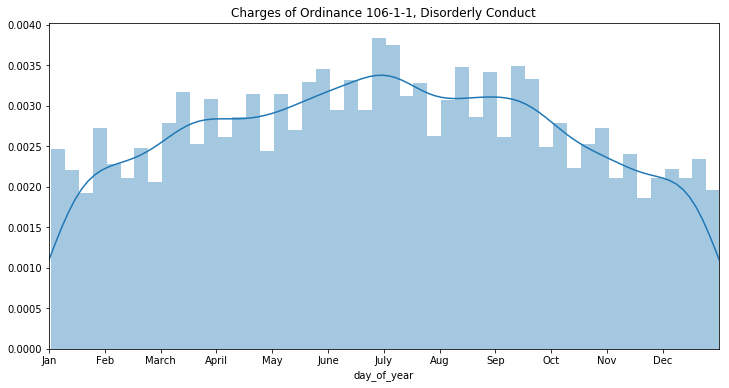

In [194]:
#histograms of yearly charges
for c in range(0, ch):
    plt.clf()
    datac = data[(data['c_violation'] == charges[c])]
    plt.figure(figsize=(12, 6))
    sns.distplot(datac['day_of_year'], bins=48)
    plt.title('Charges of ' + charges[c])
    plt.xlim(1, 365)
    plt.xticks(np.linspace(0, (11*(365/12)), 12), ['Jan', 'Feb', 'March', 'April', 'May', 'June', 'July', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.show()